In [312]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

%matplotlib inline

from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate
import matplotlib.patches as mpatches
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import manifold
#! pip install kmodes
from kmodes.kprototypes import KPrototypes
from sklearn.cluster import KMeans, DBSCAN, MiniBatchKMeans
from sklearn.metrics import silhouette_score,  mean_squared_error
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression 
from matplotlib.patches import Circle
from matplotlib.collections import LineCollection
import string
import os
import math
import shutil 
import random
#! pip install plotly
import plotly.graph_objs as go
from sklearn import model_selection, naive_bayes, svm
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score

import nltk
#nltk.download('stopwords')
#nltk.download('punkt')
#nltk.download('words')
#nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from PIL import Image
from wordcloud import WordCloud

#! pip install tensorflow
from keras.applications.vgg16 import VGG16, decode_predictions
from keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
from keras.layers import Dense
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras import optimizers
from keras.layers import Dense, GlobalMaxPooling2D, Flatten

#! pip install opencv-python
#! pip install opencv-contrib-python

In [2]:
Data = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

Regardons dans un premier temps la forme de nos données et les variables à notre disposition.

In [3]:
Data.shape

(1050, 15)

In [4]:
Data.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."


Nous pouvons voir que la variable product_category_tree contient plusieurs catégories, un "sous chemin" des différentes catégories du produit, il pourra être intéressant de split cette variable.

In [5]:
Data['CategorieSplit'] = Data['product_category_tree'].str.replace('\[\"', '', regex = True)
Data[['Categorie1', 'Categorie2', 'Categorie3', 'Categorie4', 'Categorie5', 'Categorie6', 'Categorie7']] = Data['CategorieSplit'].str.split(' >> ', expand=True)

In [6]:
Data.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,brand,product_specifications,CategorieSplit,Categorie1,Categorie2,Categorie3,Categorie4,Categorie5,Categorie6,Categorie7
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,...,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing >> Curtains & Accessories >> C...,Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet ...,None,None,None
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,...,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care >> Baby Bath & Skin >> Baby Bath Tow...,Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red,...",None,None


Nous pouvons voir qu'il peut exister jusqu'à 7 catégories pour un objet, nous verrons par la suite si cela est intéressant ou non pour nous. En attendant nous pouvons supprimer la variable product_category_tree qui ne nous servira plus.

In [7]:
Data.drop('product_category_tree', axis=1, inplace=True)
Data.drop('CategorieSplit', axis=1, inplace=True)

Regardons maintenant le taux de complétion des différentes variables:

In [8]:
Data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
Categorie1                   0
Categorie2                   0
Categorie3                   3
Categorie4                 371
Categorie5                 645
Categorie6                 923
Categorie7                 993
dtype: int64

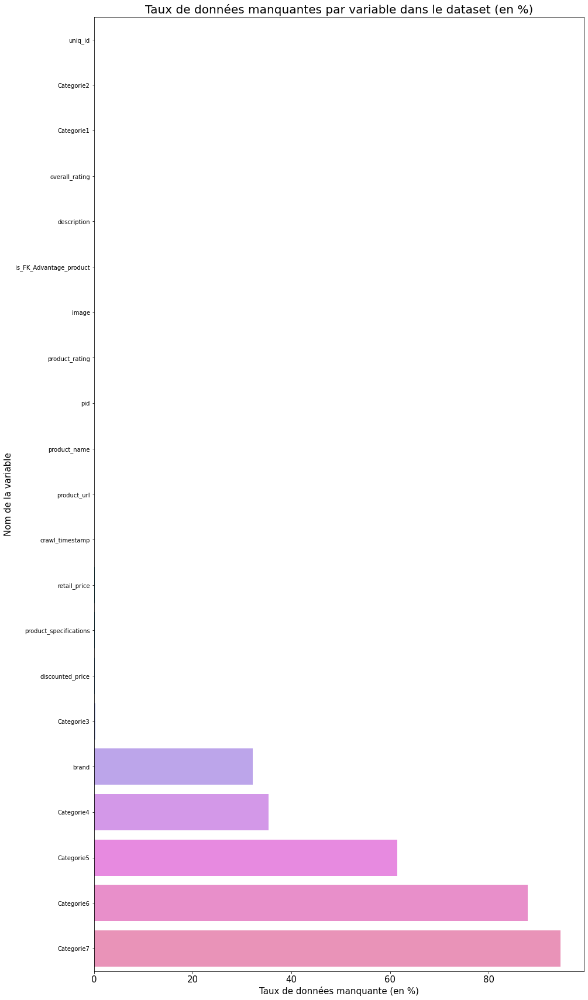

In [9]:
DataNaN = Data.isna().sum().divide(Data.shape[0]).multiply(100).sort_values(ascending = True)
    
plt.figure(figsize=(15, 30))
sns.barplot(x = DataNaN.values, y = DataNaN.index)
plt.xlabel('Taux de données manquante (en %)', fontsize = 15)
plt.ylabel('Nom de la variable', fontsize = 15)
plt.title('Taux de données manquantes par variable dans le dataset (en %)', fontsize = 20)
plt.tick_params(axis='x', which='major', labelsize=15)
plt.tick_params(axis='y', which='major', labelsize=10)
plt.show()

Notre base de données et relativement bien renseigné, il va manquer plus de 30% d'individus pour la variable brand, pour le moment nous ne pouvons pas inférer sur son rôle et si elle sera importante pour nous. Nous allons la garder pour le moment.

Cependant nous pouvons voir qu'à partir de 3 catégories, nous allons avoir énormément de valeurs manquantes, nous ne garderons que 3 catégories pour chaque produit par la suite.

In [10]:
listeCategorie = ['Categorie4', 'Categorie5', 'Categorie6', 'Categorie7']
Data.drop(listeCategorie, axis=1, inplace=True)

Regardons rapidement à quel type d'objet nous aurons affaire.

In [11]:
Data.groupby('Categorie1').count()['uniq_id'].sort_values(ascending=False)

Categorie1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

Nous pouvons voir que les objets sont uniformément répartis en 7 catégories, néanmoins a pu apercevoir que la variable product_category_tree est le chemin du produit entre les différentes catégorie, nous arrêter à la première catégorie n'est pas très informative, nous pouvons au moins regarder la deuxième catégorie pour plus d'information.

In [12]:
Data.groupby('Categorie2').count()['uniq_id'].sort_values(ascending=False)

Categorie2
Wrist Watches                149
Laptop Accessories            87
Infant Wear                   84
Coffee Mugs                   74
Showpieces                    71
                            ... 
Pressure Cookers & Pans        1
Kripa's Home Furnishing        1
Men's Grooming                 1
Beauty Accessories             1
Consumables & Disposables      1
Name: uniq_id, Length: 63, dtype: int64

Pour les visualisations futurs nous donnerons une couleur à chaque catégorie.

In [13]:
Data['IDcatégorie'] = Data['Categorie1'].copy()
map_categorie = {'Baby Care': 0,
                 'Beauty and Personal Care': 1,
                 'Computers': 2,
                 'Home Decor & Festive Needs': 3,
                 'Home Furnishing': 4,
                 'Kitchen & Dining': 5,
                 'Watches': 6
                }

Data['IDcatégorie'] = Data['IDcatégorie'].map(map_categorie)

In [14]:
Data['Couleurcatégorie'] = Data['Categorie1'].copy()
map_couleur = {'Baby Care': '#1f77b4',
                 'Beauty and Personal Care': '#ff7f0e',
                 'Computers': '#2ca02c',
                 'Home Decor & Festive Needs': '#d62728',
                 'Home Furnishing': '#9467bd',
                 'Kitchen & Dining': '#8c564b',
                 'Watches': '#e377c2'
                }

Data['Couleurcatégorie'] = Data['Couleurcatégorie'].map(map_couleur)

### Traitement du texte

Pour la suite il nous est demandé de réaliser un prétraitement de la description des produits.

In [15]:
SEED = np.random.seed(5)

In [16]:
#train, test = train_test_split(Data, test_size = 0.3, random_state = SEED)

Pour la suite nous utiliserons notre jeu d'entraînement.

In [17]:
#test.head(2)

In [18]:
#train.head(2)

Dans un premier temps nous allons récupérer les stopwords anglais en utilisant la librairie stopwords.

In [19]:
sw = stopwords.words('english')
print('Nombre de stopwords:', len(sw))

Nombre de stopwords: 179


Regardons rapidement les mots présents dans le dataset afin de voir si nous pouvons retirer des mots en plus.

In [20]:
stopwords = nltk.corpus.stopwords.words('english')
stop_words = set(stopwords)
words = set(nltk.corpus.words.words())
lemmatizer = WordNetLemmatizer()
porter = PorterStemmer()

Nous allons également retirer les mots de moins de 3 lettres qui ne fourniront pas d'info en général.

In [21]:
listemot = []

In [22]:
def motSup3(text):
    token_words = word_tokenize(text)
    motSup3 = []
    for word in token_words:
        if len(word) >= 3:
            motSup3.append(word)
            motSup3.append(" ")
    return "".join(motSup3)

In [23]:
#train['descriptionMotSup3'] = train['description'].apply(motSup3)

In [24]:
def Preprocess_listofSentence(listofSentence):
    preprocess_list = []
    preprocess_listStem = []
 
    for sentence in listofSentence :
        sentence_w_punct = "".join([i.lower() for i in sentence if i not in string.punctuation])
        sentence_w_num = ''.join(i for i in sentence_w_punct if not i.isdigit())
        tokenize_sentence = nltk.tokenize.word_tokenize(sentence_w_num)
        words_w_stopwords = [i for i in tokenize_sentence if i not in stopwords]

        words_lemmatize = (lemmatizer.lemmatize(w) for w in words_w_stopwords)
        sentence_clean = ' '.join(w for w in words_lemmatize if w.lower() in words or not w.isalpha()) 
        preprocess_list.append(sentence_clean)
        
        words_Stem = (porter.stem(w) for w in words_w_stopwords)
        sentence_cleanStem = ' '.join(words_Stem)
        preprocess_listStem.append(sentence_cleanStem)

    return preprocess_list, preprocess_listStem

In [25]:
preprocess_list, preprocess_listStem = Preprocess_listofSentence(Data['description'])

In [26]:
Data['newDescription'] = preprocess_list
Data['newDescriptionStem'] = preprocess_listStem

In [27]:
Data['newDescription'] = Data['newDescription'].apply(motSup3)
Data['newDescriptionStem'] = Data['newDescriptionStem'].apply(motSup3)

In [28]:
a = Data['newDescription'].str.cat(sep=' ')
words = nltk.tokenize.word_tokenize(a)
listeWords = []
listeWords.append(words)
word_dist = nltk.FreqDist(words)
dataFrequenceMot = pd.DataFrame(word_dist.most_common(25),
                    columns=['Word', 'Frequency'])
print(dataFrequenceMot)

           Word  Frequency
0       product        861
1          free        612
2           buy        581
3      delivery        567
4       genuine        564
5      shipping        564
6          cash        564
7   replacement        559
8         price        557
9           day        552
10    guarantee        471
11          mug        449
12      feature        403
13        watch        355
14        color        354
15         type        324
16         baby        320
17         pack        319
18     material        307
19          set        304
20          box        294
21      general        288
22       cotton        286
23      package        268
24         sale        262


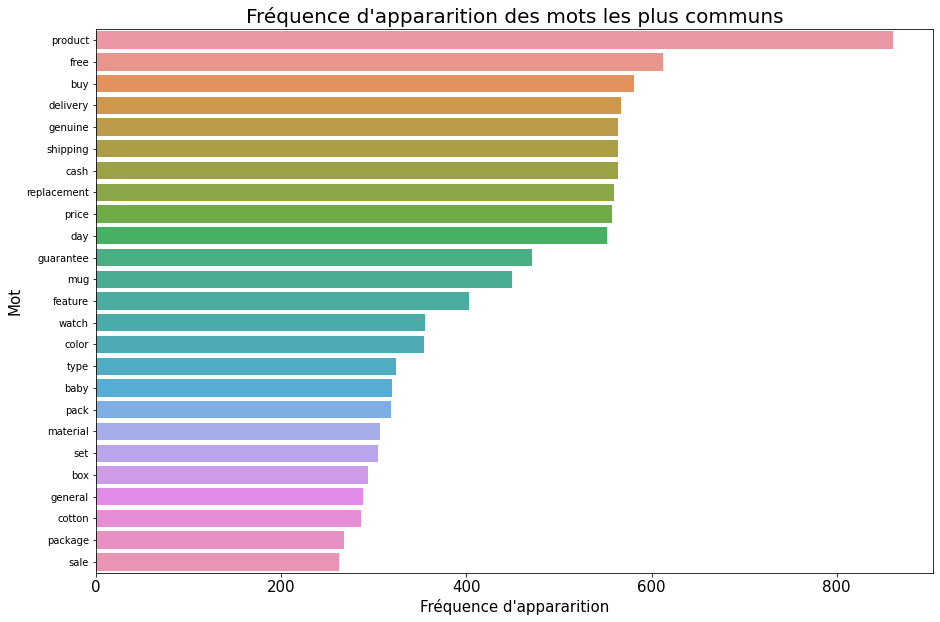

In [29]:
plt.figure(figsize=(15, 10))
sns.barplot(x = dataFrequenceMot['Frequency'], y = dataFrequenceMot['Word'])
plt.xlabel('Fréquence d\'appararition', fontsize = 15)
plt.ylabel('Mot', fontsize = 15)
plt.title('Fréquence d\'appararition des mots les plus communs', fontsize = 20)
plt.tick_params(axis='x', which='major', labelsize=15)
plt.tick_params(axis='y', which='major', labelsize=10)
plt.show()

Pour la suite nous allons transformer notre texte en quelque chose de plus compréhensible pour les différents algorithmes que nous utiliserons par la suite.

Pour chaque approche nous utiliserons les données prétraitées et les données prétraitées ayant subit une lemmatisation ou une racinisation.

### Bag of words

#### CountVectorizer:

#### Avec données prétraitées et lemmatisées:

In [30]:
cnt_vectorizerLemmatize = CountVectorizer(ngram_range=(1,1), stop_words='english')
vectorsCountLemmatize = cnt_vectorizerLemmatize.fit_transform(Data['newDescription'])
cnt_feature_namesLemmatize = cnt_vectorizerLemmatize.get_feature_names()   

In [31]:
dataCNTLemmatize = pd.DataFrame(vectorsCountLemmatize.toarray(), columns = cnt_feature_namesLemmatize)

In [32]:
dataCNTLemmatize.head(5)

,ability,able,abode,abrasion,abroad,absolute,absorbency,absorbent,absorber,absorbing,...,young,youth,youthful,youve,zero,zinc,zip,zipper,zone,zoom
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Essayon avec une phrase simple afin de voir ce que nous obtenons:

In [33]:
exemple = Data['description'][0][0:140]

In [34]:
sentence_clean1 = ['key feature elegance polyester multicolor abstract eyelet door curtain floral polyester multicolor abstract eyelet door']

In [35]:
cnt_vectorizerLemmatizeExemple = CountVectorizer(ngram_range=(1,1), stop_words='english')
vectorsCountLemmatizeExemple = cnt_vectorizerLemmatizeExemple.fit_transform(sentence_clean1)
cnt_feature_namesLemmatizeExemple = cnt_vectorizerLemmatizeExemple.get_feature_names()

In [36]:
dataCNTLemmatize1 = pd.DataFrame(vectorsCountLemmatizeExemple.toarray(), columns = cnt_feature_namesLemmatizeExemple)

In [37]:
print("----- Phrase de départ: -----")
print(exemple, '\n')

sentence_w_punct = "".join([i.lower() for i in exemple if i not in string.punctuation])
sentence_w_num = ''.join(i for i in sentence_w_punct if not i.isdigit()) 
tokenize_sentence = nltk.tokenize.word_tokenize(sentence_w_num)

print("----- Exemple sans stopwords: -----")
words_w_stopwords = " ".join([i for i in tokenize_sentence if i not in stopwords])
print(words_w_stopwords, '\n')

print("----- Tokenization: -----")
tokenize_sentence = nltk.tokenize.word_tokenize(words_w_stopwords)
print(tokenize_sentence, '\n')

words_w_stopwords1 = [i for i in tokenize_sentence if i not in stopwords]

print("----- Phrase racinisée: -----")
words_Stem = (porter.stem(w) for w in words_w_stopwords1)
sentence_cleanStem = ' '.join(words_Stem)
print(sentence_cleanStem, '\n')

print("----- Phrase lemmatisée: -----")
words_lemmatize = (lemmatizer.lemmatize(w) for w in words_w_stopwords1)
sentence_clean = ' '.join(w for w in words_lemmatize if w.lower() in words or not w.isalpha())
print(sentence_clean, '\n')

print("----- Phrase après Bag of words (Countvectorizer): -----")
dataCNTLemmatize1

----- Phrase de départ: -----
Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door 

----- Exemple sans stopwords: -----
key features elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door 

----- Tokenization: -----
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtainelegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door'] 

----- Phrase racinisée: -----
key featur eleg polyest multicolor abstract eyelet door curtain floral curtaineleg polyest multicolor abstract eyelet door 

----- Phrase lemmatisée: -----
key feature elegance polyester multicolor abstract eyelet door curtain floral polyester multicolor abstract eyelet door 

----- Phrase après Bag of words (Countvectorizer): -----


,abstract,curtain,door,elegance,eyelet,feature,floral,key,multicolor,polyester
0,2,1,2,1,2,1,1,1,2,2


#### Avec données prétraitées et racinisées:

In [38]:
cnt_vectorizerStem = CountVectorizer(ngram_range=(1,1), stop_words='english')
vectorsCountStem = cnt_vectorizerStem.fit_transform(Data['newDescriptionStem'])
cnt_feature_namesStem = cnt_vectorizerStem.get_feature_names()  

In [39]:
dataCNTStem = pd.DataFrame(vectorsCountStem.toarray(), columns = cnt_feature_namesStem)

In [40]:
dataCNTStem.head(5)

,aaa,aapno,aari,aarika,abil,abklgrngrngrn,abklplplpnk,abklplpnkpnk,abl,abod,...,zikrak,zinc,zingalalaa,zip,zipexterior,zipper,zone,zoom,zora,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### TF-IDF: 

#### Avec données prétraitées et lemmatisées:

Nous allons maintenant regarder ce que donne l'approche TF-IDF:

In [41]:
tfidf_vectorizer = TfidfVectorizer(sublinear_tf=True, stop_words='english')
vectorsLemmatize = tfidf_vectorizer.fit_transform(Data['newDescription'])
tfidf_feature_namesLemmatize = tfidf_vectorizer.get_feature_names() 
denseLemmatize = vectorsLemmatize.todense()
denselistLemmatize = denseLemmatize.tolist()

In [42]:
dataTFIDLemmatize = pd.DataFrame(denselistLemmatize, columns = tfidf_feature_namesLemmatize)

In [43]:
dataTFIDLemmatize.head(5)

,ability,able,abode,abrasion,abroad,absolute,absorbency,absorbent,absorber,absorbing,...,young,youth,youthful,youve,zero,zinc,zip,zipper,zone,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.130284,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Comme pour Countvectorizer, essayons sur un exemple afin de voir ce que nous allons avoir.

In [44]:
tfidf_vectorizer = TfidfVectorizer(sublinear_tf=True, stop_words='english')
vectorsLemmatizeExemple = tfidf_vectorizer.fit_transform(sentence_clean1)
tfidf_feature_namesLemmatizeExemple = tfidf_vectorizer.get_feature_names() 
denseLemmatizeExemple = vectorsLemmatizeExemple.todense()
denselistLemmatizeExemple = denseLemmatizeExemple.tolist()

In [45]:
dataTFIDLemmatize1 = pd.DataFrame(denselistLemmatizeExemple, columns = tfidf_feature_namesLemmatizeExemple)

In [46]:
print("----- Phrase après Bag of words (TF-IDF): -----")
dataTFIDLemmatize1

----- Phrase après Bag of words (TF-IDF): -----


,abstract,curtain,door,elegance,eyelet,feature,floral,key,multicolor,polyester
0,0.385067,0.227427,0.385067,0.227427,0.385067,0.227427,0.227427,0.227427,0.385067,0.385067


#### Avec données prétraitées et racinisées:

In [47]:
tfidf_vectorizer = TfidfVectorizer(sublinear_tf=True, stop_words='english')
vectorsStem = tfidf_vectorizer.fit_transform(Data['newDescriptionStem'])
tfidf_feature_namesStem = tfidf_vectorizer.get_feature_names() 
denseStem = vectorsStem.todense()
denselistStem = denseStem.tolist()

In [48]:
dataTFIDStem = pd.DataFrame(denselistStem, columns = tfidf_feature_namesStem)

In [49]:
dataTFIDStem.head(5)

,aaa,aapno,aari,aarika,abil,abklgrngrngrn,abklplplpnk,abklplpnkpnk,abl,abod,...,zikrak,zinc,zingalalaa,zip,zipexterior,zipper,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Maintenant que nous avons nos vecteurs nous pouvons essayer de réduire la dimension de ces derniers, mais avant ça regardons si nous pouvons dégager des topics pour les différents individus.

### Potentielles catégories

Afin de structurer automatiquement l’information, afin de pouvoir rapidement accéder à ce qui nous intéresse et filtrer le bruit ainsi que détecter l’apparition de nouveau sujet d’intérêts, nous allons utiliser les méthodes LDA et NMF.

In [50]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        printTopic = "Topic {}: ".format(topic_idx)
        printTopic += " ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]])
        print(printTopic)

### NMF

Bien que précédemment nous regardions et comparions les résultats entre les données prétraitées et les données prétraitées et racinisées ou lemmatisées, nous ne traiterons que les données prétraitées et racinisées ou lemmatisées.

#### NMF sur les vecteurs CountVectorizer

Nous allons regarder ce qu'on obtient avec la base de données racinisée et celle qui ne l'ai pas afin de voir si il y a un impact, ensuite nous regarderons ce que l'on obtient avec l'approche TF-IDF.

Nous regarderons ce que l'on obtient sur les 10 premiers vecteurs:

#### Données prétraitées et racinisées:

In [51]:
no_topics = 10
no_top_words = 10

nmfBagStem = NMF(n_components = no_topics, alpha = .1, l1_ratio = .5, init = 'nndsvd', random_state = SEED).fit(vectorsCountStem)
display_topics(nmfBagStem, cnt_feature_namesStem, no_top_words)

Topic 0: color pack featur materi type box product packag number design
Topic 1: mug coffe perfect gift ceram design bring love enjoy qualiti
Topic 2: product free deliveri ship cash genuin buy day guarante replac
Topic 3: adapt warranti replac vaio power laptop product charger smartpro design
Topic 4: skin laptop shape print pad mous set inch combo warranti
Topic 5: babi girl fabric cotton dress boy sleev neck ideal print
Topic 6: batteri qualiti lapguard laptop pass replac cell includ product high
Topic 7: cotton cover sheet bedsheet inch print pillow doubl flat fit
Topic 8: usb power light vacuum comput use laptop keyboard flexibl fan
Topic 9: ceram mug rockmantra product safe make come craft size materi


C:\Users\Alexis\anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


#### Données prétraitées et lemmatisées:

In [52]:
no_topics = 10
no_top_words = 10

nmfBagLemmatize = NMF(n_components = no_topics, alpha = .1, l1_ratio = .5, init = 'nndsvd', random_state = SEED).fit(vectorsCountLemmatize)
display_topics(nmfBagLemmatize, cnt_feature_namesLemmatize, no_top_words)

Topic 0: feature pack color box number material type model package sale
Topic 1: mug coffee perfect ceramic bring gift quality make happy design
Topic 2: free genuine cash shipping delivery buy product day guarantee replacement
Topic 3: adapter warranty replacement power charger product designed output series current
Topic 4: baby girl fabric cotton dress boy sleeve neck ideal pattern
Topic 5: skin shape set print pad mouse warranty inch multicolor size
Topic 6: battery quality replacement high cell label size performance original factory
Topic 7: ceramic mug material gift safe design come microwave product fresh
Topic 8: cotton cover sheet inch pillow double length flat width package
Topic 9: product bed color king warranty check dimension type material beauty


C:\Users\Alexis\anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


#### NMF sur les vecteurs TF-IDF

#### Données prétraitées et racinisées:

In [53]:
no_topics = 10
no_top_words = 10

nmfStem = NMF(n_components = no_topics, alpha = .1, l1_ratio = .5, init = 'nndsvd', random_state = SEED).fit(vectorsStem)
display_topics(nmfStem, tfidf_feature_namesStem, no_top_words)

Topic 0: best showpiec onlin guarante replac day price ship genuin cash
Topic 1: babi girl fabric cotton sleev neck boy ideal dress pattern
Topic 2: watch analog discount men india great women sonata onlin flipkartcom
Topic 3: rockmantra mug ceram porcelain thrill toodishwash start perman stay pick
Topic 4: abstract blanket doubl singl flipkartcom cash genuin ship deliveri buy
Topic 5: pack model color packag design sale box inch featur materi
Topic 6: mug printland coffe ceram togeth teacoffe coffeetea wardrob morn fantast
Topic 7: flipkartcom combo set cash genuin ship deliveri buy free guarante
Topic 8: laptop batteri cell pavilion lapguard warranti adapt power seri replac
Topic 9: mug coffe bring sip broadcast freedom ink talk forget cupcak


#### Données prétraitées et lemmatisées:

In [54]:
no_topics = 10
no_top_words = 10

nmfLemmatize = NMF(n_components = no_topics, alpha = .1, l1_ratio = .5, init = 'nndsvd', random_state = SEED).fit(vectorsLemmatize)
display_topics(nmfLemmatize, tfidf_feature_namesLemmatize, no_top_words)

Topic 0: guarantee replacement day genuine shipping cash delivery buy free product
Topic 1: watch men discount great boy guarantee replacement day woman shipping
Topic 2: baby girl fabric cotton sleeve neck dress ideal boy pattern
Topic 3: mug ceramic porcelain thrilling permanent stay start pick making creation
Topic 4: abstract single blanket double quilt comforter shipping cash genuine delivery
Topic 5: color pack model inch box package feature sale material number
Topic 6: showpiece best price handicraft guarantee replacement day exotic buy genuine
Topic 7: mug ceramic coffee perfect wardrobe morning serve fantastic adorable gift
Topic 8: towel bath cotton set genuine shipping cash delivery buy free
Topic 9: dial strap maximum watch resistant woman water clasp round case


### LDA

Comme pour NMF nous regardons les 10 premiers vecteurs seulement, afin de voir ce que nous obtenons.

#### LDA sur les vecteurs CountVectorizer

#### Données prétraitées et racinisées:

In [55]:
n_topics = 10
no_top_words = 10

ldaBagStem = LatentDirichletAllocation(n_components = n_topics, random_state = SEED).fit(vectorsCountStem)
display_topics(ldaBagStem, cnt_feature_namesStem, no_top_words)

Topic 0: mug ceram coffe perfect design gift qualiti batteri love enjoy
Topic 1: towel skin bottl soft price bath design pack water materi
Topic 2: laptop usb light shape skin inch led multicolor power sheet
Topic 3: watch analog product men onlin day guarante replac free deliveri
Topic 4: adapt warranti laptop product replac power charger vaio fit boy
Topic 5: babi cotton girl pack packag color gener sale box featur
Topic 6: price babi art use qualiti print make home oil decor
Topic 7: wall warranti sticker pack featur cover type product use number
Topic 8: ceram design mug craft rockmantra product featur safe day materi
Topic 9: ship deliveri buy free cash genuin product flipkartcom guarante day


#### Données prétraitées et lemmatisées:

In [56]:
n_topics = 10
no_top_words = 10

ldaBagLemmatize = LatentDirichletAllocation(n_components = n_topics, random_state = SEED).fit(vectorsCountLemmatize)
display_topics(ldaBagLemmatize, cnt_feature_namesLemmatize, no_top_words)

Topic 0: baby girl fabric boy cotton dress ideal sleeve general neck
Topic 1: hair design polyester curtain bottle type eyelet paper body door
Topic 2: mug ceramic perfect coffee gift design material price product safe
Topic 3: skin shape pizza pad print set mouse steel warranty inch
Topic 4: free delivery shipping genuine cash buy product day guarantee replacement
Topic 5: towel set product price bath cotton home face art lip
Topic 6: color feature material box type model pack dimension general number
Topic 7: warranty adapter battery replacement power quality product charger covered series
Topic 8: showpiece price best product free delivery day guarantee replacement cash
Topic 9: cotton cover package inch sale pack feature number color cushion


#### LDA sur les vecteurs TF-IDF

#### Données prétraitées et racinisées:

In [57]:
n_topics = 10
no_top_words = 10

ldaStem = LatentDirichletAllocation(n_components = n_topics, random_state = SEED).fit(vectorsStem)
display_topics(ldaStem, tfidf_feature_namesStem, no_top_words)

Topic 0: flipkartcom ship genuin cash deliveri buy free product watch day
Topic 1: showpiec decker lal musician best rajasthani ecraftindia andr anna beautiful
Topic 2: inch print cover multicolor model brand type packag pack sale
Topic 3: golmaalshop fashion ocean wow multicolour island superpow majesti bubbl spethnic
Topic 4: warranti power adapt servic cover charger manufactur pleas damag laptop
Topic 5: guarante onlin replac day genuin cash ship deliveri buy best
Topic 6: usb cell laptop batteri replac guarante free day buy cash
Topic 7: monster hookah smj nirlon bong simoco maserati babybucket gmwht true
Topic 8: babi fabric girl cotton pattern pack ideal sleev print neck
Topic 9: towel cotton bath rice cotonex birthday light soft face happi


#### Données prétraitées et racinisées:

In [58]:
n_topics = 10
no_top_words = 10

ldaLemmatize = LatentDirichletAllocation(n_components = n_topics, random_state = SEED).fit(vectorsLemmatize)
display_topics(ldaLemmatize, tfidf_feature_namesLemmatize, no_top_words)

Topic 0: warranty adapter mug covered charger designed happy power special like
Topic 1: collection branded shop clothes satin envy apparel lunch lace soft
Topic 2: cotton golden towel soft sheet hair single bleach bed hand
Topic 3: towel bath cotton skin print mouse shape pad warranty inch
Topic 4: cover cushion material width inch model dimension pack number color
Topic 5: baby girl fabric cotton feature ideal specification general pattern sleeve
Topic 6: polyester curtain eyelet door design lamp aroma self bottle comfort
Topic 7: watch men discount great woman guarantee replacement day genuine shipping
Topic 8: cash shipping genuine delivery buy free product guarantee replacement day
Topic 9: mug ceramic sticker vinyl wood design cartoon medium sized collection


Dans l'ensemble nous voyons que des topics sont exploitables, nous connaissons assez facilement le sujet principal de chaque individus, certes ce n'est pas de manière très précise pour certains individus mais nous pouvons nous en sortir.

### Réduction de dimension et visualisation des données

Regardons la forme des bases de données de base afin de voir si la réduction est intéressante ou non.

In [59]:
print('Forme de la base de données dataTFID: ', dataTFIDLemmatize.shape)
print('Forme de la base de données dataTFIDStem (même jeu de donnée que la base dataTFID mais les mots sont racinisés): ', dataTFIDStem.shape)

Forme de la base de données dataTFID:  (1050, 2945)
Forme de la base de données dataTFIDStem (même jeu de donnée que la base dataTFID mais les mots sont racinisés):  (1050, 4347)


Pour nous aider pour la légende nous allons créer un dataset récapitulant rapidement les informations nécessaires:

In [60]:
dfCouleurs = pd.DataFrame()
dfCouleurs['Categorie1'] = Data['Categorie1'].unique()
dfCouleurs['Couleurcatégorie'] = Data['Couleurcatégorie'].unique()

In [61]:
dfCouleurs

,Categorie1,Couleurcatégorie
0,Home Furnishing,#9467bd
1,Baby Care,#1f77b4
2,Watches,#e377c2
3,Home Decor & Festive Needs,#d62728
4,Kitchen & Dining,#8c564b
5,Beauty and Personal Care,#ff7f0e
6,Computers,#2ca02c


#### ACP avec CountVectorizer

#### Données racinisées

In [62]:
acpCNTStem = PCA(n_components=0.95)
df_reducedCNTStem = acpCNTStem.fit_transform(dataCNTStem)
print(df_reducedCNTStem.shape)
#print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100))

(1050, 306)


In [63]:
X_acpCNTStem = dataCNTStem.values
featuresCNTStem = dataCNTStem.columns

In [64]:
pcsCNTStem = acpCNTStem.components_
pca_graphCNTStem = PCA()
df_reduced_graphCNTStem = pca_graphCNTStem.fit_transform(dataCNTStem)

scree_graphCNTStem = pca_graphCNTStem.explained_variance_ratio_ * 100

<BarContainer object of 1050 artists>

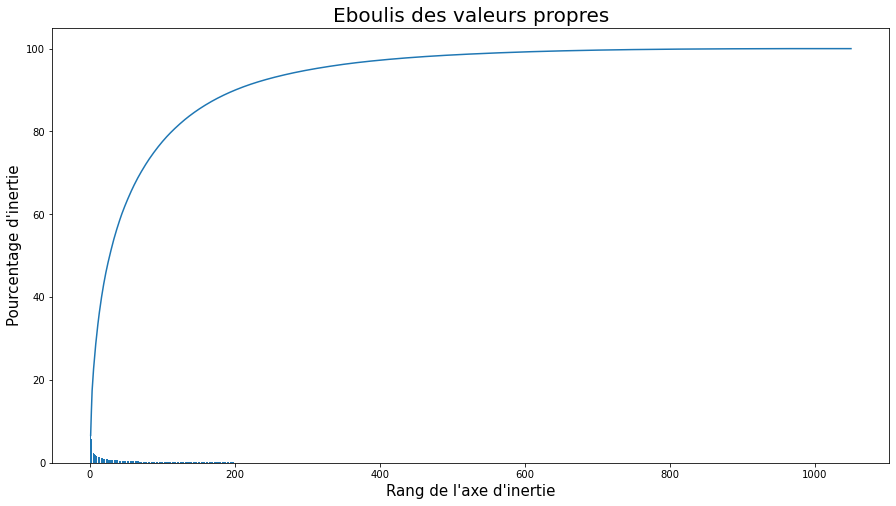

In [65]:
plt.figure(figsize=(15, 8))

plt.title("Eboulis des valeurs propres", fontsize = 20)
plt.xlabel("Rang de l'axe d'inertie", fontsize = 15)
plt.ylabel("Pourcentage d'inertie", fontsize = 15)
plt.plot(np.arange(len(scree_graphCNTStem))+1, scree_graphCNTStem.cumsum())
plt.bar(np.arange(len(scree_graphCNTStem))+1, scree_graphCNTStem)

#### Données lemmatisées:

In [66]:
acpCNTLemmatize = PCA(n_components=0.95)
df_reducedCNTLemmatize = acpCNTLemmatize.fit_transform(dataCNTLemmatize)
print(df_reducedCNTLemmatize.shape)
#print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100))

(1050, 246)


In [67]:
X_acpCNTLemmatize = dataCNTLemmatize.values
featuresCNTLemmatize = dataCNTLemmatize.columns

In [68]:
pcsCNTLemmatize = acpCNTLemmatize.components_
pca_graphCNTLemmatize = PCA()
df_reduced_graphCNTLemmatize = pca_graphCNTLemmatize.fit_transform(dataCNTLemmatize)

scree_graphCNTLemmatize = pca_graphCNTLemmatize.explained_variance_ratio_ * 100

<BarContainer object of 1050 artists>

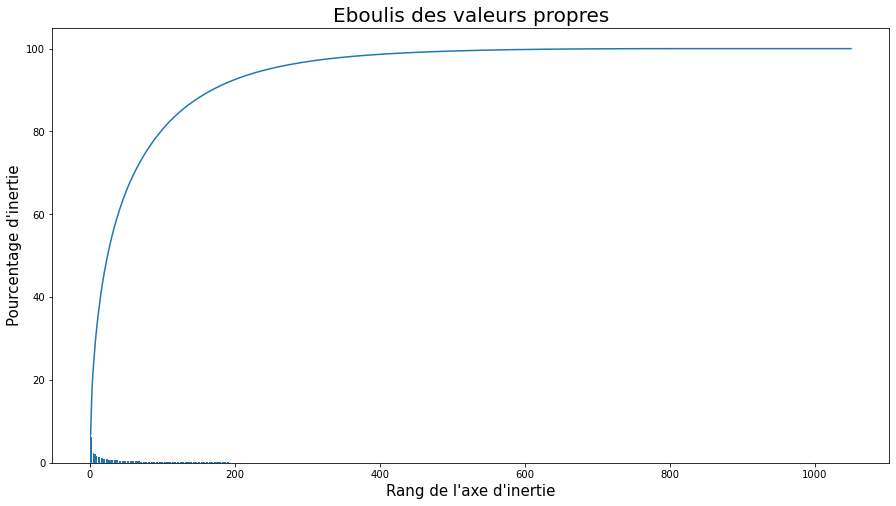

In [69]:
plt.figure(figsize=(15, 8))

plt.title("Eboulis des valeurs propres", fontsize = 20)
plt.xlabel("Rang de l'axe d'inertie", fontsize = 15)
plt.ylabel("Pourcentage d'inertie", fontsize = 15)
plt.plot(np.arange(len(scree_graphCNTLemmatize))+1, scree_graphCNTLemmatize.cumsum())
plt.bar(np.arange(len(scree_graphCNTLemmatize))+1, scree_graphCNTLemmatize)

#### ACP avec TF-IDF

#### Données racinisées

In [70]:
acpStem = PCA(n_components=0.95)
df_reducedStem = acpStem.fit_transform(dataTFIDStem)
print(df_reducedStem.shape)
#print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100))

(1050, 672)


Nous pouvons voir que la réduction de dimension est intéressante.

In [71]:
X_acpStem = dataTFIDStem.values
featuresStem = dataTFIDStem.columns
pcs = acpStem.components_

In [72]:
pca_graphStem = PCA()
df_reduced_graphStem = pca_graphStem.fit_transform(dataTFIDStem)

scree_graphStem = pca_graphStem.explained_variance_ratio_ * 100

<BarContainer object of 1050 artists>

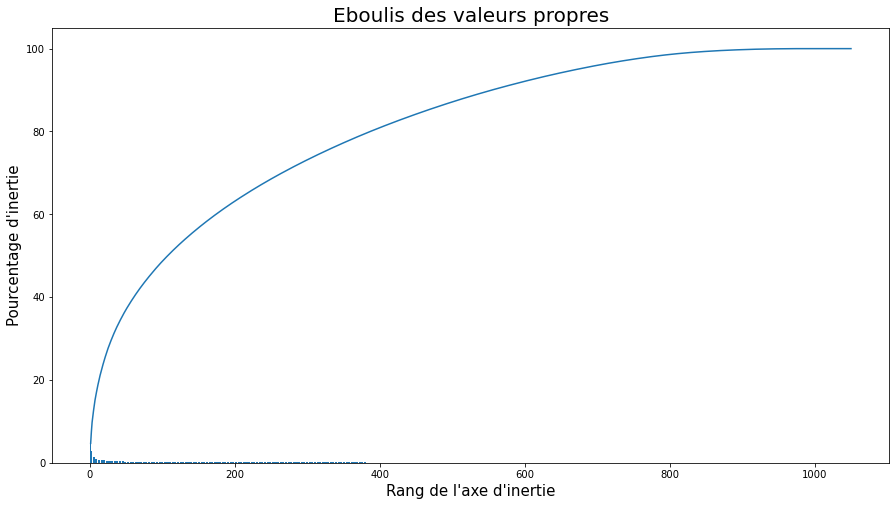

In [73]:
plt.figure(figsize=(15, 8))
plt.title("Eboulis des valeurs propres", fontsize = 20)
plt.xlabel("Rang de l'axe d'inertie", fontsize = 15)
plt.ylabel("Pourcentage d'inertie", fontsize = 15)
plt.plot(np.arange(len(scree_graphStem))+1, scree_graphStem.cumsum())
plt.bar(np.arange(len(scree_graphStem))+1, scree_graphStem)

#### Données lemmatisées

In [74]:
acpLemmatize = PCA(n_components=0.95)
df_reducedLemmatize = acpLemmatize.fit_transform(dataTFIDLemmatize)
print(df_reducedLemmatize.shape)
#print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100))

(1050, 496)


Nous pouvons voir que la réduction de dimension est intéressante également.

In [75]:
X_acpLemmatize = dataTFIDLemmatize.values
featuresLemmatize = dataTFIDLemmatize.columns

In [76]:
pcsLemmatize = acpLemmatize.components_
pca_graphLemmatize = PCA()
df_reduced_graphLemmatize = pca_graphLemmatize.fit_transform(dataTFIDLemmatize)

scree_graphLemmatize = pca_graphLemmatize.explained_variance_ratio_ * 100

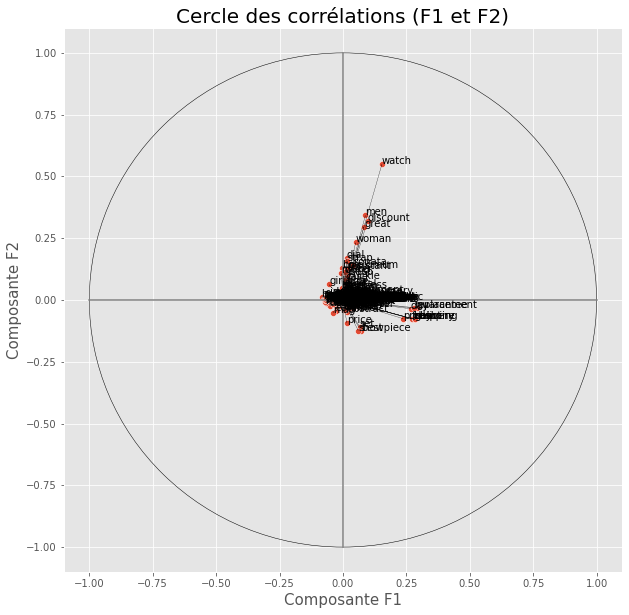

In [313]:
plt.figure(figsize=(10, 10))

plt.title('Cercle des corrélations (F1 et F2)', fontsize = 20)
plt.xlabel('Composante F1', fontsize = 15)
plt.ylabel('Composante F2', fontsize = 15)

plt.gca().add_patch(Circle([0,0], radius=1, color='black', fill=False, linestyle='-', clip_on=False))

sns.scatterplot(x = pcsLemmatize[0,:], y = pcsLemmatize[1,:])
plt.plot([-1, 1], [0, 0], color='grey', ls='-')
plt.plot([0, 0], [-1, 1], color='grey', ls='-')

for x, y, feature in zip(pcsLemmatize[0,:], pcsLemmatize[1,:], featuresLemmatize):
    plt.annotate(feature, (x, y)) 
    plt.gca().quiver(0, 0, x, y, angles = 'xy', scale_units = 'xy', scale = 1, width = 0.0005)

<BarContainer object of 1050 artists>

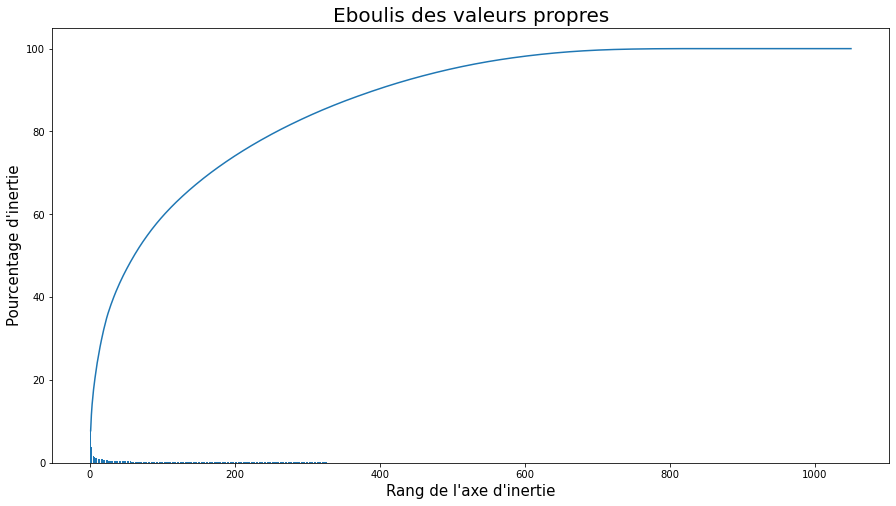

In [77]:
plt.figure(figsize=(15, 8))

plt.title("Eboulis des valeurs propres", fontsize = 20)
plt.xlabel("Rang de l'axe d'inertie", fontsize = 15)
plt.ylabel("Pourcentage d'inertie", fontsize = 15)
plt.plot(np.arange(len(scree_graphLemmatize))+1, scree_graphLemmatize.cumsum())
plt.bar(np.arange(len(scree_graphLemmatize))+1, scree_graphLemmatize)

Nous pouvons voir que les données sont "plus réduite" avec Countvectorizer qu'avec TF-IDF de manière général, de même les données lemmatisées seront plus réduites que les données racinisées.

Nous regarderons par la suite ce qui donne les meilleurs résultats bien évidemment.

### T-SNE

Regardons maintenant ce que nous avons avec T-SNE:

#### T-SNE avec CountVectorize

#### Données racinisées

In [78]:
tsneCNTStem = manifold.TSNE(n_components=2, init = 'pca', n_jobs=-1)
X_tsneCNTStem = tsneCNTStem.fit_transform(dataCNTStem)
X_tsneCNTStem.shape

(1050, 2)

#### Données lemmatisées

In [79]:
tsneCNTLemmatize = manifold.TSNE(n_components=2, init = 'pca', n_jobs=-1)
X_tsneCNTLemmatize = tsneCNTLemmatize.fit_transform(dataCNTLemmatize)
X_tsneCNTLemmatize.shape

(1050, 2)

#### T-SNE avec TF-IDF:

#### Données racinisées:

In [80]:
tsneStem = manifold.TSNE(n_components=2, init = 'pca', n_jobs=-1)
X_tsneStem = tsneStem.fit_transform(dataTFIDStem)
X_tsneStem.shape

(1050, 2)

#### Données lemmatisées:

In [81]:
tsneLemmatize = manifold.TSNE(n_components=2, init = 'pca', n_jobs=-1)
X_tsneLemmatize = tsneLemmatize.fit_transform(dataTFIDLemmatize)
X_tsneLemmatize.shape

(1050, 2)

Nous pouvons voir que T-SNE réduit plus les données que l'ACP, nous pouvons aussi voir que peut importe ce que l'on prend, que ce soit Bag of words ou TF-IDF, que les données soit racinisées ou non, nous avons 2 features en sortie.

### Clustering 

Nous avons pu voir que T-SNE donne les meilleurs réduction, nous nous servirons ses features pour la suite, mais regardons tout de même ce que ça nous donne avec ACP.

Bien que nous avons vu que la réduction est "la même" pour les deux approches CountVectorizer et TF-IDF, nous regarderons le coefficient de silhouette afin de voir s'il existe une différence ou non.

#### KMeans avec ACP

#### CountVectorizer

#### Données racinisées:

In [82]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseCNTStem = [] 
silhouetteCNTStem = []
labelsCNTStem = []
listeKMeansCNTStem = []


for i in n_clusters:
    KmeansCNTStem = KMeans(n_clusters=i, **kmeans_kwargs).fit(df_reducedCNTStem)
    labelsCNTStem.append(KmeansCNTStem.labels_)
    listeKMeansCNTStem.append(KmeansCNTStem)
    sseCNTStem.append(KmeansCNTStem.inertia_)
    silhouette_avgCNTStem = silhouette_score(df_reducedCNTStem, KmeansCNTStem.labels_, metric='euclidean')
    silhouetteCNTStem.append(silhouette_avgCNTStem)

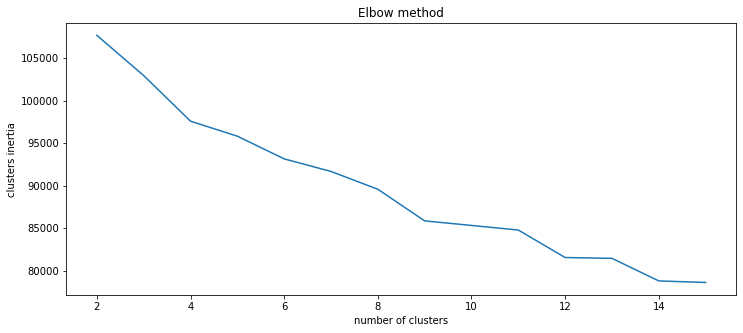

In [83]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseCNTStem, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

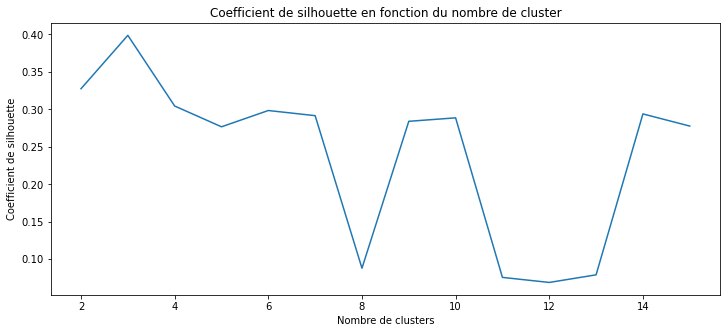

In [84]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteCNTStem, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

#### Données lemmatisées:

In [85]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseCNTLemmatize = [] 
silhouetteCNTLemmatize = []
labelsCNTLemmatize = []
listeKMeansCNTLemmatize = []


for i in n_clusters:
    KmeansCNTLemmatize = KMeans(n_clusters=i, **kmeans_kwargs).fit(df_reducedCNTLemmatize)
    labelsCNTLemmatize.append(KmeansCNTLemmatize.labels_)
    listeKMeansCNTLemmatize.append(KmeansCNTLemmatize)
    sseCNTLemmatize.append(KmeansCNTLemmatize.inertia_)
    silhouette_avgCNTLemmatize = silhouette_score(df_reducedCNTLemmatize, KmeansCNTLemmatize.labels_, metric='euclidean')
    silhouetteCNTLemmatize.append(silhouette_avgCNTLemmatize)

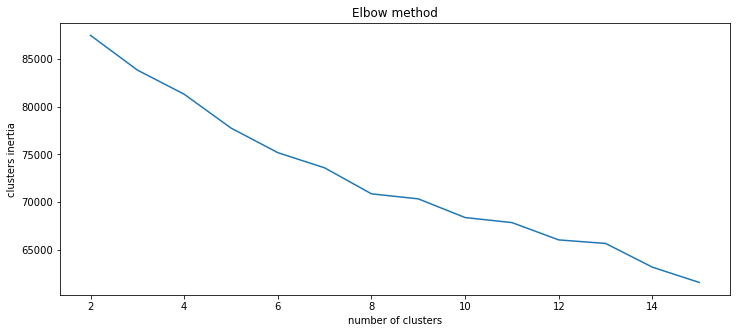

In [86]:
ig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseCNTLemmatize, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

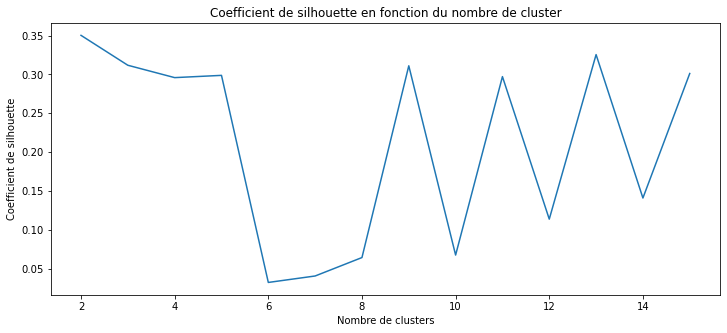

In [87]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteCNTLemmatize, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

#### TF-IDF

#### Données racinisées:

In [88]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseStem = [] 
silhouetteStem = []
labelsStem = []
listeKMeansStem = []

for i in n_clusters:
    KmeansStem = KMeans(n_clusters=i, **kmeans_kwargs).fit(df_reducedStem)
    labelsStem.append(KmeansStem.labels_)
    listeKMeansStem.append(KmeansStem)
    sseStem.append(KmeansStem.inertia_)
    silhouette_avgStem = silhouette_score(df_reducedStem, KmeansStem.labels_, metric='euclidean')
    silhouetteStem.append(silhouette_avgStem)

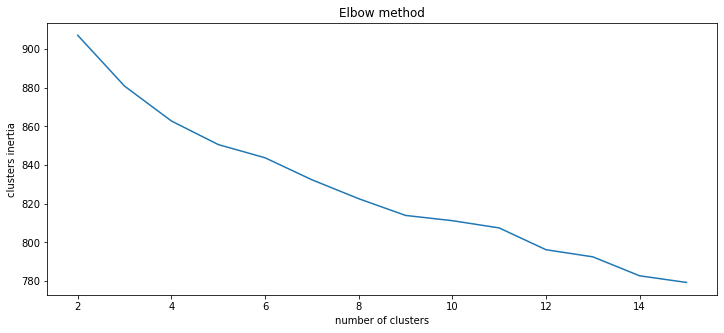

In [89]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseStem, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

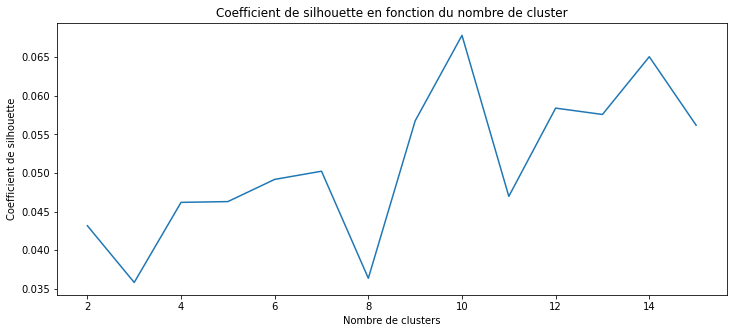

In [90]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteStem, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

#### Données lemmatisées:

In [91]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseLemmatize = [] 
silhouetteLemmatize = []
labelsLemmatize = []
listeKMeansLemmatize = []


for i in n_clusters:
    KmeansLemmatize = KMeans(n_clusters=i, **kmeans_kwargs).fit(df_reducedLemmatize)
    labelsLemmatize.append(KmeansLemmatize.labels_)
    listeKMeansLemmatize.append(KmeansLemmatize)
    sseLemmatize.append(KmeansLemmatize.inertia_)
    silhouette_avgLemmatize = silhouette_score(df_reducedLemmatize, KmeansLemmatize.labels_, metric='euclidean')
    silhouetteLemmatize.append(silhouette_avgLemmatize)

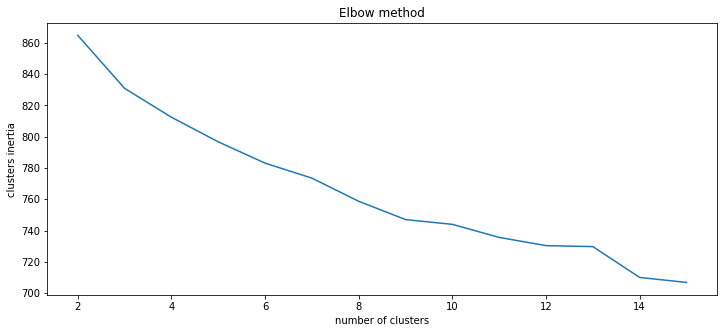

In [92]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseLemmatize, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

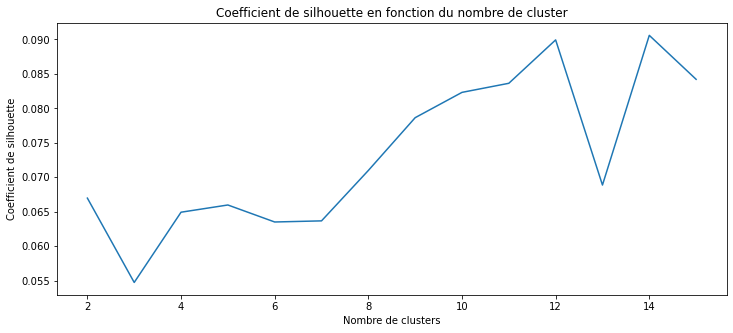

In [93]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteLemmatize, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

#### KMeans avec T-SNE

#### CountVectorizer

#### Données racinisées:

In [94]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseXCNTStem = [] 
silhouetteXCNTStem = []
labelsXCNTStem = []
listeKMeansXCNTStem = []


for i in n_clusters:
    KmeansXCNTStem = KMeans(n_clusters=i, **kmeans_kwargs).fit(X_tsneCNTStem)
    labelsXCNTStem.append(KmeansXCNTStem.labels_)
    listeKMeansXCNTStem.append(KmeansXCNTStem)
    sseXCNTStem.append(KmeansXCNTStem.inertia_)
    silhouette_avgXCNTStem = silhouette_score(X_tsneCNTStem, KmeansXCNTStem.labels_, metric='euclidean')
    silhouetteXCNTStem.append(silhouette_avgXCNTStem)

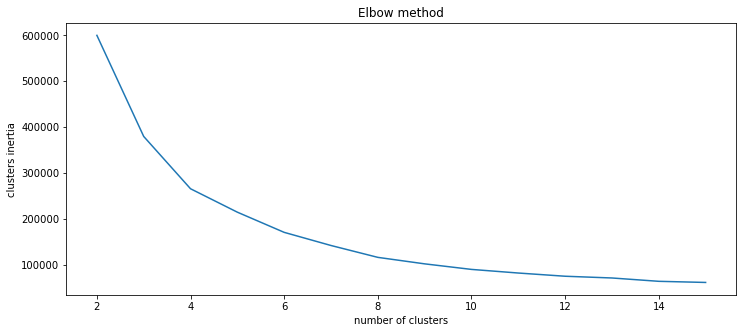

In [95]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseXCNTStem, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

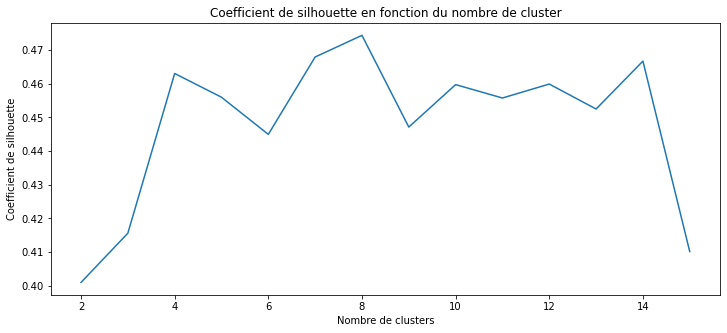

In [96]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteXCNTStem, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

#### Données lemmatisées:

In [97]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseXCNTLemmatize = [] 
silhouetteXCNTLemmatize = []
labelsXCNTLemmatize = []
listeKMeansXCNTLemmatize = []


for i in n_clusters:
    KmeansXCNTLemmatize = KMeans(n_clusters=i, **kmeans_kwargs).fit(X_tsneCNTLemmatize)
    labelsXCNTLemmatize.append(KmeansXCNTLemmatize.labels_)
    listeKMeansXCNTLemmatize.append(KmeansXCNTLemmatize)
    sseXCNTLemmatize.append(KmeansXCNTLemmatize.inertia_)
    silhouette_avgXCNTLemmatize = silhouette_score(X_tsneCNTLemmatize, KmeansXCNTLemmatize.labels_, metric='euclidean')
    silhouetteXCNTLemmatize.append(silhouette_avgXCNTLemmatize)

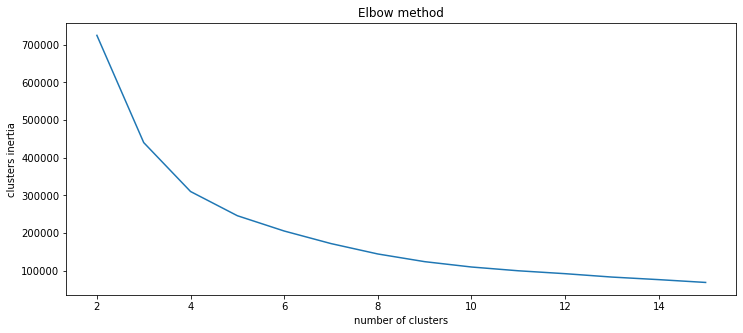

In [98]:
ig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseXCNTLemmatize, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

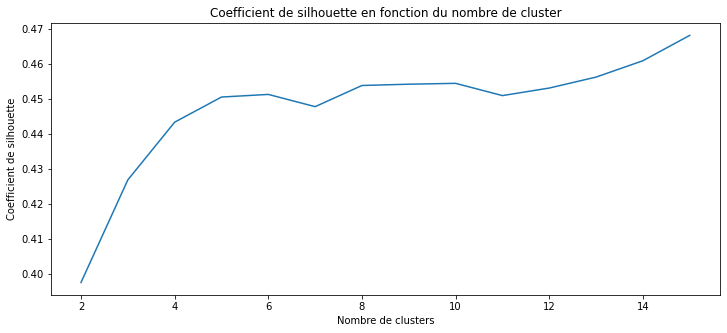

In [99]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteXCNTLemmatize, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

#### TF-IDF

#### Données racinisées:

In [100]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseXStem = [] 
silhouetteXStem = []
labelsXStem = []
listeKMeansXStem = []

for i in n_clusters:
    KmeansXStem = KMeans(n_clusters=i, **kmeans_kwargs).fit(X_tsneStem)
    labelsXStem.append(KmeansXStem.labels_)
    listeKMeansXStem.append(KmeansXStem)
    sseXStem.append(KmeansXStem.inertia_)
    silhouette_avgXStem = silhouette_score(X_tsneStem, KmeansXStem.labels_, metric='euclidean')
    silhouetteXStem.append(silhouette_avgXStem)

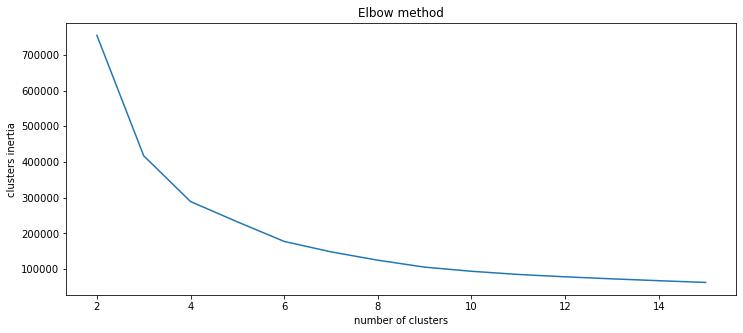

In [101]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseXStem, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

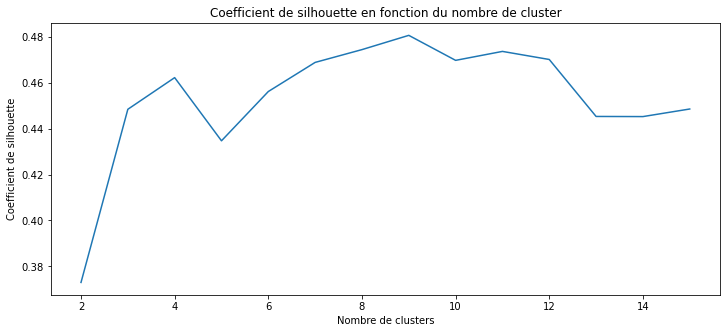

In [102]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteXStem, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

#### Données lemmatisées:

In [103]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sseXLemmatize = [] 
silhouetteXLemmatize = []
labelsXLemmatize = []
listeKMeansXLemmatize = []

for i in n_clusters:
    KmeansXLemmatize = KMeans(n_clusters=i, **kmeans_kwargs).fit(X_tsneLemmatize)
    labelsXLemmatize.append(KmeansXLemmatize.labels_)
    listeKMeansXLemmatize.append(KmeansXLemmatize)
    sseXLemmatize.append(KmeansXLemmatize.inertia_)
    silhouette_avgXLemmatize = silhouette_score(X_tsneLemmatize, KmeansXLemmatize.labels_, metric='euclidean')
    silhouetteXLemmatize.append(silhouette_avgXLemmatize)

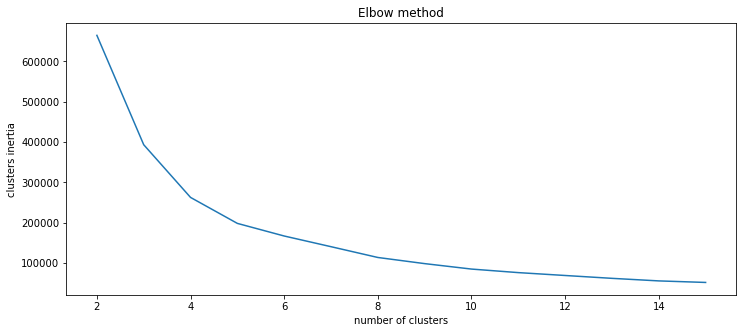

In [104]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sseXLemmatize, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

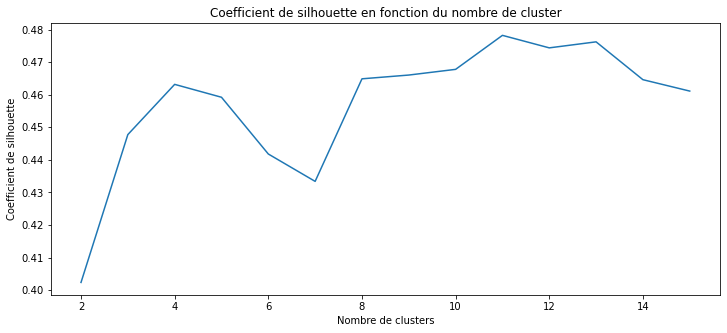

In [105]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouetteXLemmatize, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

Comme nous pouvions nous y attendre Kmeans avec T-SNE donne les meilleurs résulats. Les approches avec données lemmatisées donnent des résultats légèrement meilleur en terme de coefficient de silhouette. L'approche TF-IDF donne de meilleurs résultats même si c'est léger.

Regardons le représentation T-SNE:

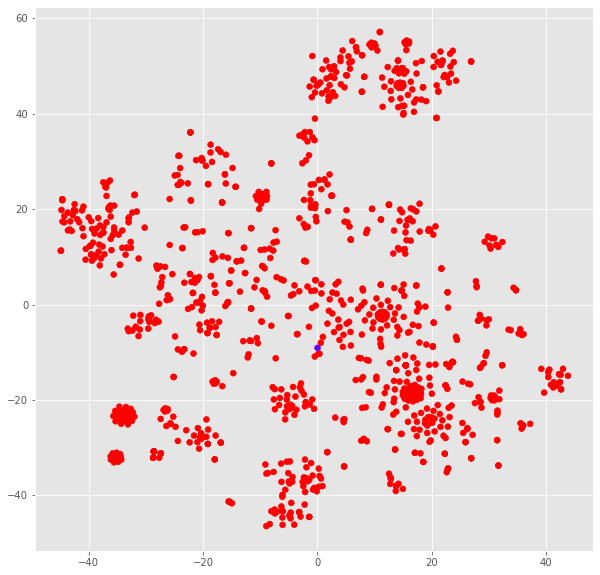

In [301]:
plt.figure(figsize=(10,10))
plt.scatter(*zip(*X_tsneLemmatize[:,:2]), c = X_acp[:,2], cmap = 'hsv')
plt.show()

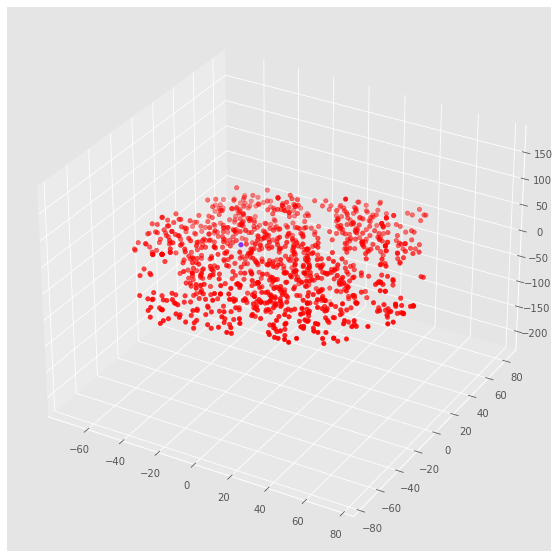

In [303]:
tsne_X_31 = manifold.TSNE(n_components=3, init = 'pca', n_jobs=-1)
X_tsne_31 = tsne_X_31.fit_transform(dataTFIDLemmatize)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(*zip(*X_tsne_31), c=X_acpLemmatize[:,2], cmap='hsv')
plt.show()

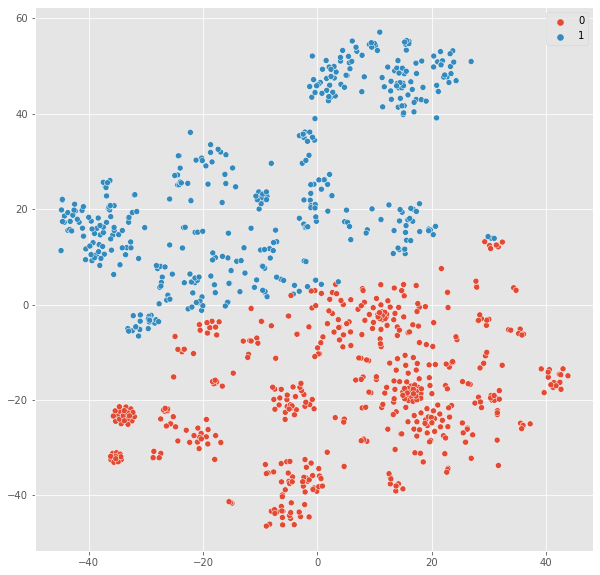

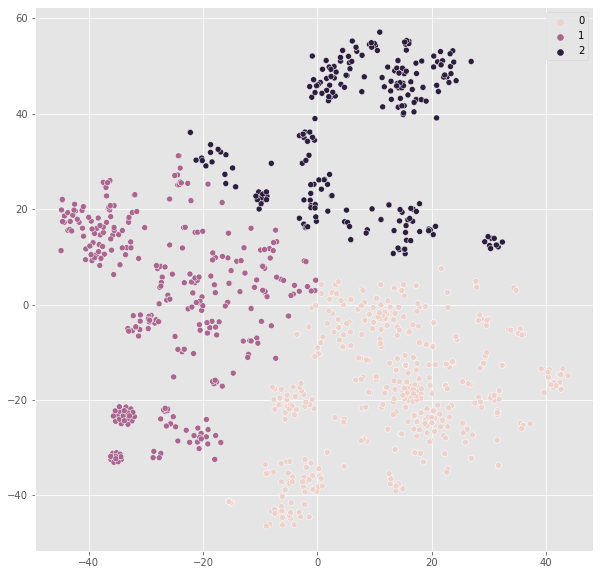

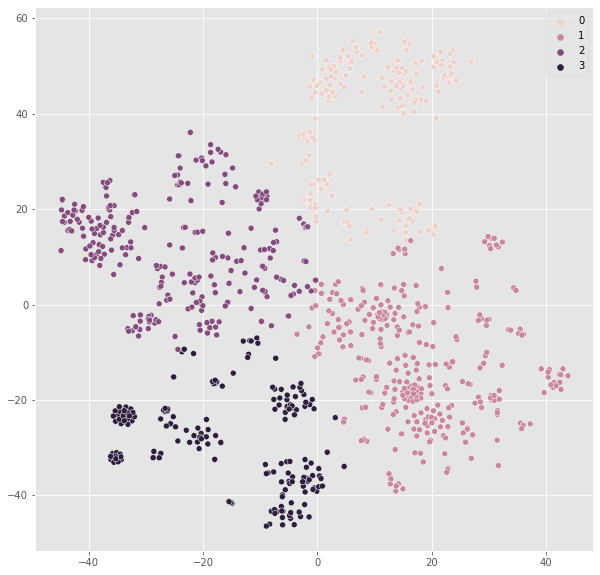

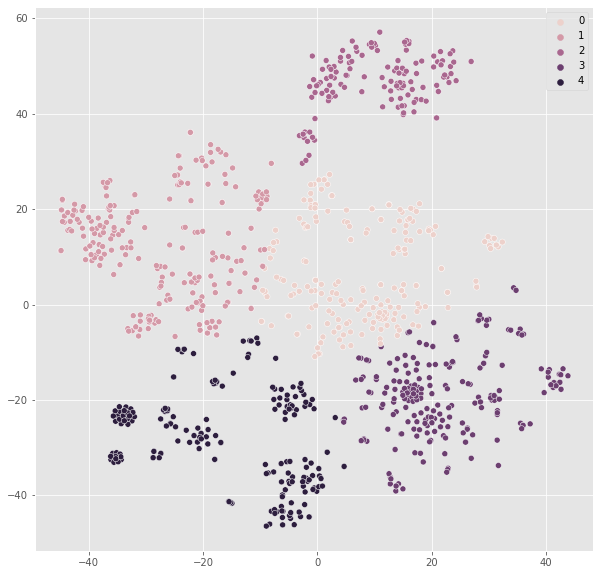

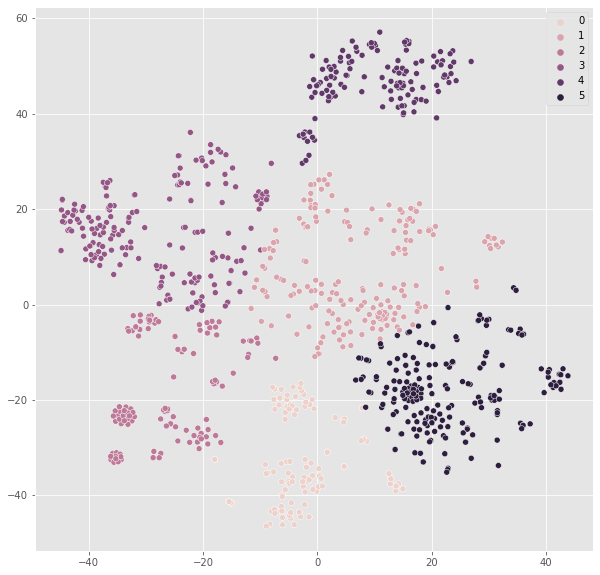

...

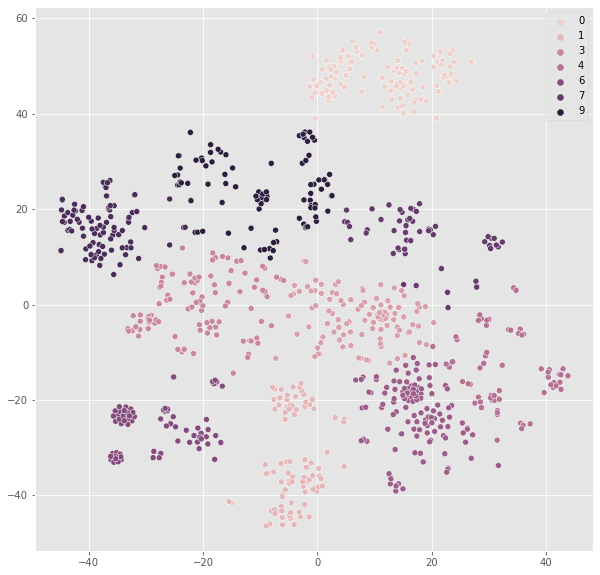

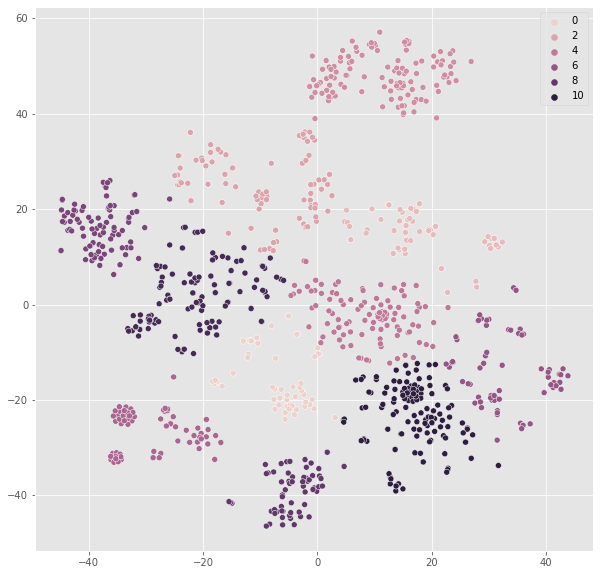

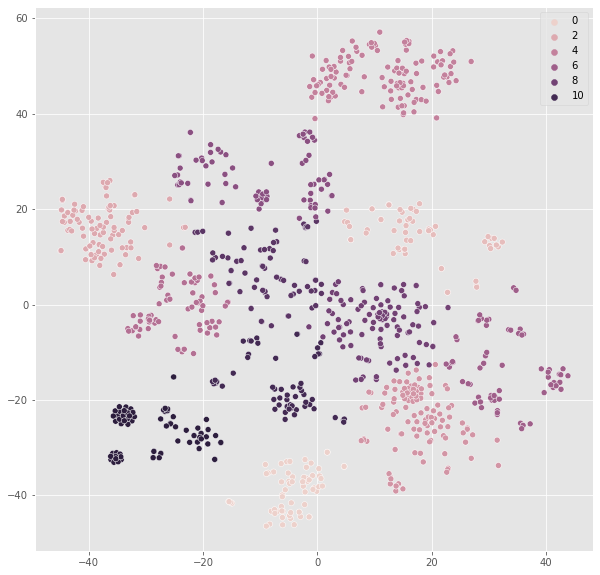

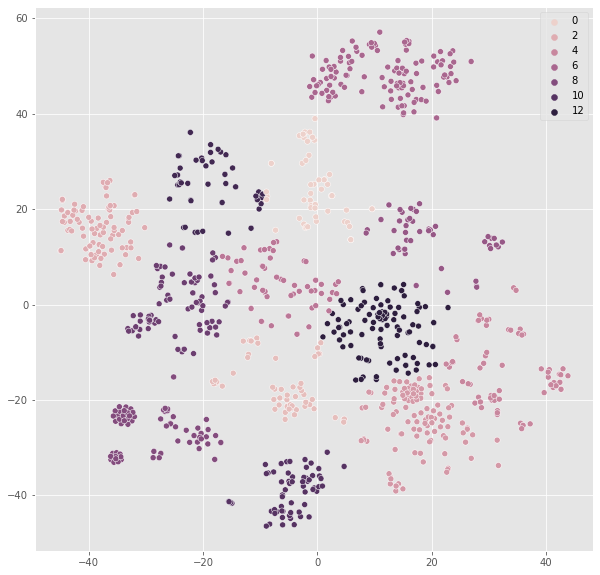

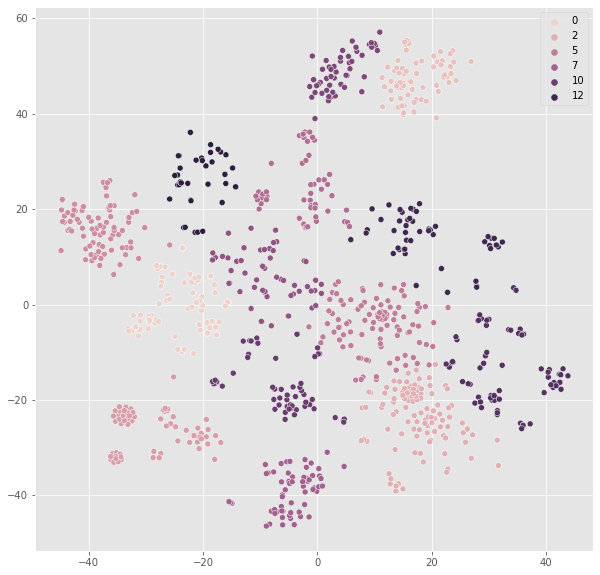

In [308]:
for i in range(0, 13, 1):
    plt.figure(figsize = (10, 10))
    sns.scatterplot(x = X_tsneLemmatize[:, 0], y = X_tsneLemmatize[:, 1], hue = labelsXLemmatize[i])

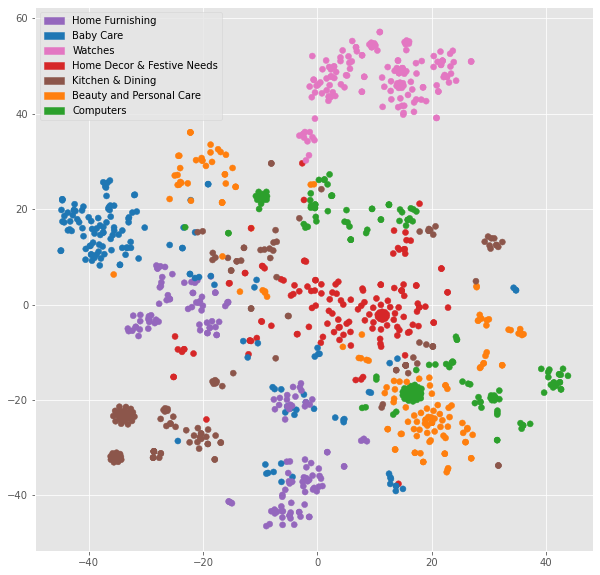

In [311]:
plt.figure(figsize=(10,10))
plt.scatter(x = X_tsneLemmatize[:, 0], y = X_tsneLemmatize[:, 1], c = Data['Couleurcatégorie'])

listeLegende = []
for i in range(dfCouleurs.shape[0]):
    listeLegende.append(mpatches.Patch(color = dfCouleurs['Couleurcatégorie'][i], label = dfCouleurs['Categorie1'][i]))
plt.legend(handles = listeLegende)

plt.show() 

Regardons maintenant ce que nous obtenons avec DBScan.

### DBScan

#### TF-IDF avec données lemmatisées: 

In [106]:
from itertools import product

eps_values = np.arange(1, 5.5, 0.5)
min_samples = np.arange(1, 6)
DBSCAN_params = list(product(eps_values, min_samples))

In [107]:
no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps=p[0], min_samples=p[1], n_jobs=-1).fit(X_tsneLemmatize)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(silhouette_score(X_tsneLemmatize, DBS_clustering.labels_))

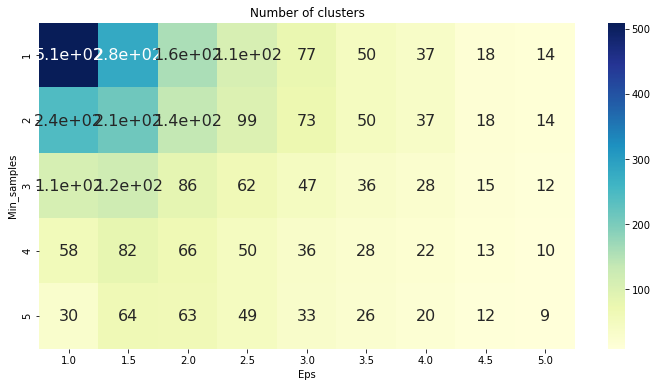

In [108]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['No_of_clusters'] = no_of_clusters

pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
plt.show()

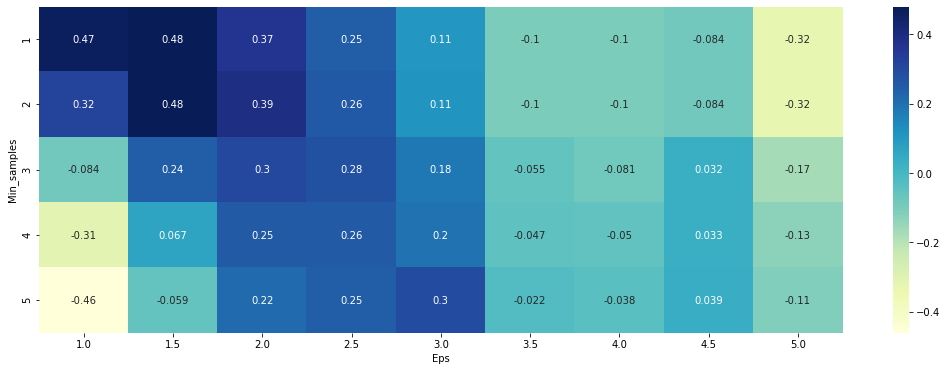

In [109]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['Sil_score'] = sil_score

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

Nous pouvons voir que nous obtenons le meilleur coefficient de silhouette pour epsilon = 1.5 et Min_sample = 1, cependant ce score est plus faible que ce que nous obtenons avec KMeans et que cela segmente nos données en 240 clusters.
Pour la suite nous n'utiliserons pas DBScan.

#### Indice de Rand

Nous avons notre segmentation "maximale" en utilisant T-SNE en utilisant TF-IDF sur les données lemmatisées et en utilisant 11 clusters. Regardons l'indice de Rand ajusté afin de voir si nous avons réussi ou non a bien a différencier les segments.

In [110]:
ariKMeans = (adjusted_rand_score(Data['IDcatégorie'], labelsXLemmatize[9]))
print('Indice de Rand ajusté pour KMeans:', ariKMeans)

Indice de Rand ajusté pour KMeans: 0.43344026778053546


L'indice nous indique que les clusters sont plutôt loin d'être similaire. Le classifieur n'a pas identifié les mêmes catégories que celles du jeu de données initial pour une grande majorité.

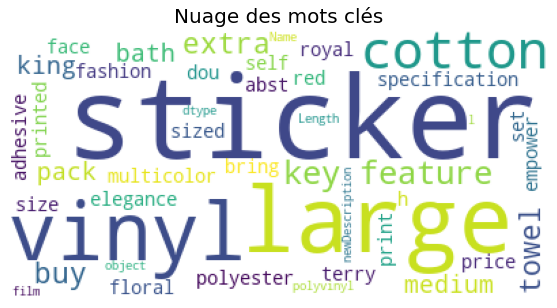

In [111]:
plt.figure(figsize=(20, 5))
plt.title('Nuage des mots clés', fontsize = 20)
wordcloud = WordCloud(background_color = 'white', stopwords = stop_words, max_words = 50).generate(str(Data['newDescription']))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

Regardons le nuage de mot pour chaque cluster afin de voir ce nous obtenons, afin de voir si chaque cluster représente une classe particulière ou pas du tout.

In [112]:
Data['labels'] = labelsXLemmatize[9]

In [113]:
DataCluster = Data.copy()

In [114]:
cluster = []
for i in range(11):
    cluster.append(DataCluster.loc[DataCluster['labels'] == i])

In [115]:
for i in range(11):
    nbre_client = cluster[i].shape[0]
    print('Cluster', i,': ', nbre_client,' clients, soit', nbre_client*100/DataCluster.shape[0], '% du jeu de données.')

Cluster 0 :  57  clients, soit 5.428571428571429 % du jeu de données.
Cluster 1 :  62  clients, soit 5.904761904761905 % du jeu de données.
Cluster 2 :  102  clients, soit 9.714285714285714 % du jeu de données.
Cluster 3 :  139  clients, soit 13.238095238095237 % du jeu de données.
Cluster 4 :  114  clients, soit 10.857142857142858 % du jeu de données.
Cluster 5 :  78  clients, soit 7.428571428571429 % du jeu de données.
Cluster 6 :  78  clients, soit 7.428571428571429 % du jeu de données.
Cluster 7 :  91  clients, soit 8.666666666666666 % du jeu de données.
Cluster 8 :  66  clients, soit 6.285714285714286 % du jeu de données.
Cluster 9 :  121  clients, soit 11.523809523809524 % du jeu de données.
Cluster 10 :  142  clients, soit 13.523809523809524 % du jeu de données.


Bien que nous pouvons voir qu'il existe bien évidemment des différences entre les clusters, dans l'ensemble ça reste tout de même assez équilibré.

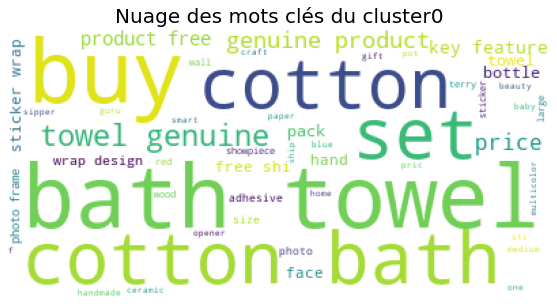

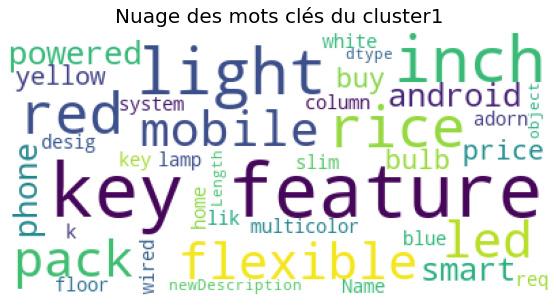

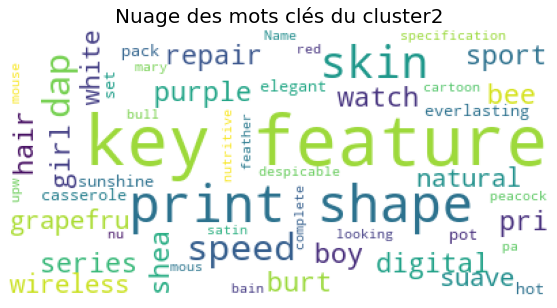

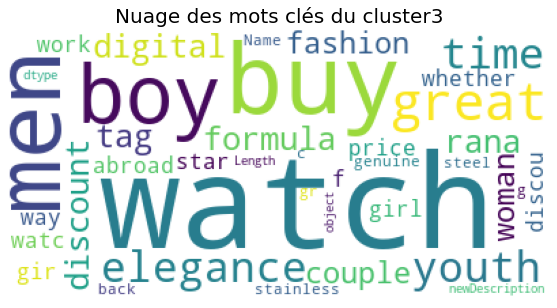

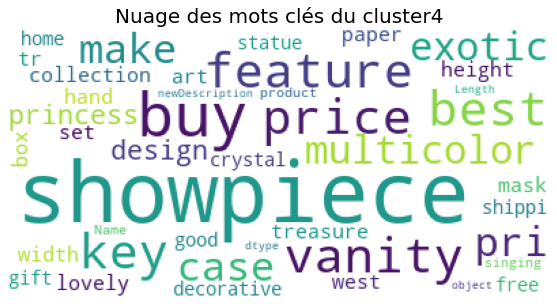

...

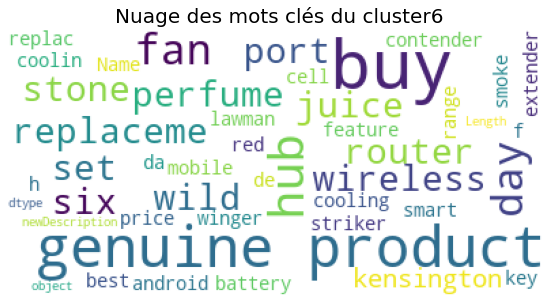

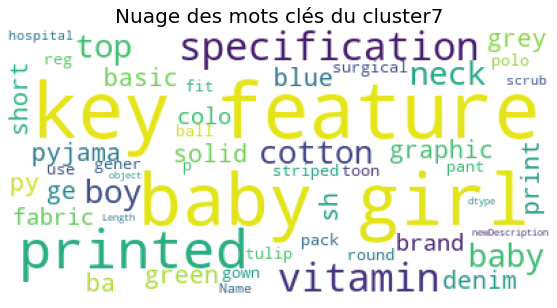

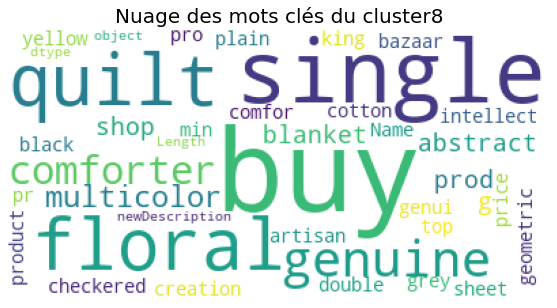

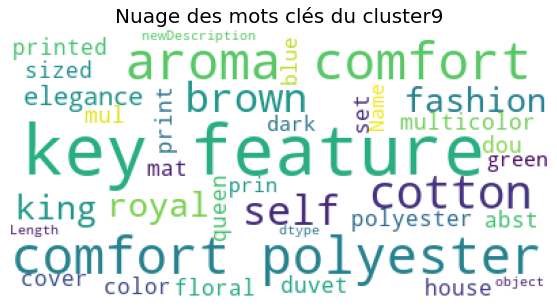

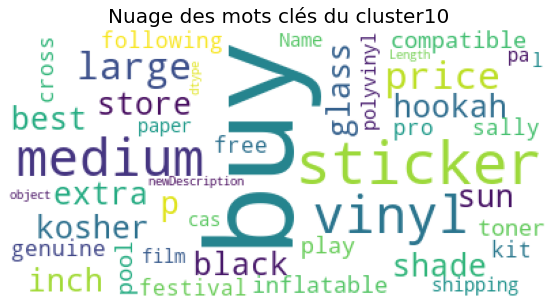

In [116]:
for i in range(11):
    plt.figure(figsize=(20, 5))
    title = str('Nuage des mots clés du cluster' + str(i))
    plt.title(title, fontsize = 20)
    wordcloud = WordCloud(background_color = 'white', stopwords = stop_words, max_words = 50).generate(str(cluster[i]['newDescription']))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

Nous pouvons également regarder l'image moyenne de chaque cluster, mais avant nous allons retravailler les images afin qu'elles aient la même taille et en niveau de gris.

In [117]:
pathCluster = r'C:/Users/Alexis/Cluster/' 

if os.path.exists(pathCluster) == False:
    os.mkdir(r'C:/Users/Alexis/Cluster/')

In [118]:
listeCluster = DataCluster['labels'].unique()

In [119]:
#for image in range(Data.shape[0]):
#    image0 = Image.open(r'C:/Users/Alexis/Images/' + Data['image'][image])
#    image0Gray = image0.convert('L')
#    image1Gray = image0Gray.resize((128, 128))
#    image1Gray.save(r'C:/Users/Alexis/ImagesGray128x128/' + Data['image'][image])

In [120]:
for n_cluster in listeCluster:
    path = r'C:/Users/Alexis/Cluster/' + str(n_cluster) +'/'
    if os.path.exists(path) == False:
        os.mkdir(r'C:/Users/Alexis/Cluster/' + str(n_cluster) +'/')
        listeImage = cluster[n_cluster][cluster[n_cluster]['labels'] == n_cluster]['image'].values.tolist()
    else:
        listeImage = cluster[n_cluster][cluster[n_cluster]['labels'] == n_cluster]['image'].values.tolist()
    
    for image in listeImage:
        shutil.copy(r'C:/Users/Alexis/ImagesGray128x128/' + image, r'C:/Users/Alexis/Cluster/' + str(n_cluster) + '/' + image)

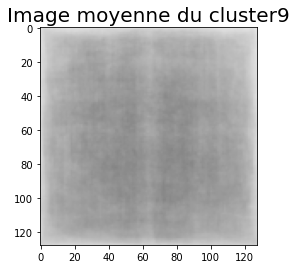

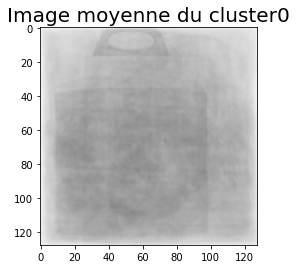

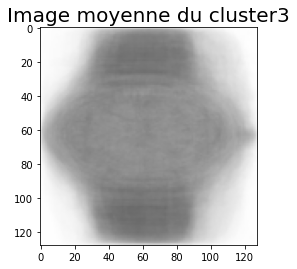

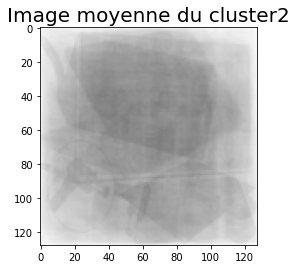

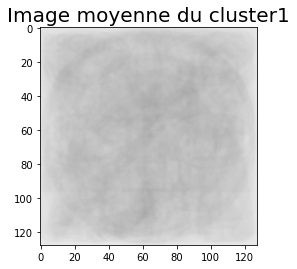

...

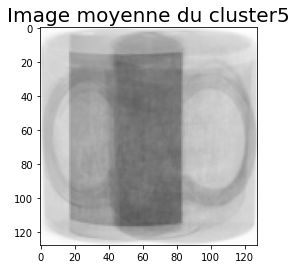

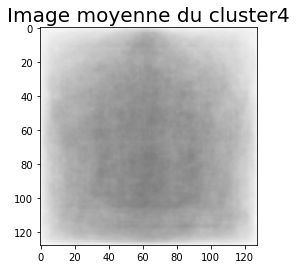

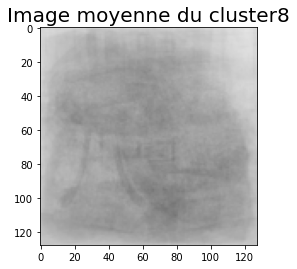

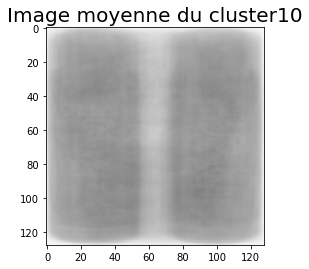

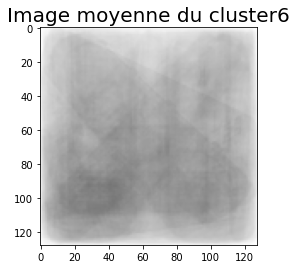

In [121]:
for n_cluster in listeCluster:
    path = r'C:/Users/Alexis/Cluster/' + str(n_cluster) + '/'   
    longueur = os.listdir(path)
    #print(n_cluster)
    arr = np.zeros((128,128))   

    for im in longueur:
        imarr = np.array(Image.open(r'C:/Users/Alexis/Cluster/' + str(n_cluster) + '/' + im), dtype=np.float)
        arr = arr + imarr/len(longueur)
        
    out = Image.fromarray(arr)
    plt.imshow(out, cmap='gray') 
    title = str('Image moyenne du cluster' + str(n_cluster))
    plt.title(title, fontsize = 20)
    plt.show()

Nous pouvons voir que pour 2 clusters nous avons une bonne segmentation puisque nous pouvons voir un objet précis, mais pour les autres c'est très concluant.

Nous pouvons donc voir pour les clusters 3 et 5, qu'ils représentent le cluster des montres et des tasses.

### K-Prototype

Pour le clustering avec Kmeans nous avons obtenons les meilleurs résultats avec TF_IDF et la lemmmatisation, nous prendrons ça pour la suite.

#### Clustering après ACP

In [122]:
dfReducedLemmatize = pd.DataFrame(df_reducedLemmatize)

In [123]:
listeCategorieTrain = pd.DataFrame(Data['Categorie1']).reset_index()

In [124]:
dfReducedLemmatize[383] = listeCategorieTrain['Categorie1'].copy()

In [304]:
n_clusters = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

kmeans_kwargs = {
    "init": "Cao",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

costs7 = []   
clusters_assigned7 = []
clusters_n7 = []

for i in n_clusters: 
    #print(i)
    KPrototype7 = KPrototypes(n_clusters=i, **kmeans_kwargs)
    clusters7 = KPrototype7.fit_predict(dfReducedLemmatize, categorical = [383])        
    costs7.append(KPrototype7.cost_)
    clusters_n7.append(i)
    clusters_assigned7.append(clusters7)

In [126]:
dfTrainID = Data['IDcatégorie'].reset_index()

In [127]:
dfReducedLemmatize['IDcatégorie'] = dfTrainID['IDcatégorie']

In [284]:
ariKPrototypeACP = (adjusted_rand_score(dfReducedLemmatize['IDcatégorie'], KPrototype7.labels_))
print('Indice de Rand ajusté pour KPrototype:', ariKPrototypeACP)

Indice de Rand ajusté pour KPrototype: 0.23207107638688718


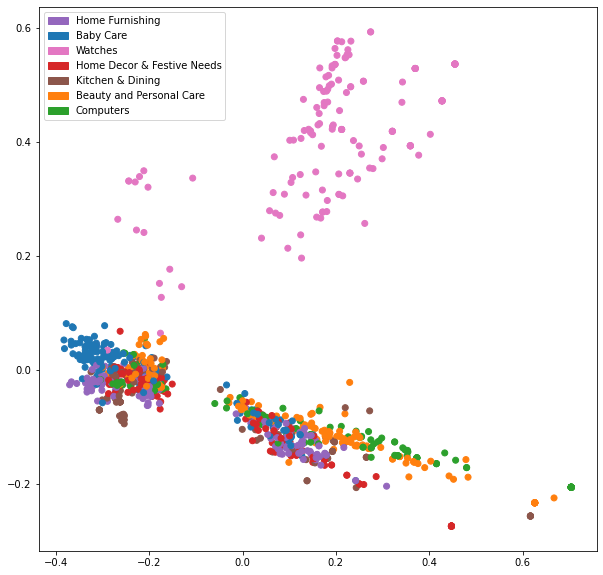

In [129]:
plt.figure(figsize=(10,10))
plt.scatter(*zip(*dfReducedLemmatize[[0,1]].values), c = Data['Couleurcatégorie'])

listeLegende = []
for i in range(dfCouleurs.shape[0]):
    listeLegende.append(mpatches.Patch(color = dfCouleurs['Couleurcatégorie'][i], label = dfCouleurs['Categorie1'][i]))
plt.legend(handles = listeLegende)

plt.show() 

#### Clustering après T-SNE

In [130]:
dfXtsneLemmatize = pd.DataFrame(X_tsneLemmatize)

In [131]:
listeCategorieTrain = pd.DataFrame(Data['Categorie1']).reset_index()

In [132]:
dfXtsneLemmatize[2] = listeCategorieTrain['Categorie1'].copy()

In [133]:
dfXtsneLemmatize

,0,1,2
0,-29.572693,-5.031328,Home Furnishing
1,-7.453261,-17.702267,Baby Care
2,-6.305972,-17.753721,Baby Care
3,-21.424925,4.580385,Home Furnishing
4,-22.010878,4.736589,Home Furnishing
...,...,...,...
1045,-10.394587,-8.086912,Baby Care
1046,-12.951988,-7.647060,Baby Care
1047,12.549808,-35.435875,Baby Care
1048,13.788779,-38.013493,Baby Care


In [134]:
kmeans_kwargs = {
    "init": "Cao",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

costs7X = []   
clusters_assigned7X = []
clusters_n7X = []

KPrototype7X = KPrototypes(n_clusters=7, **kmeans_kwargs)
clusters7X = KPrototype7X.fit_predict(dfXtsneLemmatize, categorical = [2])        
costs7X.append(KPrototype7X.cost_)
clusters_n7X.append(i)
clusters_assigned7X.append(clusters7X)

In [135]:
dfTrainID = Data['IDcatégorie'].reset_index()

dfXtsneLemmatize['IDcatégorie'] = dfTrainID['IDcatégorie']

In [285]:
ariKPrototypeTSNE = (adjusted_rand_score(dfXtsneLemmatize['IDcatégorie'], KPrototype7X.labels_))
print('Indice de Rand ajusté pour KPrototype:', ariKPrototypeTSNE)

Indice de Rand ajusté pour KPrototype: 0.4477216774888019


In [ ]:
for i in range(0, 7, 1):
    plt.figure(figsize = (10, 10))
    sns.scatterplot(x = X_tsne1[:, 0], y = X_tsne1[:, 1], hue = labels[i])

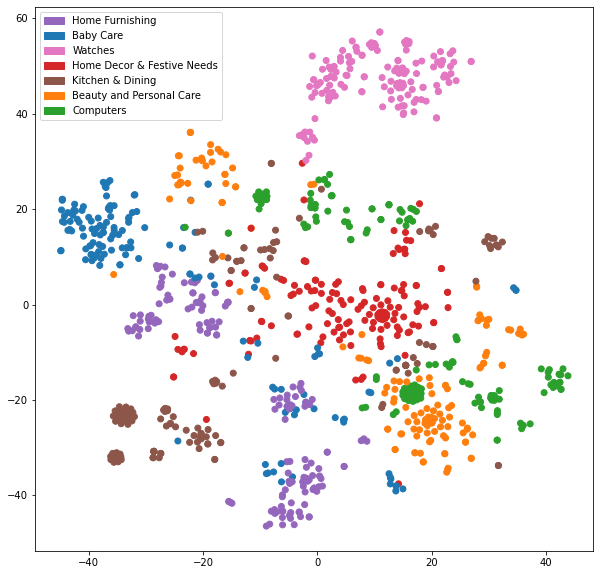

In [137]:
plt.figure(figsize=(10,10))
plt.scatter(*zip(*dfXtsneLemmatize[[0,1]].values), c = Data['Couleurcatégorie'])

listeLegende = []
for i in range(dfCouleurs.shape[0]):
    listeLegende.append(mpatches.Patch(color = dfCouleurs['Couleurcatégorie'][i], label = dfCouleurs['Categorie1'][i]))
plt.legend(handles = listeLegende)

plt.show() 

Comme nous pouvons le voir nous obtenons un meilleur score ajusté de Rand avec K-Prototype en utilisant la réduction de dimension T-SNE par rapport à KMeans (utilisant également T-SNE comme réduction de dimension).

Il sera plus intéressant d'utiliser K-Prototype pour classifier le texte même si les résultats obtenus ne sont pas extraordinaires.

#### Classification supervisée

Dans un premier temps nous allons spliter notre jeu de données en un jeu d'entraînement et en un jeu de test:

In [138]:
Encoder = LabelEncoder()
Data['Categorie1Encoder'] = Encoder.fit_transform(Data['Categorie1'])

In [139]:
train, test = train_test_split(Data, test_size = 0.3, random_state = SEED)
x_train, x_test, y_train, y_test = train_test_split(Data['newDescription'], Data['Categorie1Encoder'], test_size = 0.3, random_state = SEED)

In [140]:
dataTrain = train.copy()
dataTest = test.copy()

In [141]:
Encoder = LabelEncoder()
dataTrain['Categorie1'] = Encoder.fit_transform(dataTrain['Categorie1'])
dataTest['Categorie1'] = Encoder.fit_transform(dataTest['Categorie1'])

In [142]:
Tfidf_vect = TfidfVectorizer(sublinear_tf=True, stop_words='english')
Tfidf_vect.fit(Data['description'])
Train_X_Tfidf = Tfidf_vect.transform(dataTrain['newDescription'])
Test_X_Tfidf = Tfidf_vect.transform(dataTest['newDescription'])

x_train = Tfidf_vect.transform(x_train)
x_test = Tfidf_vect.transform(x_test)
#y_train = Tfidf_vect.transform(y_train)
#y_test = Tfidf_vect.transform(y_test)

In [143]:
#print(Train_X_Tfidf)

In [144]:
Naive = naive_bayes.MultinomialNB()
Naive.fit(Train_X_Tfidf, dataTrain['Categorie1'])

NaiveTrain = naive_bayes.MultinomialNB()
NaiveTrain.fit(x_train, y_train)

predictions_NB = Naive.predict(Test_X_Tfidf)
predictions_NBTrain = NaiveTrain.predict(x_test)
print("Précision: ", round(accuracy_score(predictions_NB, dataTest['Categorie1'])*100, 2), '%')

print("Précision Train: ", round(accuracy_score(predictions_NBTrain, y_test)*100, 2), '%')
print("RMSE Test: ", math.sqrt(mean_squared_error(y_test, predictions_NBTrain)))

Précision:  83.81 %
Précision Train:  86.67 %
RMSE Test:  1.0555973258234952


In [145]:
SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVM.fit(Train_X_Tfidf, dataTrain['Categorie1'])

SVMTrain = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVMTrain.fit(x_train, y_train)

predictions_SVM = SVM.predict(Test_X_Tfidf)
predictions_SVMTrain = SVMTrain.predict(x_test)
print("Précision: ", round(accuracy_score(predictions_SVM, dataTest['Categorie1'])*100, 2), '%')

print("Précision Train: ", round(accuracy_score(predictions_SVMTrain, y_test)*100, 2), '%')
print("RMSE Test: ", math.sqrt(mean_squared_error(y_test, predictions_SVMTrain)))

Précision:  93.02 %
Précision Train:  93.33 %
RMSE Test:  0.7259367238156001


Nous pouvons voir que les modèles supervisés donnent de meilleurs résultats, c'est une solution a envisager pour la suite, à la place de la segmentation qui donne des résultats moins bon.

### Traitement des images

Pour la suite nous allons travailler sur une image, nous ne chargerons donc qu'une image et non l'ensemble des images du dataset.

In [146]:
import cv2

In [147]:
image = Image.open(r'C:\Users\Alexis\Images\d136aa676ef52b09eab65762940957fe.jpg')

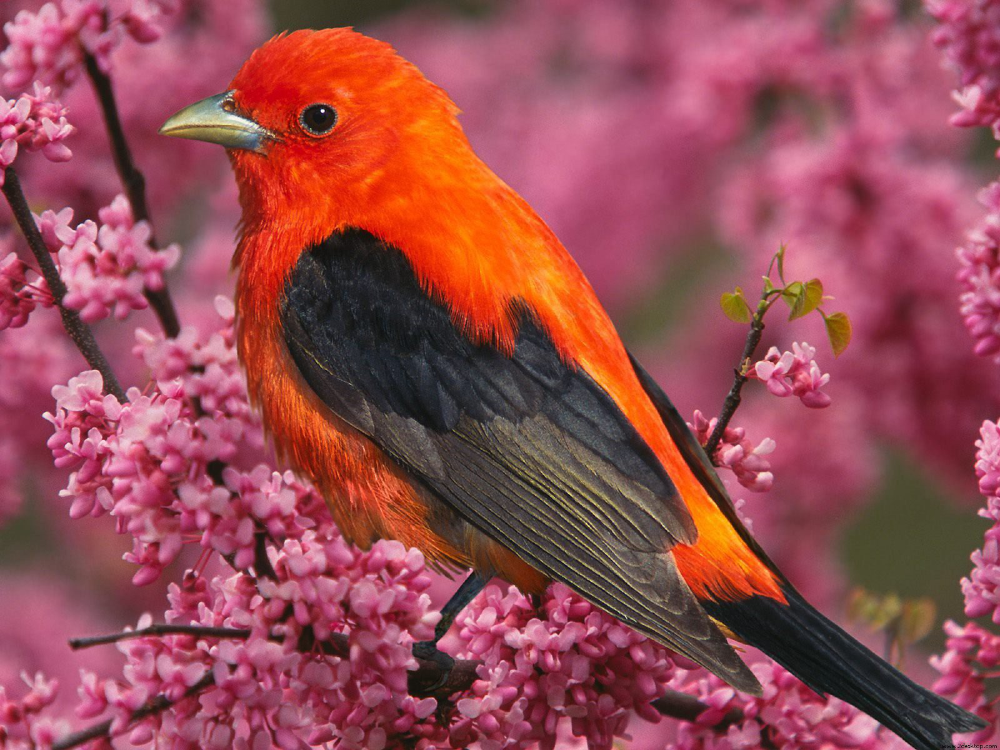

In [148]:
image

Dans un premier temps regardons les histogrammes de l'image:

In [149]:
imageArray = np.array(image)

In [150]:
imageArray

array([[[131,  37,  64],
        [131,  37,  64],
        [133,  39,  66],
        ...,
        [134,  35,  63],
        [136,  37,  65],
        [135,  36,  64]],

       [[134,  44,  70],
        [134,  44,  70],
        [135,  45,  71],
        ...,
        [135,  36,  64],
        [133,  37,  64],
        [131,  35,  62]],

       [[130,  46,  70],
        [129,  45,  69],
        [130,  46,  70],
        ...,
        [134,  38,  65],
        [133,  37,  65],
        [131,  35,  63]],

       ...,

       [[212, 102, 129],
        [201,  91, 116],
        [188,  79, 102],
        ...,
        [176,  90, 117],
        [170,  84, 111],
        [173,  87, 114]],

       [[213, 104, 133],
        [204,  96, 122],
        [192,  84, 107],
        ...,
        [173,  89, 115],
        [171,  88, 114],
        [172,  89, 115]],

       [[199,  90, 119],
        [196,  88, 114],
        [194,  86, 109],
        ...,
        [164,  81, 107],
        [156,  76, 101],
        [164,  84, 109]]

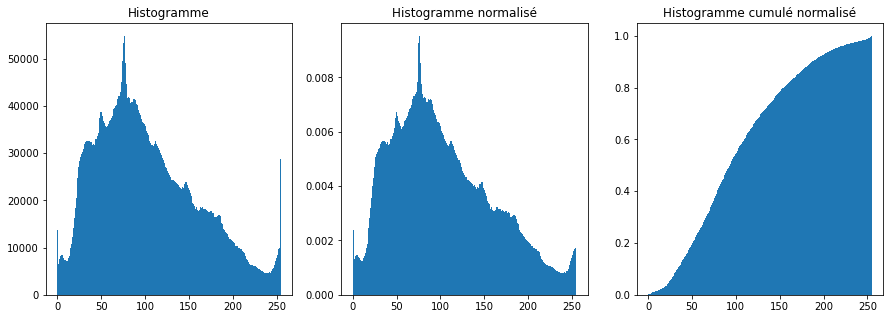

In [151]:
plt.figure(figsize=(15,5))

plt.subplot(1, 3, 1)
plt.hist(imageArray.flatten(), bins=range(256))
plt.title('Histogramme')

plt.subplot(1, 3, 2)
plt.hist(imageArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé')

plt.subplot(1, 3, 3)
plt.hist(imageArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé')

plt.show()

Nous allons maintenant convertr l'image en niveau de gris et nous regarderons de nouveaux les histogrammes afin de voir s'il y a un changement.

In [152]:
imageGray = image.convert('L')

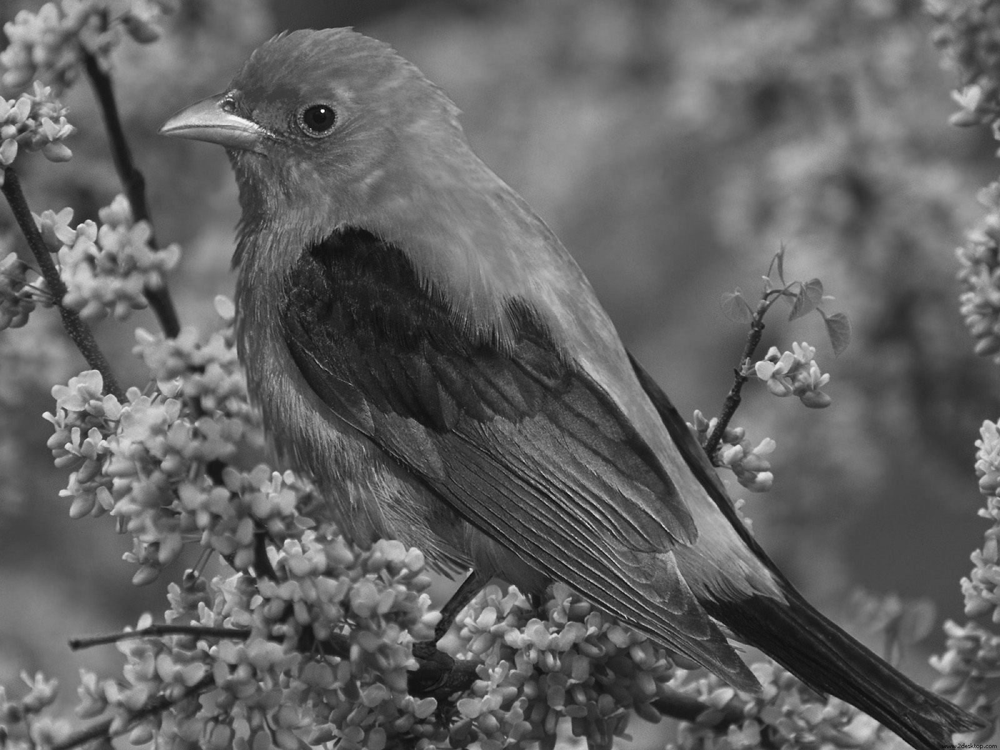

In [153]:
imageGray

In [154]:
imageGrayArray = np.array(imageGray)

In [155]:
imageGrayArray

array([[ 68,  68,  70, ...,  68,  70,  69],
       [ 74,  74,  75, ...,  69,  69,  67],
       [ 74,  73,  74, ...,  70,  69,  67],
       ...,
       [138, 127, 114, ..., 119, 113, 116],
       [140, 131, 119, ..., 117, 116, 117],
       [126, 123, 121, ..., 109, 103, 111]], dtype=uint8)

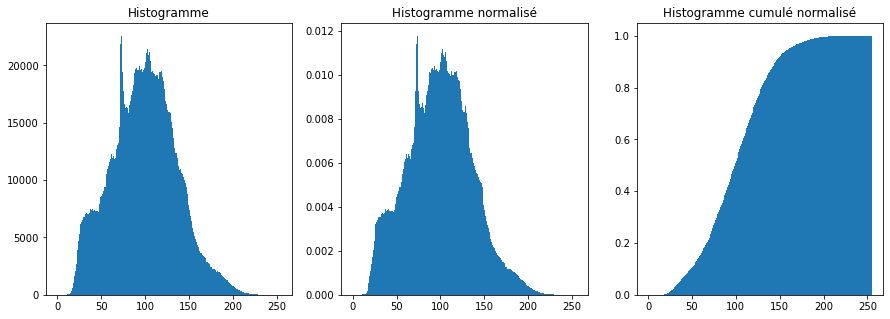

In [156]:
plt.figure(figsize=(15,5))

plt.subplot(1, 3, 1)
plt.hist(imageGrayArray.flatten(), bins=range(256))
plt.title('Histogramme')

plt.subplot(1, 3, 2)
plt.hist(imageGrayArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé')

plt.subplot(1, 3, 3)
plt.hist(imageGrayArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé')

plt.show()

Il y a bel et bien un changement comme nous pouvions nous y attendre, mais la forme générale est gardée.

Essayons maintenant de réduire le bruit de l'image, plusieurs filtre existe mais nous allons utiliser ceux que le cours utilise c'est à dire "ImageFilter.GaussianBlur" et "ImageFilter.BoxBlur":

In [157]:
from PIL import ImageFilter

imageBoxBlur = imageGray.filter(ImageFilter.BoxBlur(1))
imageBoxBlurArray = np.array(imageBoxBlur)

imageGaussianBlur = imageGray.filter(ImageFilter.GaussianBlur(1))
imageGaussianBlurArray = np.array(imageGaussianBlur)

Regardons ce que nous obtenons:

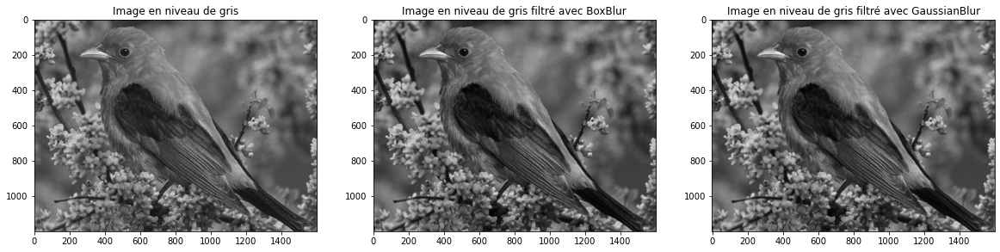

In [158]:
plt.figure(figsize=(20,5))

plt.subplot(1, 3, 1)
plt.imshow(imageGray, cmap='gray')
plt.title('Image en niveau de gris')

plt.subplot(1, 3, 2)
plt.imshow(imageBoxBlur, cmap='gray')
plt.title('Image en niveau de gris filtré avec BoxBlur')

plt.subplot(1, 3, 3)
plt.imshow(imageGaussianBlur, cmap='gray')
plt.title('Image en niveau de gris filtré avec GaussianBlur')

plt.show()

Regardons maintenant les différents histogrammes afin de voir si une égalisation où un étirement des niveaux de gris est nécessaire:

Pour l'image en niveau de gris non filtrée nous avons une grande partie des valeurs qui auront tendance à se grouper sur la gauche mais l'ensemble des pixels se trouve sur tout l’intervalle [0-255], un étirement ne sera peut être pas nécessaire pour la suite, voyons ce qu'il en est des autres images.

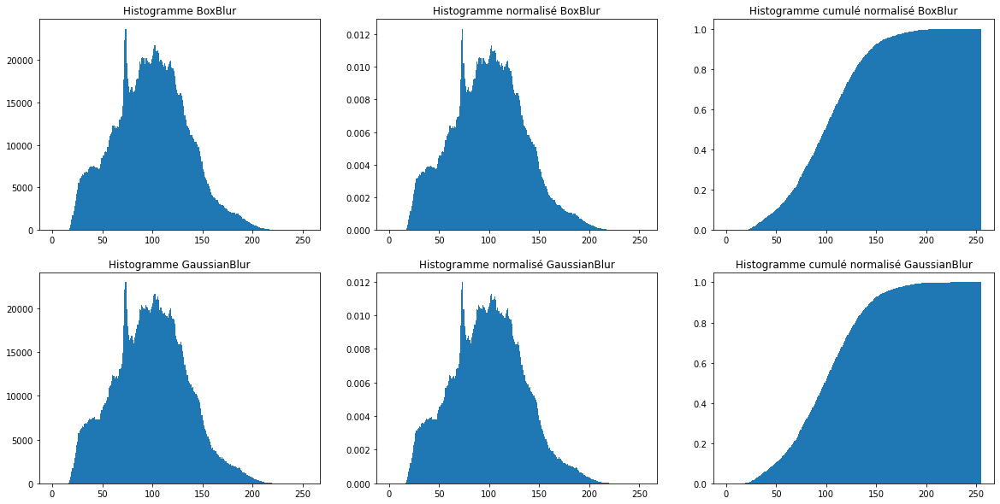

In [159]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.hist(imageBoxBlurArray.flatten(), bins=range(256))
plt.title('Histogramme BoxBlur')

plt.subplot(2, 3, 2)
plt.hist(imageBoxBlurArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé BoxBlur')

plt.subplot(2, 3, 3)
plt.hist(imageBoxBlurArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé BoxBlur')

plt.subplot(2, 3, 4)
plt.hist(imageGaussianBlurArray.flatten(), bins=range(256))
plt.title('Histogramme GaussianBlur')

plt.subplot(2, 3, 5)
plt.hist(imageGaussianBlurArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé GaussianBlur')

plt.subplot(2, 3, 6)
plt.hist(imageGaussianBlurArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé GaussianBlur')

plt.show()

Comme pour la première image en niveau de gris (sans opération de filtrage donc) les niveaux de gris ont tendance à se grouper sur la gauche mais les pixels couvrent l’intervalle [0,255], regardons ce que nous avons après un étirement pour nous en assurer.

### Amélioration du contraste

#### Etirement de l'histogramme

In [160]:
from PIL import ImageOps

In [161]:
imageGrayAutocontrast = ImageOps.autocontrast(imageGray)
imageGrayAutocontrastArray = np.array(imageGrayAutocontrast)

imageBoxBlurAutocontrast = ImageOps.autocontrast(imageBoxBlur)
imageBoxBlurAutocontrastArray = np.array(imageBoxBlurAutocontrast)

imageGaussianBlurAutocontrast = ImageOps.autocontrast(imageGaussianBlur)
imageGaussianBlurAutocontrastArray = np.array(imageGaussianBlurAutocontrast)

Avant de regarder les histogammes, regardons les images.

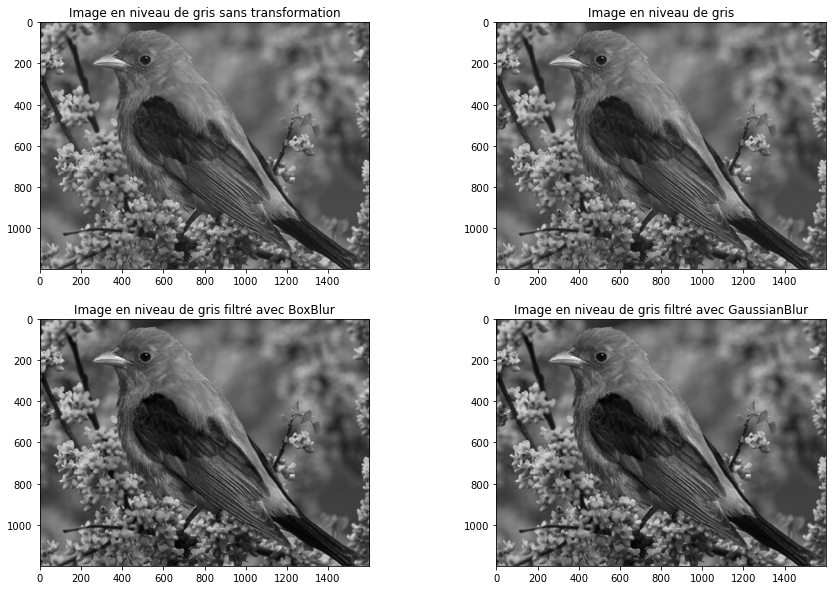

In [162]:
plt.figure(figsize=(15,10))

plt.subplot(2, 2, 1)
plt.imshow(imageGray, cmap='gray')
plt.title('Image en niveau de gris sans transformation')

plt.subplot(2, 2, 2)
plt.imshow(imageGrayAutocontrast, cmap='gray')
plt.title('Image en niveau de gris')

plt.subplot(2, 2, 3)
plt.imshow(imageBoxBlurAutocontrast, cmap='gray')
plt.title('Image en niveau de gris filtré avec BoxBlur')

plt.subplot(2, 2, 4)
plt.imshow(imageGaussianBlurAutocontrast, cmap='gray')
plt.title('Image en niveau de gris filtré avec GaussianBlur')

plt.show()

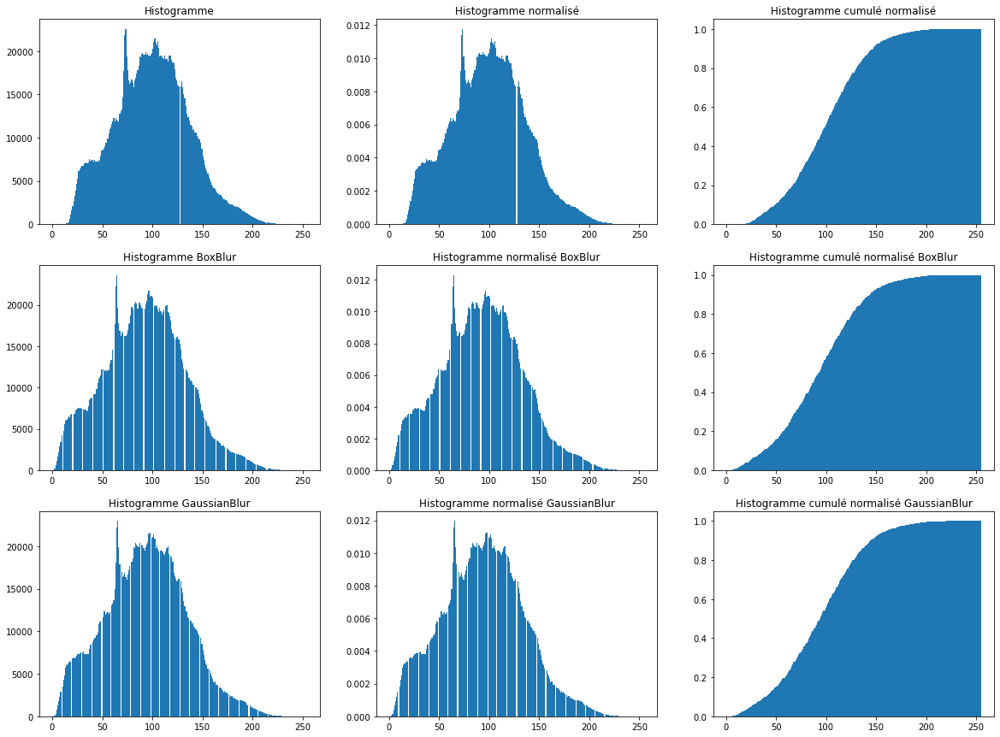

In [163]:
plt.figure(figsize=(20,15))

plt.subplot(3, 3, 1)
plt.hist(imageGrayAutocontrastArray.flatten(), bins=range(256))
plt.title('Histogramme')

plt.subplot(3, 3, 2)
plt.hist(imageGrayAutocontrastArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé')

plt.subplot(3, 3, 3)
plt.hist(imageGrayAutocontrastArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé')

plt.subplot(3, 3, 4)
plt.hist(imageBoxBlurAutocontrastArray.flatten(), bins=range(256))
plt.title('Histogramme BoxBlur')

plt.subplot(3, 3, 5)
plt.hist(imageBoxBlurAutocontrastArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé BoxBlur')

plt.subplot(3, 3, 6)
plt.hist(imageBoxBlurAutocontrastArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé BoxBlur')

plt.subplot(3, 3, 7)
plt.hist(imageGaussianBlurAutocontrastArray.flatten(), bins=range(256))
plt.title('Histogramme GaussianBlur')

plt.subplot(3, 3, 8)
plt.hist(imageGaussianBlurAutocontrastArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé GaussianBlur')

plt.subplot(3, 3, 9)
plt.hist(imageGaussianBlurAutocontrastArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé GaussianBlur')

plt.show()

Comme nous pouvons le voir il n'y a pas de gros changements, ce qui était plus ou moins attendu.

#### Egalisation de l'histogramme

In [164]:
imageGrayEqualize = ImageOps.equalize(imageGray)
imageGrayEqualizeArray = np.array(imageGrayEqualize)

imageBoxBlurEqualize = ImageOps.equalize(imageBoxBlur)
imageBoxBlurEqualizeArray = np.array(imageBoxBlurEqualize)

imageGaussianBlurEqualize = ImageOps.equalize(imageGaussianBlur)
imageGaussianBlurEqualizeArray = np.array(imageGaussianBlurEqualize)

Regardons dans un premier temps les images:

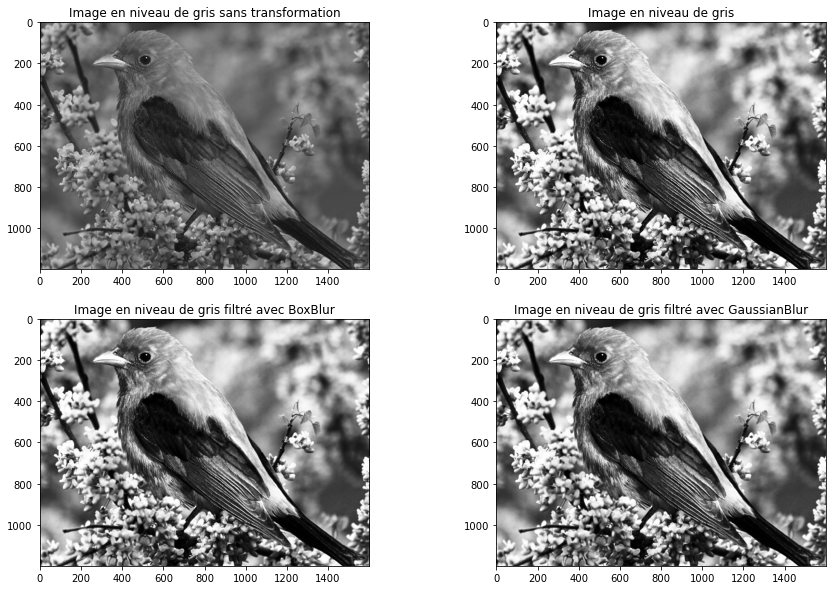

In [165]:
plt.figure(figsize=(15,10))

plt.subplot(2, 2, 1)
plt.imshow(imageGray, cmap='gray')
plt.title('Image en niveau de gris sans transformation')

plt.subplot(2, 2, 2)
plt.imshow(imageGrayEqualize, cmap='gray')
plt.title('Image en niveau de gris')

plt.subplot(2, 2, 3)
plt.imshow(imageBoxBlurEqualize, cmap='gray')
plt.title('Image en niveau de gris filtré avec BoxBlur')

plt.subplot(2, 2, 4)
plt.imshow(imageGaussianBlurEqualize, cmap='gray')
plt.title('Image en niveau de gris filtré avec GaussianBlur')

plt.show()

Regardons maintenant les histogrammes:

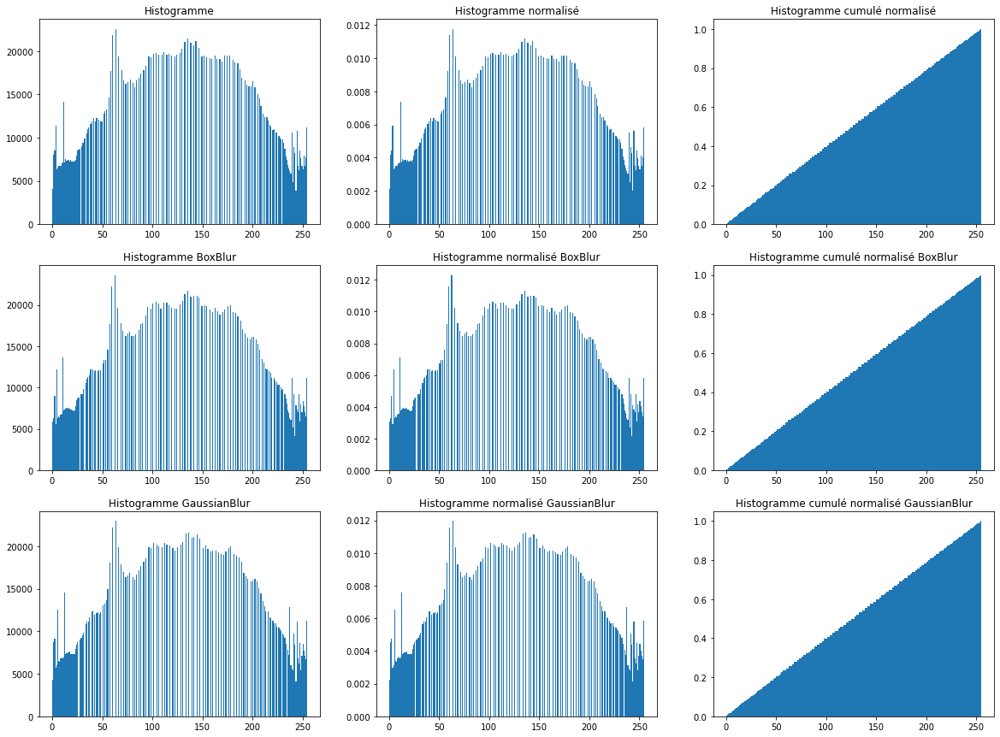

In [166]:
plt.figure(figsize=(20,15))

plt.subplot(3, 3, 1)
plt.hist(imageGrayEqualizeArray.flatten(), bins=range(256))
plt.title('Histogramme')

plt.subplot(3, 3, 2)
plt.hist(imageGrayEqualizeArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé')

plt.subplot(3, 3, 3)
plt.hist(imageGrayEqualizeArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé')

plt.subplot(3, 3, 4)
plt.hist(imageBoxBlurEqualizeArray.flatten(), bins=range(256))
plt.title('Histogramme BoxBlur')

plt.subplot(3, 3, 5)
plt.hist(imageBoxBlurEqualizeArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé BoxBlur')

plt.subplot(3, 3, 6)
plt.hist(imageBoxBlurEqualizeArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé BoxBlur')

plt.subplot(3, 3, 7)
plt.hist(imageGaussianBlurEqualizeArray.flatten(), bins=range(256))
plt.title('Histogramme GaussianBlur')

plt.subplot(3, 3, 8)
plt.hist(imageGaussianBlurEqualizeArray.flatten(), bins=range(256), density=True)
plt.title('Histogramme normalisé GaussianBlur')

plt.subplot(3, 3, 9)
plt.hist(imageGaussianBlurEqualizeArray.flatten(), bins=range(256), density=True, cumulative=True)
plt.title('Histogramme cumulé normalisé GaussianBlur')

plt.show()

### SIFT

Comme pour le prétraitement des images, ici nous ne prendrons qu'une image pour gagner en temps de calcul. Bien évidemment nous continuerons avec la même image.

Regardons pour chaque images à notre disposition s'il y a des différences entre les différents points clés.

In [167]:
sift = cv2.xfeatures2d.SIFT_create()

In [168]:
keypoints, descriptors = sift.detectAndCompute(imageGrayArray,None)
imageGraySift = cv2.drawKeypoints(imageGrayArray, keypoints, imageGrayArray, (0, 0, 255))

In [169]:
keypointsBoxBlur, descriptorsBoxBlur = sift.detectAndCompute(imageBoxBlurArray,None)
imageBoxBlurSift = cv2.drawKeypoints(imageBoxBlurArray, keypointsBoxBlur, imageBoxBlurArray, (0, 0, 255))

In [170]:
keypointsGaussianBlur, descriptorsGaussianBlur = sift.detectAndCompute(imageGaussianBlurArray,None)
imageGaussianBlurSift = cv2.drawKeypoints(imageGaussianBlurArray, keypointsGaussianBlur, imageGaussianBlurArray, (0, 0, 255))

In [171]:
keypointsBoxBlurEqualize, descriptorsBoxBlurEqualize = sift.detectAndCompute(imageBoxBlurEqualizeArray,None)
imageBoxBlurEqualizeSift = cv2.drawKeypoints(imageBoxBlurEqualizeArray, keypointsBoxBlurEqualize, imageBoxBlurEqualizeArray, (0, 0, 255))

In [172]:
keypointsGaussianBlurEqualize, descriptorsGaussianBlurEqualize = sift.detectAndCompute(imageGaussianBlurEqualizeArray,None)
imageGaussianBlurEqualizeSift = cv2.drawKeypoints(imageGaussianBlurEqualizeArray, keypointsGaussianBlurEqualize, imageGaussianBlurEqualizeArray, (0, 0, 255))

Regardons maintenant les images afin de voir si les transformations changent les points clés ou non.

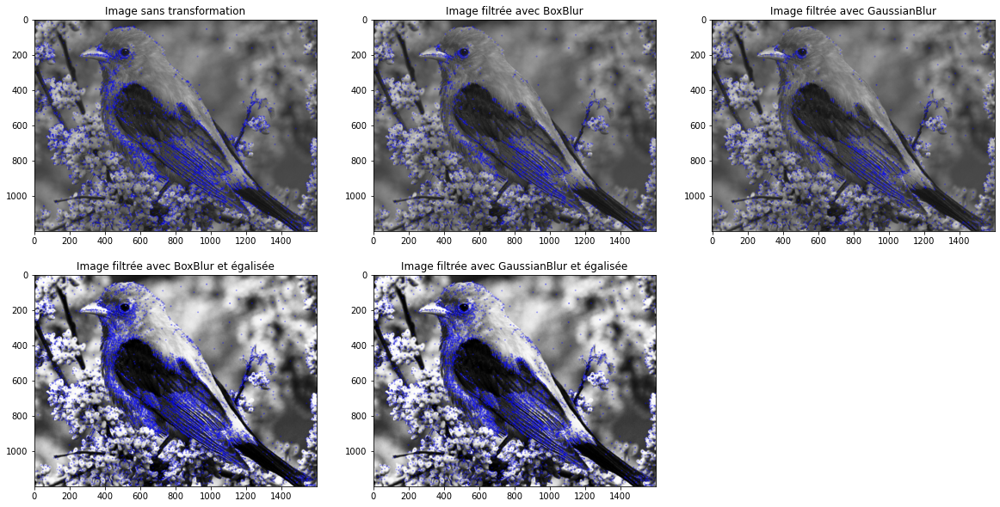

In [173]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.imshow(imageGraySift, cmap='gray')
plt.title('Image sans transformation')

plt.subplot(2, 3, 2)
plt.imshow(imageBoxBlurSift, cmap='gray')
plt.title('Image filtrée avec BoxBlur')

plt.subplot(2, 3, 3)
plt.imshow(imageGaussianBlurSift, cmap='gray')
plt.title('Image filtrée avec GaussianBlur')

plt.subplot(2, 3, 4)
plt.imshow(imageBoxBlurEqualizeSift, cmap='gray')
plt.title('Image filtrée avec BoxBlur et égalisée')

plt.subplot(2, 3, 5)
plt.imshow(imageGaussianBlurEqualizeSift, cmap='gray')
plt.title('Image filtrée avec GaussianBlur et égalisée')

plt.show()

Nous pouvons voir que dans l'ensemble nous avons les mêmes poins clés, pour une grande majorité d'entre eux.

Regardons ce que nous avons si nous effectuons d'autres transformations sur les images, comme un redimmensionnement, une rotation, etc.

Afin de voir l'intérêt de SIFT, nous n'applquerons que les fonctions de transformation, donc s'il doit y avoir des bords noirs nous les laisserons tel quels.

In [174]:
imageGrayRotate45 = imageGray.rotate(45)
imageGrayRotate45Array = np.array(imageGrayRotate45)

imageGrayRotate90 = imageGray.rotate(90)
imageGrayRotate90Array = np.array(imageGrayRotate90)

imageGrayRotate180 = imageGray.rotate(180)
imageGrayRotate180Array = np.array(imageGrayRotate180)

imageGrayResize = imageGray.resize((400, 500))
imageGrayResizeArray = np.array(imageGrayResize)

Text(0.5, 1.0, 'Image ayant subit un redimmensionnement')

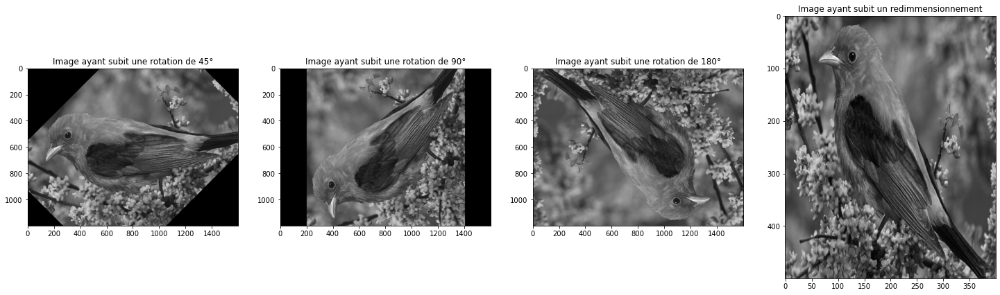

In [175]:
plt.figure(figsize=(25,10))

plt.subplot(1, 4, 1)
plt.imshow(imageGrayRotate45, cmap='gray')
plt.title('Image ayant subit une rotation de 45°')

plt.subplot(1, 4, 2)
plt.imshow(imageGrayRotate90, cmap='gray')
plt.title('Image ayant subit une rotation de 90°')

plt.subplot(1, 4, 3)
plt.imshow(imageGrayRotate180, cmap='gray')
plt.title('Image ayant subit une rotation de 180°')

plt.subplot(1, 4, 4)
plt.imshow(imageGrayResize, cmap='gray')
plt.title('Image ayant subit un redimmensionnement')

In [176]:
keypointsGrayRotate45, descriptorsGrayRotate45 = sift.detectAndCompute(imageGrayRotate45Array,None)
imageGrayRotate45Sift = cv2.drawKeypoints(imageGrayRotate45Array, keypointsGrayRotate45, imageGrayRotate45Array, (0, 0, 255))

In [177]:
keypointsGrayRotate90, descriptorsGrayRotate90 = sift.detectAndCompute(imageGrayRotate90Array,None)
imageGrayRotate90Sift = cv2.drawKeypoints(imageGrayRotate90Array, keypointsGrayRotate90, imageGrayRotate90Array, (0, 0, 255))

In [178]:
keypointsGrayRotate180, descriptorsGrayRotate180 = sift.detectAndCompute(imageGrayRotate180Array,None)
imageGrayRotate180Sift = cv2.drawKeypoints(imageGrayRotate180Array, keypointsGrayRotate180, imageGrayRotate180Array, (0, 0, 255))

In [179]:
keypointsGrayResize, descriptorsGrayResize = sift.detectAndCompute(imageGrayResizeArray,None)
imageGrayResizeSift = cv2.drawKeypoints(imageGrayResizeArray, keypointsGrayResize, imageGrayResizeArray, (0, 0, 255))

Text(0.5, 1.0, 'Image ayant subit un redimmensionnement')

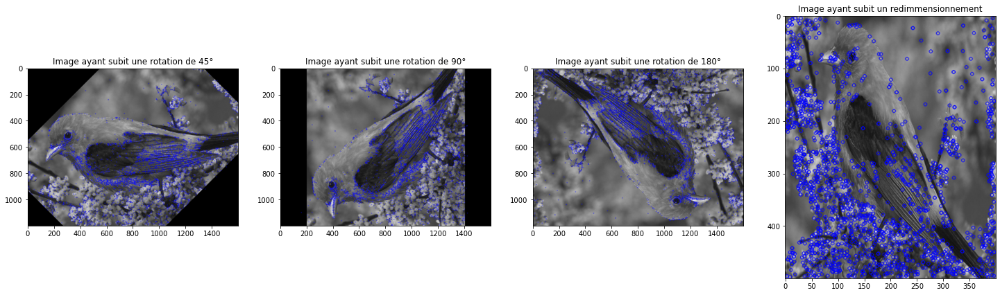

In [180]:
plt.figure(figsize=(25,10))

plt.subplot(1, 4, 1)
plt.imshow(imageGrayRotate45Sift, cmap='gray')
plt.title('Image ayant subit une rotation de 45°')

plt.subplot(1, 4, 2)
plt.imshow(imageGrayRotate90Sift, cmap='gray')
plt.title('Image ayant subit une rotation de 90°')

plt.subplot(1, 4, 3)
plt.imshow(imageGrayRotate180Sift, cmap='gray')
plt.title('Image ayant subit une rotation de 180°')

plt.subplot(1, 4, 4)
plt.imshow(imageGrayResizeSift, cmap='gray')
plt.title('Image ayant subit un redimmensionnement')

Nous pouvons voir que malgré les différentes rotations Sift donne toujours de bons résultats.

In [181]:
print(descriptors)

[[ 64.   4.   0. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   9.  73.]
 [ 13.   6.  19. ...  33.  47.  22.]
 ...
 [ 70. 114.  51. ...   4.   1.   1.]
 [  0.   0.   0. ...   7.   0.   1.]
 [  0.   0.   7. ...   0.   0.  31.]]


Pour plus de simplicité sur le traitement des données, nous allons mettre ces dernières dans un dataframe:

In [182]:
dfDescriptors = pd.DataFrame(np.array(descriptors))

In [183]:
dfDescriptors.head(5)

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,64.0,4.0,0.0,0.0,5.0,9.0,21.0,43.0,34.0,5.0,...,4.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,...,9.0,17.0,31.0,4.0,0.0,0.0,0.0,0.0,9.0,73.0
2,13.0,6.0,19.0,92.0,16.0,0.0,0.0,1.0,39.0,4.0,...,53.0,33.0,0.0,0.0,0.0,0.0,32.0,33.0,47.0,22.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,2.0,...,67.0,23.0,0.0,22.0,78.0,21.0,38.0,14.0,4.0,0.0
4,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,68.0,65.0,...,3.0,86.0,20.0,13.0,4.0,1.0,0.0,0.0,19.0,108.0


Nous pouvons voir que chaque descripteur est un vecteur de dimension 128.

Ce n'est pas encore les visuals words, nous nous y attaquerons par la suite lorsque nous traiterons toutes les images.

In [184]:
#Plot premiere ligne

### ORB

In [185]:
orb = cv2.ORB_create()

In [186]:
keypointsORB, descriptorsORB = orb.detectAndCompute(imageGrayArray, None)
imageGrayORB = cv2.drawKeypoints(imageGrayArray, keypointsORB, None, (0, 0, 255))

In [187]:
keypointsBoxBlurORB, descriptorsBoxBlurORB = orb.detectAndCompute(imageBoxBlurArray, None)
imageBoxBlurORB = cv2.drawKeypoints(imageBoxBlurArray, keypointsBoxBlurORB, None, (0, 0, 255))

In [188]:
keypointsGaussianBlurORB, descriptorsGaussianBlurORB = orb.detectAndCompute(imageGaussianBlurArray, None)
imageGaussianBlurORB = cv2.drawKeypoints(imageGaussianBlurArray, keypointsGaussianBlurORB, None, (0, 0, 255))

In [189]:
keypointsBoxBlurEqualizeORB, descriptorsBoxBlurEqualizeORB = orb.detectAndCompute(imageBoxBlurEqualizeArray, None)
imageBoxBlurEqualizeORB = cv2.drawKeypoints(imageBoxBlurEqualizeArray, keypointsBoxBlurEqualizeORB, None, (0, 0, 255))

In [190]:
keypointsGaussianBlurEqualizeORB, descriptorsGaussianBlurEqualizeORB = orb.detectAndCompute(imageGaussianBlurEqualizeArray, None)
imageGaussianBlurEqualizeORB = cv2.drawKeypoints(imageGaussianBlurEqualizeArray, keypointsGaussianBlurEqualizeORB, None, (0, 0, 255))

Regardons maintenant les images afin de voir si les transformations changent les points clés ou non.

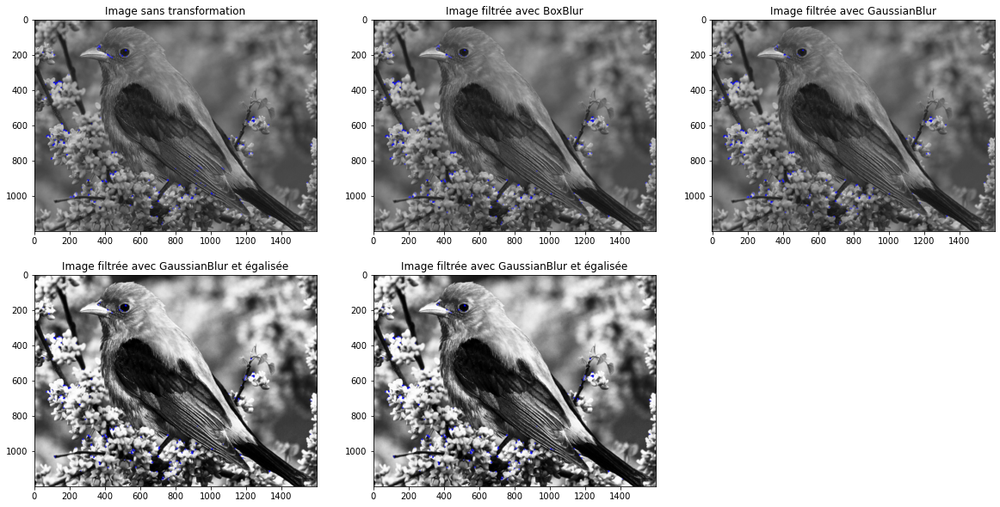

In [191]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.imshow(imageGrayORB, cmap='gray')
plt.title('Image sans transformation')

plt.subplot(2, 3, 2)
plt.imshow(imageBoxBlurORB, cmap='gray')
plt.title('Image filtrée avec BoxBlur')

plt.subplot(2, 3, 3)
plt.imshow(imageGaussianBlurORB, cmap='gray')
plt.title('Image filtrée avec GaussianBlur')

plt.subplot(2, 3, 4)
plt.imshow(imageBoxBlurEqualizeORB, cmap='gray')
plt.title('Image filtrée avec GaussianBlur et égalisée')

plt.subplot(2, 3, 5)
plt.imshow(imageGaussianBlurEqualizeORB, cmap='gray')
plt.title('Image filtrée avec GaussianBlur et égalisée')

plt.show()

Nous pouvons voir que ORB donne de très mauvais résultats, pour la suite nous nous concentrerons sur Sift.

Nous allons regarder ce que bous obtenons avec les transformations précèdentes mais on ne part pas confiant.

In [192]:
keypointsGrayRotate45ORB, descriptorsGrayRotate45ORB = orb.detectAndCompute(imageGrayRotate45Array,None)
imageGrayRotate45ORB = cv2.drawKeypoints(imageGrayRotate45Array, keypointsGrayRotate45ORB, imageGrayRotate45Array, (0, 0, 255))

In [193]:
keypointsGrayRotate90ORB, descriptorsGrayRotate90ORB = orb.detectAndCompute(imageGrayRotate90Array,None)
imageGrayRotate90ORB = cv2.drawKeypoints(imageGrayRotate90Array, keypointsGrayRotate90ORB, imageGrayRotate90Array, (0, 0, 255))

In [194]:
keypointsGrayRotate180ORB, descriptorsGrayRotate180ORB = orb.detectAndCompute(imageGrayRotate180Array,None)
imageGrayRotate180ORB = cv2.drawKeypoints(imageGrayRotate180Array, keypointsGrayRotate180ORB, imageGrayRotate180Array, (0, 0, 255))

In [195]:
keypointsGrayResizeORB, descriptorsGrayResizeORB = orb.detectAndCompute(imageGrayResizeArray,None)
imageGrayResizeORB = cv2.drawKeypoints(imageGrayResizeArray, keypointsGrayResizeORB, imageGrayResizeArray, (0, 0, 255))

Text(0.5, 1.0, 'Image ayant subit un redimmensionnement')

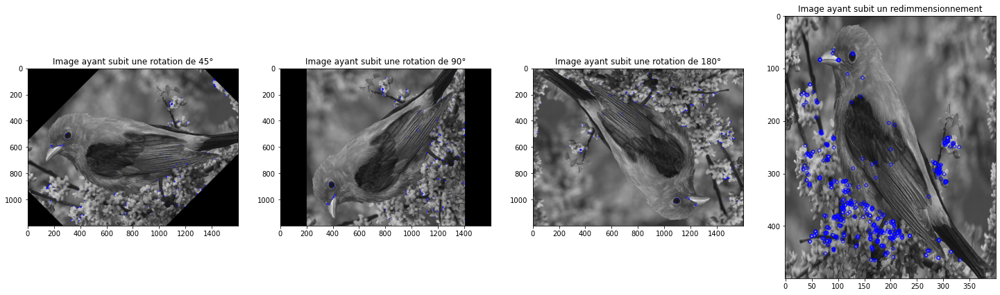

In [196]:
plt.figure(figsize=(25,10))

plt.subplot(1, 4, 1)
plt.imshow(imageGrayRotate45ORB, cmap='gray')
plt.title('Image ayant subit une rotation de 45°')

plt.subplot(1, 4, 2)
plt.imshow(imageGrayRotate90ORB, cmap='gray')
plt.title('Image ayant subit une rotation de 90°')

plt.subplot(1, 4, 3)
plt.imshow(imageGrayRotate180ORB, cmap='gray')
plt.title('Image ayant subit une rotation de 180°')

plt.subplot(1, 4, 4)
plt.imshow(imageGrayResizeORB, cmap='gray')
plt.title('Image ayant subit un redimmensionnement')

Comme précédemment ORB ne donne pas de résultats concluants.

In [197]:
print(descriptorsORB)

[[ 93   1 142 ... 242 234   0]
 [ 50 233 236 ...  20 222 222]
 [185 143  67 ... 254 248  45]
 ...
 [ 29 169 255 ... 128 199 242]
 [226 202 153 ... 248   1  41]
 [ 37 105 250 ... 179 234 134]]


Pour plus de simplicité sur le traitement des données, nous allons mettre ces dernières dans un dataframe:

In [198]:
dfDescriptorsORB = pd.DataFrame(np.array(descriptorsORB))

In [199]:
dfDescriptorsORB.head(5)

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,93,1,142,31,129,58,101,155,118,151,...,255,40,199,231,85,5,234,242,234,0
1,50,233,236,17,221,213,252,207,107,117,...,183,241,63,95,157,231,199,20,222,222
2,185,143,67,204,244,22,78,119,69,66,...,37,175,50,237,166,0,111,254,248,45
3,96,253,22,62,121,141,163,230,190,156,...,218,117,189,54,31,106,72,0,43,154
4,176,97,14,93,194,34,36,77,54,0,...,195,92,53,42,154,0,33,16,234,130


Nous pouvons voir que chaque descripteur est un vecteur de dimension 32.

Maintenant que nous avons nos features nous pouvons passer à la segmentation, mais pour ça nous devons traiter toutes nos images et non seulement une image, nous allons donc traiter toutes les images dans un premier temps.

Npus avons créer 9 nouveaux dossier d'image: ImagesGray, ImagesBoxBlur, ImagesGaussianBlur, ImagesGrayAutocontrast, ImagesBoxBlurAutocontrast, ImagesGaussianBlurAutocontrast, ImagesGrayEqualize, ImagesBoxBlurEqualize et ImagesGaussianBlurEqualize. Et nous avons ces mêmes dossiers avec les images redimmensionnées en 128x128.

Chaque dossier comprendra les images de bases traitées suivant le nom du dossier (après transformation en niveau de gris). 

Pour la suite, pour une question de temps de calcul, nous utiliserons les images redimmensionnées (128x128).

Pour la suite nous nous servirons des images après traitement (conversion en niveau de gris, réduction de bruit avec GaussianBlur et correction de la luminosité avec Equalize).

In [200]:
def Preprocess_Array(path):
    preprocess_array = []
    for image in range(Data['image'].shape[0]):
        image0 = Image.open(path + Data['image'][image])
        imageArray = np.array(image0)
        keypoints, descriptors = sift.detectAndCompute(imageArray,None)
        
        nombre_keypoints = np.size(keypoints) 
        a = [image for i in range(nombre_keypoints)]
        descriptors0 = np.c_[a, descriptors]         
        
        preprocess_array.append(descriptors0)
    return preprocess_array 

In [201]:
pathGaussianBlurEqualize = r'C:/Users/Alexis/ImagesGaussianBlurEqualize128x128/'
preprocess_listGaussianBlurEqualize = Preprocess_Array(pathGaussianBlurEqualize)

Regardons la forme de nos données:

In [202]:
preprocess_listGaussianBlurEqualize

[array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  1., ...,  2.,  4.,  2.],
        [ 0.,  1.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  1., 15., ...,  0.,  0.,  0.],
        [ 0.,  1., 14., ...,  0.,  0.,  0.],
        [ 0.,  0., 64., ...,  7.,  3.,  2.]]),
 array([[ 1., 48., 16., ...,  0.,  0.,  0.],
        [ 1.,  0.,  0., ..., 78.,  1.,  1.],
        [ 1., 13.,  8., ...,  0.,  0.,  0.],
        ...,
        [ 1.,  0.,  0., ...,  0.,  0., 16.],
        [ 1.,  2.,  2., ...,  0.,  0.,  0.],
        [ 1.,  1.,  5., ...,  0.,  0.,  0.]]),
 array([[  2.,   3.,   1., ...,   0.,   0.,   0.],
        [  2.,   8.,  10., ...,   0.,   0.,   0.],
        [  2.,   2.,   1., ...,   0.,   0.,   0.],
        ...,
        [  2.,  86.,   3., ...,   0.,   0.,   0.],
        [  2.,   0.,   4., ...,   0.,   0.,   4.],
        [  2., 154.,  78., ...,   1.,   0.,   2.]]),
 array([[  3.,   8.,  56., ...,   0.,   1.,   4.],
        [  3.,  27.,  14., ...,   0., 124.,  91.],
       

In [203]:
df = pd.DataFrame(preprocess_listGaussianBlurEqualize)

C:\Users\Alexis\anaconda3\lib\site-packages\pandas\core\internals\construction.py:309: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  values = np.array([convert(v) for v in values])


In [204]:
df

,0
0,"[[0.0, 0.0, 0.0, 0.0, 3.0, 13.0, 139.0, 95.0, ..."
1,"[[1.0, 48.0, 16.0, 1.0, 0.0, 29.0, 57.0, 35.0,..."
2,"[[2.0, 3.0, 1.0, 0.0, 2.0, 16.0, 14.0, 60.0, 1..."
3,"[[3.0, 8.0, 56.0, 101.0, 12.0, 0.0, 0.0, 0.0, ..."
4,"[[4.0, 73.0, 135.0, 31.0, 8.0, 0.0, 0.0, 0.0, ..."
...,...
1045,"[[1045.0, 11.0, 15.0, 14.0, 0.0, 0.0, 0.0, 0.0..."
1046,"[[1046.0, 87.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1047,"[[1047.0, 0.0, 4.0, 93.0, 42.0, 0.0, 0.0, 0.0,..."
1048,"[[1048.0, 0.0, 0.0, 0.0, 0.0, 1.0, 52.0, 34.0,..."


Nous récupérons une liste de liste, pour chaque individus (de la liste) nous avons une liste de vecteur (descripteur) de dimensions 128 comme nous pouvons le voir ci-dessous.

Ces vecteurs sont liés à des points clés d'une image, il y aura donc des individus (de la liste) ayant plus de vecteurs.

Un descripteur est un vecteur qui décrit le voisinage de la feature à laquelle il est associé. Il est utilisé pour repérer les paires de features qui se ressemblent le plus dans deux images. Pour faciliter cette étape de matching, le descripteur doit présenter de nombreuses propriétés d'invariance (rotation, échelle, illumination).

In [205]:
pd.DataFrame(preprocess_listGaussianBlurEqualize[0])

,0,1,2,3,4,5,6,7,8,9,...,119,120,121,122,123,124,125,126,127,128
0,0.0,0.0,0.0,0.0,3.0,13.0,139.0,95.0,1.0,28.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,1.0,13.0,82.0,97.0,107.0,122.0,2.0,37.0,...,43.0,8.0,1.0,7.0,10.0,7.0,1.0,2.0,4.0,2.0
2,0.0,1.0,0.0,1.0,20.0,10.0,11.0,27.0,5.0,1.0,...,1.0,11.0,3.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0
3,0.0,6.0,4.0,2.0,48.0,119.0,1.0,0.0,0.0,139.0,...,97.0,96.0,1.0,3.0,0.0,0.0,0.0,2.0,90.0,19.0
4,0.0,0.0,5.0,47.0,115.0,62.0,0.0,0.0,0.0,39.0,...,40.0,18.0,8.0,67.0,4.0,0.0,0.0,1.0,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,0.0,163.0,2.0,0.0,0.0,3.0,0.0,0.0,5.0,128.0,...,24.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0
206,0.0,0.0,24.0,149.0,0.0,0.0,1.0,21.0,1.0,6.0,...,1.0,11.0,15.0,7.0,24.0,2.0,7.0,0.0,0.0,0.0
207,0.0,1.0,15.0,45.0,12.0,0.0,0.0,134.0,134.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
208,0.0,1.0,14.0,56.0,21.0,0.0,0.0,91.0,129.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Cependant comme nous l'avons mentionné plus haut, nous avons 1050 listes de descripteurs (1 par image), pour la suite nous allons transformer cette liste en dataframe.

In [206]:
def mefData(liste):
    dfmef = pd.DataFrame()
    for i in range(len(liste)):
        dfmef = pd.concat([dfmef, pd.DataFrame(liste[i])])
    
    return dfmef

In [207]:
mefdataGaussianBlurEqualize = mefData(preprocess_listGaussianBlurEqualize)

In [208]:
mefdataGaussianBlurEqualize[0] = mefdataGaussianBlurEqualize[0].astype('int')

In [209]:
mefdataGaussianBlurEqualize

,0,1,2,3,4,5,6,7,8,9,...,119,120,121,122,123,124,125,126,127,128
0,0,0.0,0.0,0.0,3.0,13.0,139.0,95.0,1.0,28.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,0.0,1.0,13.0,82.0,97.0,107.0,122.0,2.0,37.0,...,43.0,8.0,1.0,7.0,10.0,7.0,1.0,2.0,4.0,2.0
2,0,1.0,0.0,1.0,20.0,10.0,11.0,27.0,5.0,1.0,...,1.0,11.0,3.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0
3,0,6.0,4.0,2.0,48.0,119.0,1.0,0.0,0.0,139.0,...,97.0,96.0,1.0,3.0,0.0,0.0,0.0,2.0,90.0,19.0
4,0,0.0,5.0,47.0,115.0,62.0,0.0,0.0,0.0,39.0,...,40.0,18.0,8.0,67.0,4.0,0.0,0.0,1.0,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263,1049,0.0,0.0,0.0,6.0,1.0,0.0,0.0,0.0,0.0,...,30.0,39.0,4.0,19.0,30.0,17.0,0.0,0.0,0.0,5.0
264,1049,0.0,0.0,0.0,5.0,4.0,10.0,26.0,9.0,0.0,...,37.0,29.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
265,1049,15.0,5.0,30.0,13.0,54.0,12.0,2.0,29.0,3.0,...,1.0,19.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
266,1049,77.0,72.0,2.0,0.0,0.0,23.0,90.0,45.0,77.0,...,33.0,24.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0


Maintenant que nous avons les descripteurs de toutes nos images (sous forme de dataset) nous pouvons nous attaquer à la récupération des visuals words.
Nous allons maintenant utiliser l’algorithme de clustering k-means et trouvez les visuals words qui seront les points centraux.

Avant de choisir un nombre de cluster (et de point centraux donc) nous allons regarder rapidement le nombre d'objet de catégorie différente afin d'être au plus prêt de la vérité.

Regardons les catégories 2 et 3 de chaque objet afin d'avoir plus de renseignement.

In [210]:
print(Data['Categorie2'].unique().shape[0])
print(Data['Categorie2'].unique())

63
['Curtains & Accessories' 'Baby Bath & Skin' 'Bed Linen' 'Wrist Watches'
 'Living Room Furnishing' 'Bath Linen' 'Candles & Fragrances'
 'Tableware & Cutlery' 'Lighting' 'JMD Home Furnishing' 'Infant Wear'
 "Kripa's Home Furnishing" 'Hair Care' 'Coffee Mugs' 'Network Components'
 'Tablet Accessories' 'Cookware' 'Laptop Accessories' 'Makeup'
 'Combos and Kits' 'Feeding & Nursing' 'Baby Bedding'
 'Kitchen & Dining Linen' 'Containers & Bottles'
 'Consumables & Disposables' 'Wall Decor & Clocks'
 'Table Decor & Handicrafts' 'Flowers, Plants & Vases' 'Software'
 'Showpieces' 'Furniture & Furnishings' 'Decorative Lighting & Lamps'
 'Baby Grooming' 'Computer Peripherals' 'Cushions, Pillows & Covers'
 'Storage' 'Health Care' 'Body and Skin Care' 'Kitchen Tools'
 'TRUE Home Decor & Festive Needs"]' 'Living' 'Showpiece'
 'Bar & Glassware' 'Fragrances' "Women's Hygiene"
 'Diapering & Potty Training' 'Strollers & Activity Gear'
 'Tidy Home Furnishing' 'Pressure Cookers & Pans' 'Bath and Spa' 'La

In [211]:
print(Data['Categorie3'].unique().shape[0])
print(Data['Categorie3'].unique())

247
['Curtains' 'Baby Bath Towels' 'Bedsheets' 'Maserati Time Wrist Watches"]'
 'Camerii Wrist Watches"]' 'T STAR Wrist Watches"]'
 'Alfajr Wrist Watches"]' 'TAG Heuer Wrist Watches"]'
 'Calibro Wrist Watches"]' 'Cartier Wrist Watches"]'
 'Lois Caron Wrist Watches"]' 'Titan Wrist Watches"]'
 'Srushti Art Jewelry Wrist Watches"]' 'Escort Wrist Watches"]'
 'Jack klein Wrist Watches"]' 'North Moon Wrist Watches"]'
 'Franck Bella Wrist Watches"]' 'Ridas Wrist Watches"]'
 'Skmei Wrist Watches"]' 'Now Wrist Watches"]' 'fastrack Wrist Watches"]'
 'Disney Wrist Watches"]' 'Vizion Wrist Watches"]'
 'Elantra Wrist Watches"]' 'Marvel Wrist Watches"]'
 'Lenco Wrist Watches"]' 'D\'Signer Wrist Watches"]' 'Diwan Sets'
 'Duvet Covers' 'Bath Mats"]' 'Home Fragrances' 'Jug, Glass & Tray Sets'
 'Bulbs' 'JMD Printed Cushions Cover (Pack of 2, 40 cm*40 ..."]'
 "Baby Girls' Clothes"
 'Kripa\'s Printed Cushions Cover (Pack of 2, 45 cm..."]' 'Conditioners'
 'AKUP Coffee Mugs' 'Routers' 'Keyboards' 'Casserole

Nous pouvons voir que nous avons 63 catégories différentes pour la 2eme catégories des objets et 247 mais c'est vraiment de trop ce sont des divisions de divisions de catégories. Pour la suite nous prendrons donc 63 clusters (points centraux donc).

In [212]:
kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

labels = []
centroids = []

Kmeans = KMeans(n_clusters = 63, **kmeans_kwargs).fit(mefdataGaussianBlurEqualize.loc[:,1:])
labels.append(Kmeans.labels_)
centroids.append(Kmeans.cluster_centers_)

In [213]:
pd.DataFrame(Kmeans.cluster_centers_)

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,36.693479,27.535459,22.178010,22.298429,23.492147,11.363160,8.656830,13.011423,119.493099,58.014755,...,28.359829,45.832937,10.968586,7.697763,8.518801,8.731080,8.462161,7.732984,12.457401,12.159448
1,19.995262,22.481778,19.876822,30.979227,53.270408,30.986880,7.470845,7.998178,62.777697,45.512391,...,21.082362,23.338192,27.701895,27.197157,19.489431,14.281706,13.038630,13.619534,16.244898,21.090743
2,82.879764,27.346189,8.821234,8.375227,17.097550,10.295372,8.491833,28.349819,41.734574,14.151089,...,7.102087,30.037659,47.549456,19.927405,10.809437,9.297641,9.356171,4.463702,4.301270,13.534483
3,96.808152,29.137505,5.840675,4.509263,7.381639,3.172911,3.671470,20.121037,106.531083,31.309181,...,2.270893,28.804446,48.098394,13.349938,6.383285,5.472622,5.809798,2.444216,2.129683,8.610128
4,27.324366,14.272483,13.382014,17.105688,16.878171,19.231360,31.406995,39.676403,39.631822,13.328593,...,20.298232,19.242506,18.526518,20.447348,30.098770,34.740200,26.566103,18.301307,17.541891,17.934281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,22.597608,15.654410,17.554559,17.504933,17.029297,9.604783,8.648132,12.066368,64.128849,26.782960,...,6.074141,32.620628,124.733931,25.015247,2.278625,1.644544,2.821824,0.899253,1.200897,22.865172
59,19.905145,15.132235,19.142685,22.474678,19.468248,16.515273,21.536174,23.658360,36.707395,23.979904,...,8.043006,7.546624,10.467846,24.677653,87.942926,62.883842,9.529341,4.067524,9.519695,12.284566
60,99.234773,32.816885,6.904395,6.831920,8.112182,2.742483,3.282190,24.268311,121.229761,46.253662,...,19.784117,32.111411,19.000386,14.588666,16.577872,18.774480,19.761758,13.802621,16.380108,19.490362
61,59.331644,49.105021,16.833257,9.807001,9.038231,9.452326,10.154307,24.236757,45.130815,38.769691,...,7.334869,20.444035,24.693690,31.857669,29.458775,24.062644,15.427913,7.899125,6.331184,10.526025


Nous allons maintenant extraire les caractéristiques locales et comparez ces caractéristiques avec les visuals words pour créer des histogrammes pour chaque image.

In [214]:
histogramme = []
listeID = mefdataGaussianBlurEqualize[0].unique().tolist()

for i in listeID:        
    histogram = np.zeros(len(Kmeans.cluster_centers_)) 
    dfHistogramme = mefdataGaussianBlurEqualize[mefdataGaussianBlurEqualize[0] == i].loc[:,1:]         
        
    for descriptors in np.array(dfHistogramme):         
        nombre_keypoints = dfHistogramme.shape[0]        
        prediction = Kmeans.predict([descriptors]) 
        histogram[prediction] += 1 
                    
    histogramme.append(histogram)

In [215]:
datasetHistogramme = pd.DataFrame(histogramme)
datasetHistogramme

,0,1,2,3,4,5,6,7,8,9,...,53,54,55,56,57,58,59,60,61,62
0,2.0,1.0,7.0,15.0,2.0,4.0,8.0,0.0,0.0,0.0,...,4.0,2.0,0.0,2.0,4.0,2.0,0.0,27.0,20.0,0.0
1,2.0,0.0,1.0,6.0,3.0,1.0,0.0,1.0,1.0,1.0,...,0.0,1.0,2.0,1.0,4.0,2.0,1.0,4.0,2.0,4.0
2,4.0,2.0,10.0,2.0,1.0,7.0,3.0,2.0,1.0,5.0,...,16.0,1.0,0.0,2.0,4.0,2.0,1.0,2.0,0.0,2.0
3,1.0,2.0,1.0,4.0,19.0,3.0,3.0,6.0,5.0,1.0,...,0.0,0.0,7.0,1.0,6.0,1.0,5.0,14.0,11.0,3.0
4,0.0,4.0,0.0,1.0,5.0,3.0,3.0,1.0,2.0,4.0,...,2.0,0.0,4.0,3.0,5.0,9.0,3.0,11.0,7.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,9.0,6.0,3.0,3.0,3.0,2.0,5.0,3.0,4.0,0.0,...,2.0,4.0,0.0,2.0,9.0,0.0,7.0,3.0,1.0,8.0
1046,2.0,0.0,2.0,0.0,0.0,1.0,1.0,2.0,1.0,0.0,...,0.0,2.0,1.0,1.0,1.0,2.0,0.0,1.0,1.0,2.0
1047,8.0,1.0,4.0,1.0,2.0,3.0,1.0,4.0,5.0,1.0,...,2.0,9.0,7.0,5.0,4.0,0.0,3.0,3.0,1.0,2.0
1048,1.0,1.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0


Nous pouvons dès à présent réduire la dimension de nos données, mais avant ça nous pouvons standardiser nos données.

In [216]:
std = StandardScaler()
datasetHistogramme = std.fit_transform(datasetHistogramme)

In [217]:
pd.DataFrame(datasetHistogramme)

,0,1,2,3,4,5,6,7,8,9,...,53,54,55,56,57,58,59,60,61,62
0,0.000000,-0.585621,1.946315,4.342035,-0.126873,0.397703,1.855320,-0.847308,-0.912162,-0.675069,...,0.474595,0.021010,-0.908534,-0.234085,0.744451,-0.324319,-0.915061,7.434787,7.480365,-0.856404
1,0.000000,-0.948609,-0.436465,1.261769,0.138499,-0.455098,-0.854118,-0.497319,-0.502333,-0.361708,...,-0.783007,-0.544649,-0.164705,-0.590819,0.744451,-0.324319,-0.528882,0.463592,-0.028207,0.559697
2,1.078925,-0.222633,3.137704,-0.107239,-0.392246,1.250504,0.161921,-0.147329,-0.502333,0.891735,...,4.247401,-0.544649,-0.908534,-0.234085,0.744451,-0.324319,-0.528882,-0.142599,-0.862493,-0.148353
3,-0.539463,-0.222633,-0.436465,0.577265,4.384459,0.113436,0.161921,1.252629,1.136982,-0.361708,...,-0.783007,-1.110309,1.694868,-0.590819,1.555315,-0.597840,1.015836,3.494546,3.726079,0.205672
4,-1.078925,0.503343,-0.833595,-0.449491,0.669244,0.113436,0.161921,-0.497319,-0.092504,0.578375,...,-0.154206,-1.110309,0.579124,0.122649,1.149883,1.590333,0.243477,2.585260,2.057508,0.559697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,3.776239,1.229320,0.357795,0.235013,0.138499,-0.170831,0.839281,0.202661,0.727153,-0.675069,...,-0.154206,1.152329,-0.908534,-0.234085,2.771611,-0.871362,1.788194,0.160496,-0.445350,1.975799
1046,0.000000,-0.948609,-0.039335,-0.791743,-0.657618,-0.455098,-0.515438,-0.147329,-0.502333,-0.675069,...,-0.783007,0.021010,-0.536619,-0.590819,-0.471846,-0.324319,-0.915061,-0.445695,-0.445350,-0.148353
1047,3.236776,-0.585621,0.754925,-0.449491,-0.126873,0.113436,-0.515438,0.552650,1.136982,-0.361708,...,-0.154206,3.980626,1.694868,0.836116,0.744451,-0.871362,0.243477,0.160496,-0.445350,-0.148353
1048,-0.539463,-0.585621,-0.039335,-0.791743,-0.657618,-0.739365,-0.854118,-0.147329,-0.912162,-0.675069,...,-0.468606,-1.110309,-0.908534,-0.947553,-0.877278,-0.597840,-0.915061,-0.748790,-0.862493,0.205672


### Réduction de la dimension

In [218]:
acp = PCA(n_components=0.95)
df_reduced = acp.fit_transform(datasetHistogramme)
print(df_reduced.shape)

(1050, 51)


In [319]:
X_acpH = pd.DataFrame(datasetHistogramme).values
featuresH = pd.DataFrame(datasetHistogramme).columns

In [321]:
pcsH = acp.components_
pca_graphH = PCA()
df_reduced_graphH = pca_graphH.fit_transform(datasetHistogramme)

scree_graphH = pca_graphH.explained_variance_ratio_ * 100

<BarContainer object of 63 artists>

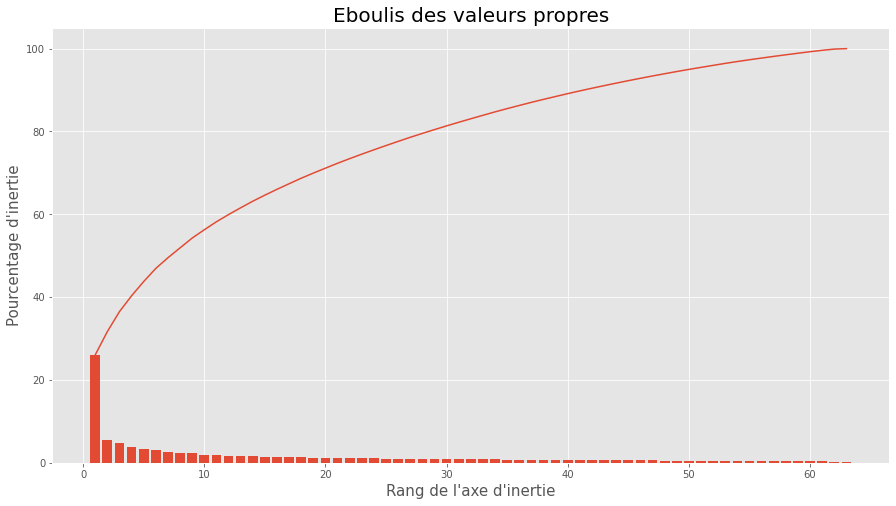

In [322]:
plt.figure(figsize=(15, 8))

plt.title("Eboulis des valeurs propres", fontsize = 20)
plt.xlabel("Rang de l'axe d'inertie", fontsize = 15)
plt.ylabel("Pourcentage d'inertie", fontsize = 15)
plt.plot(np.arange(len(scree_graphH))+1, scree_graphH.cumsum())
plt.bar(np.arange(len(scree_graphH))+1, scree_graphH)

Nous allons maintenant passer au clustering avec KMeans, pour la suite nous garderons les images qui fournissent le meilleur coefficient de silhouette.

### Clustering

Nous allons montrer rapidement comment utiliser KMeans pour un dossier d'image, nous procéderons de la même manière pour les autres dossier, pour alléger le notebook il n'y a donc que cet exemple mais le code sera bien réalisé sur tous les dossiers.

In [219]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sse = [] 
silhouette = []
labels = []
listeKMeans = []

for i in n_clusters:
    Kmeans = KMeans(n_clusters=i, **kmeans_kwargs).fit(df_reduced)
    labels.append(Kmeans.labels_)
    listeKMeans.append(Kmeans)
    sse.append(Kmeans.inertia_)
    silhouette_avg = silhouette_score(df_reduced, Kmeans.labels_, metric='euclidean')
    silhouette.append(silhouette_avg)

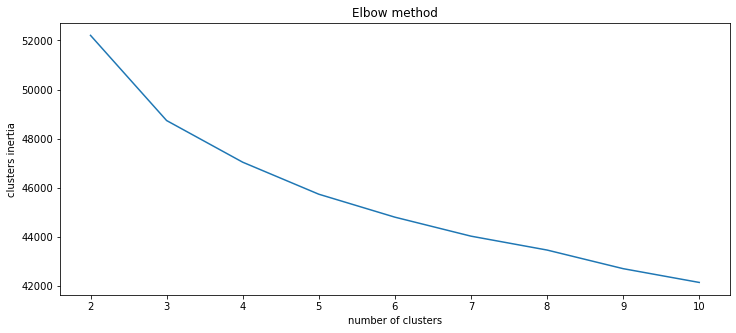

In [220]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sse, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

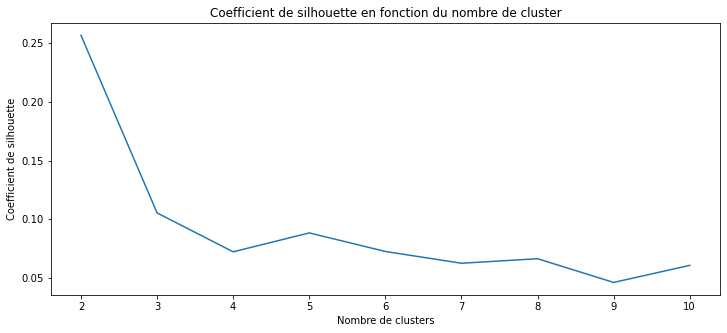

In [221]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouette, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

Pour l'ensemble des dossiers d'image nous aurons un coefficient de silhouette de 0.25, ces résultats nous indique clairement que le partitionnement des clusters est mauvais.

A la vue de ces résultats une classification automatique avec de bons résultats n'est pas réalisable.

Nous allons essayer l'approche CNN, nous allons utiliser le transfert learning.

In [222]:
ariKMeansImage = (adjusted_rand_score(Data['IDcatégorie'], labels[2]))
print('Indice de Rand ajusté pour KMeans:', ariKMeansImage)

Indice de Rand ajusté pour KMeans: 0.05350446094604964


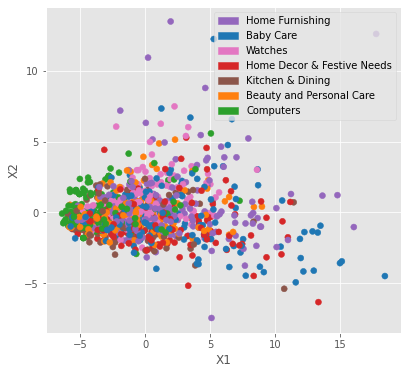

In [223]:
# Figure
plt.style.use('ggplot')
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(121)
ax.scatter(x = df_reduced[:,0], y = df_reduced[:,1], c = Data['Couleurcatégorie'])
ax.set_xlabel('X1')
ax.set_ylabel('X2')

listeLegende = []
for i in range(dfCouleurs.shape[0]):
    listeLegende.append(mpatches.Patch(color = dfCouleurs['Couleurcatégorie'][i], label = dfCouleurs['Categorie1'][i]))
plt.legend(handles = listeLegende)

plt.show() 

In [224]:
datasetHistogramme1 = datasetHistogramme.copy()

In [225]:
acp1 = PCA(n_components=0.95)
df_reduced1 = acp1.fit_transform(datasetHistogramme1)
print(df_reduced1.shape)

(1050, 51)


In [226]:
df_reduced1 = pd.DataFrame(df_reduced1)

In [227]:
df_reduced1 = pd.concat([df_reduced1, Data['Categorie1']], axis = 1)

In [228]:
df_reduced1['Categorie1'] = Encoder.fit_transform(df_reduced1['Categorie1'])

In [229]:
df_reduced1.head(5)

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,Categorie1
0,0.574856,5.147602,2.282424,-6.397246,5.913056,4.988501,-1.043662,-3.398629,-1.814956,1.644083,...,2.569570,1.691787,0.484841,-0.771584,0.594624,0.920040,0.502916,-0.068151,-0.212469,4
1,-2.580200,-0.122286,1.617322,-1.294836,-0.586630,0.774276,-0.440610,-0.409867,0.673975,0.785808,...,-0.235614,0.040980,-0.445695,-0.153668,-0.138550,0.128793,-0.332121,-0.327512,-0.289850,0
2,1.248514,7.325919,-4.891115,0.589875,4.965719,-0.472453,0.927346,2.734639,0.656583,0.209275,...,1.300843,-0.615402,0.692177,0.646495,1.667292,0.330492,-0.658755,-0.701861,-0.035123,0
3,5.449970,-1.370531,6.041553,-2.111736,0.094877,2.439974,-0.387961,0.803566,2.809838,0.438442,...,-1.730401,0.073900,1.516117,0.737646,0.449123,-0.127626,0.147690,-0.491739,-0.911859,4
4,3.035366,-0.084573,3.297438,-1.058210,0.832510,2.786106,0.899109,0.279660,1.394460,0.277038,...,1.295987,0.043450,0.619125,-0.317970,1.477965,-0.915238,-0.442190,-0.284673,-0.394838,4


In [230]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

kmeans_kwargs = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED
}

sse1 = [] 
silhouette1 = []
labels1 = []
listeKMeans1 = []

for i in n_clusters:
    Kmeans1 = KMeans(n_clusters=i, **kmeans_kwargs).fit(df_reduced1)
    labels1.append(Kmeans1.labels_)
    listeKMeans1.append(Kmeans1)
    sse1.append(Kmeans1.inertia_)
    silhouette_avg1 = silhouette_score(df_reduced1, Kmeans1.labels_, metric='euclidean')
    silhouette1.append(silhouette_avg1)

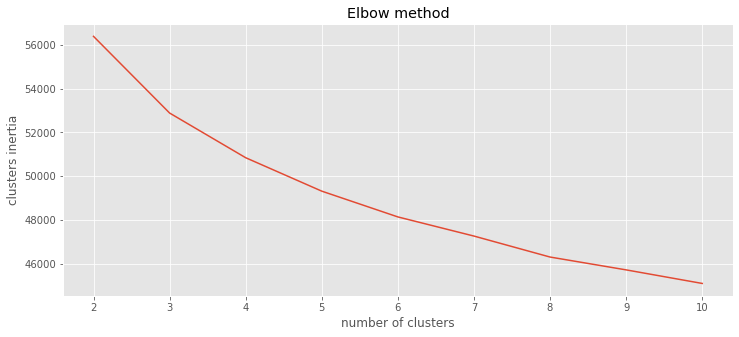

In [231]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = sse1, ax=ax)
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
plt.show()

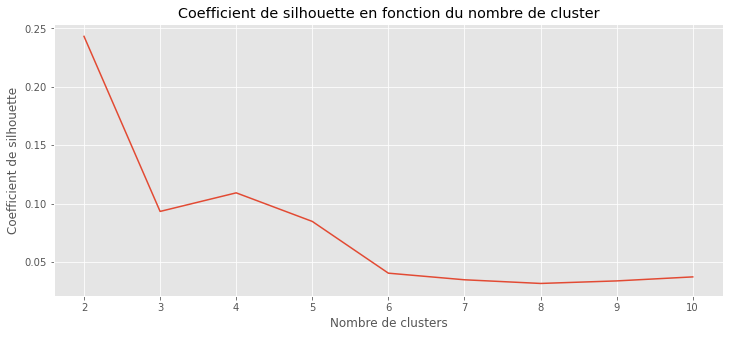

In [287]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(x = n_clusters, y = silhouette1, ax=ax)
ax.set_title("Coefficient de silhouette en fonction du nombre de cluster")
ax.set_xlabel("Nombre de clusters")
ax.set_ylabel("Coefficient de silhouette")
plt.show()

In [330]:
ariKMeansImage = (adjusted_rand_score(Data['IDcatégorie'], labels1[5]))
print('Indice de Rand ajusté pour KMeans:', ariKMeansImage)

Indice de Rand ajusté pour KMeans: 0.2320598172169222


Regardons la représentation T-SNE:

In [324]:
tsne1 = manifold.TSNE(n_components=2, init = 'pca', n_jobs=-1)
X_tsne1 = tsne1.fit_transform(datasetHistogramme1)
X_tsne1.shape

(1050, 2)

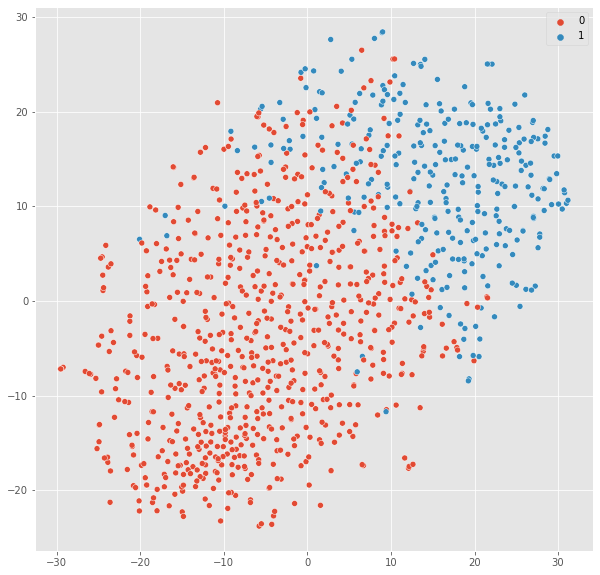

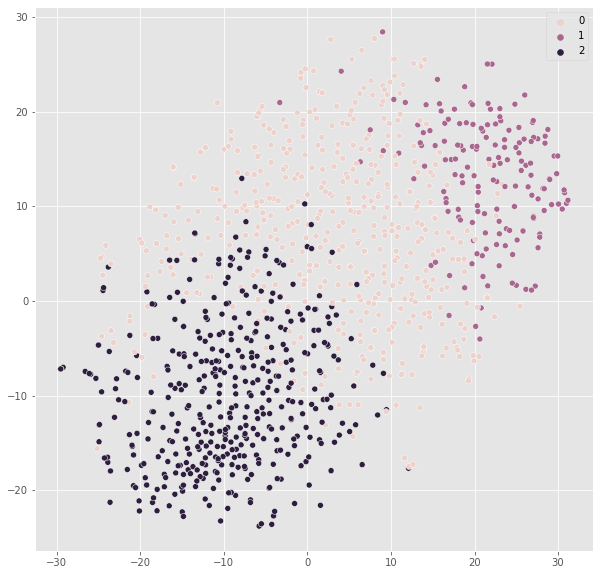

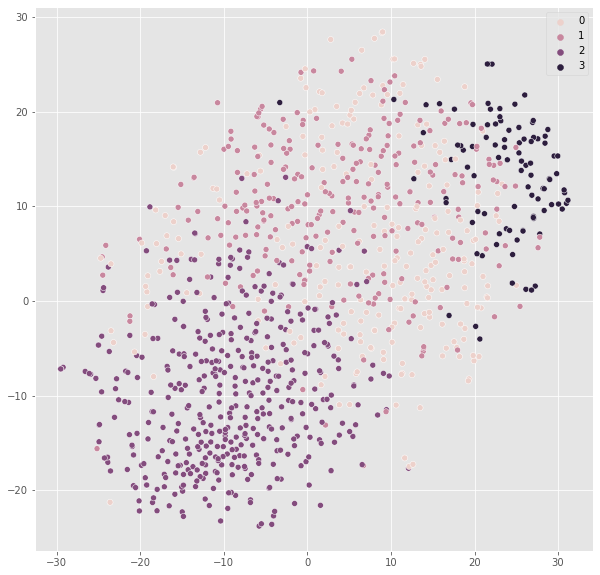

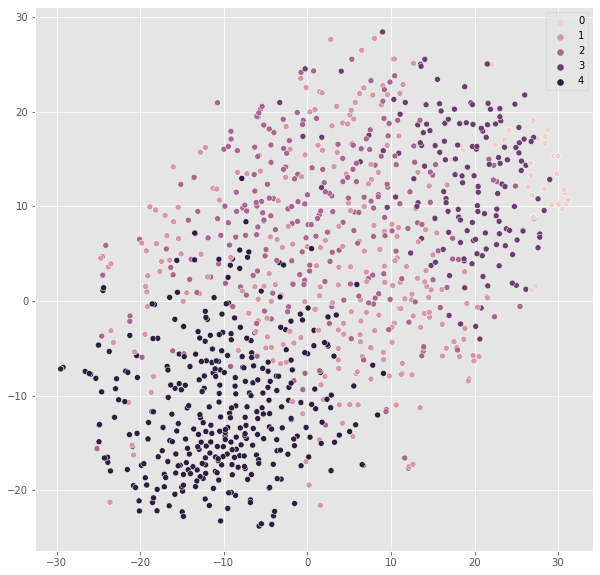

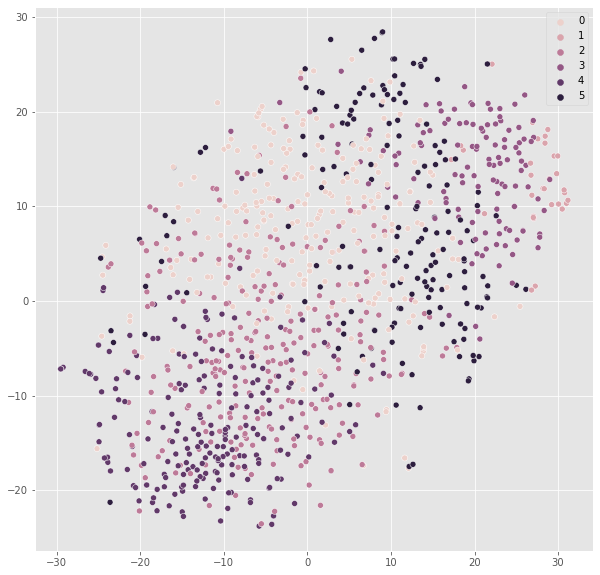

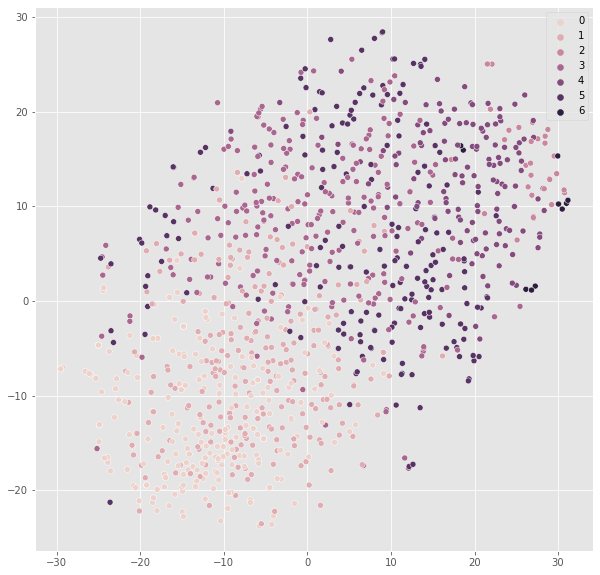

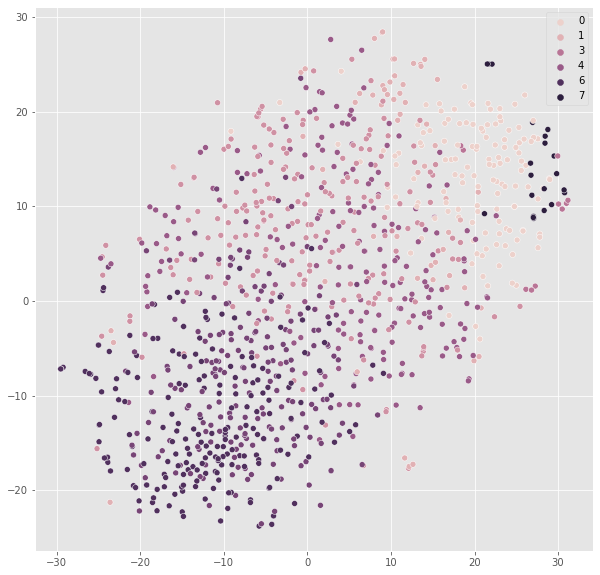

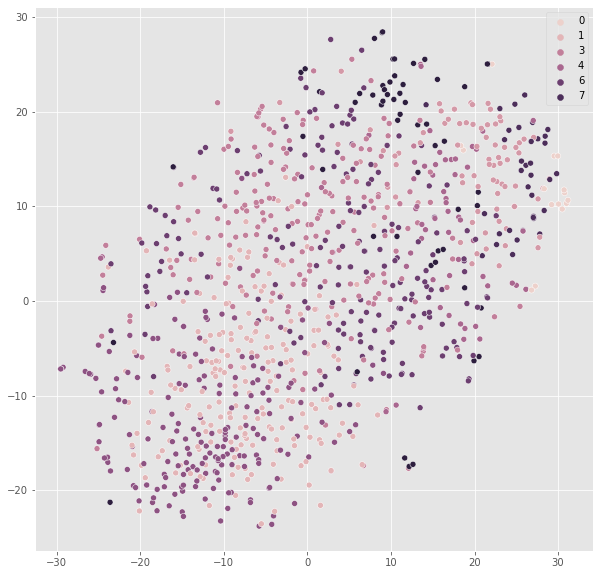

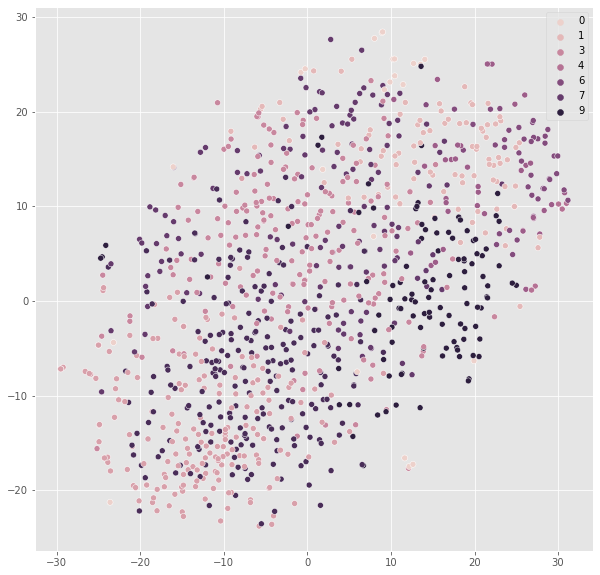

In [326]:
for i in range(0, 9, 1):
    plt.figure(figsize = (10, 10))
    sns.scatterplot(x = X_tsne1[:, 0], y = X_tsne1[:, 1], hue = labels1[i])

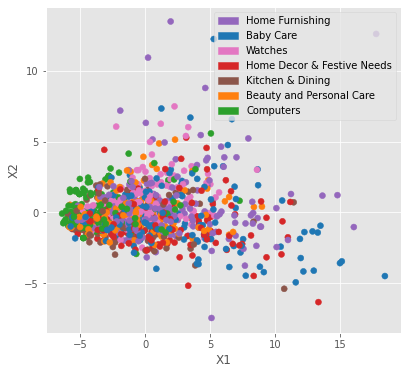

In [233]:
# Figure
plt.style.use('ggplot')
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(121)
ax.scatter(x = df_reduced1.to_numpy()[:,0], y = df_reduced1.to_numpy()[:,1], c = Data['Couleurcatégorie'])
ax.set_xlabel('X1')
ax.set_ylabel('X2')

listeLegende = []
for i in range(dfCouleurs.shape[0]):
    listeLegende.append(mpatches.Patch(color = dfCouleurs['Couleurcatégorie'][i], label = dfCouleurs['Categorie1'][i]))
plt.legend(handles = listeLegende)

plt.show() 

Comme nous pouvons le voir avec le coefficient de silhouette et le score de Rand ajusté, nous obtenons de mauvais résultat. 

Regardons ce que nous obtenons 

Nous allons regarder ce que nous obtiendrons avec l'apprentissage supervisée en utilisant le transfert learning.

### Classification supervisée

Pour commencer nous allons spliter notre base d'image en une base d'entraînement et en une base de test.

In [234]:
pathTrain = r'C:/Users/Alexis/Train/' 
pathTest = r'C:/Users/Alexis/Test/' 
pathValidation = r'C:/Users/Alexis/Validation/' 

if os.path.exists(pathTrain) == False:
    os.mkdir(r'C:/Users/Alexis/Train/')

if os.path.exists(pathTest) == False:
    os.mkdir(r'C:/Users/Alexis/Test/')
    
if os.path.exists(pathValidation) == False:
    os.mkdir(r'C:/Users/Alexis/Validation/')

#os.mkdir(r'C:\Users\Alexis\Train')
#os.mkdir(r'C:\Users\Alexis\Test')
#os.mkdir(r'C:\Users\Alexis\Validation')

In [235]:
X = Data[['uniq_id', 'image', 'Categorie1', 'IDcatégorie']].copy()
Y = Data[['uniq_id', 'Categorie1', 'IDcatégorie']]

Pour la suite nous créerons un sous-dossier dans chaque dossier Train et Test pour chaque catégorie, nous allons également mélanger les individus pour un choix plus aléatoire.

In [236]:
X0 = X.loc[X['Categorie1'] == 'Baby Care'].sample(frac=1)
X1 = X.loc[X['Categorie1'] == 'Beauty and Personal Care'].sample(frac=1)
X2 = X.loc[X['Categorie1'] == 'Computers'].sample(frac=1)
X3 = X.loc[X['Categorie1'] == 'Home Decor & Festive Needs'].sample(frac=1)
X4 = X.loc[X['Categorie1'] == 'Home Furnishing'].sample(frac=1)
X5 = X.loc[X['Categorie1'] == 'Kitchen & Dining'].sample(frac=1)
X6 = X.loc[X['Categorie1'] == 'Watches'].sample(frac=1)

Nous allons prendre 70% des images pour l'entraînement et 30% pour le test, soit 105 images pour l'entraînement et 45 pour le test et la validation.

In [237]:
listeCatégorie = ['Home Furnishing', 'Baby Care', 'Watches',
                  'Home Decor & Festive Needs', 'Kitchen & Dining',
                  'Beauty and Personal Care', 'Computers']

#### Image pour l'entrainement

In [238]:
for catégorie in listeCatégorie:
    path = r'C:/Users/Alexis/Train/' + catégorie +'/'
    if os.path.exists(path) == False:
        os.mkdir(r'C:/Users/Alexis/Train/' + catégorie +'/')
        listeImage = X[X['Categorie1'] == catégorie]['image'].values.tolist()[0:105]
    else:
        listeImage = X[X['Categorie1'] == catégorie]['image'].values.tolist()[0:105]
    
    for image in listeImage:
        shutil.copy(r'C:/Users/Alexis/Images224x224/' + image, r'C:/Users/Alexis/Train/'+catégorie+'/'+image)

#### Image pour le test

In [239]:
for catégorie in listeCatégorie:
    path = r'C:/Users/Alexis/Test/' + catégorie +'/'
    if os.path.exists(path) == False:
        os.mkdir(r'C:/Users/Alexis/Test/' + catégorie +'/')
        listeImage = X[X['Categorie1'] == catégorie]['image'].values.tolist()[105:150]
    else:
        listeImage = X[X['Categorie1'] == catégorie]['image'].values.tolist()[105:150]
    
    for image in listeImage:
        shutil.copy(r'C:/Users/Alexis/Images224x224/' + image, r'C:/Users/Alexis/Test/'+catégorie+'/'+image)

#### Image pour la validation

In [240]:
for catégorie in listeCatégorie:
    path = r'C:/Users/Alexis/Validation/' + catégorie +'/'
    if os.path.exists(path) == False:
        os.mkdir(r'C:/Users/Alexis/Validation/' + catégorie +'/')
        listeImage = X[X['Categorie1'] == catégorie]['image'].values.tolist()[60:105]
    else:
        listeImage = X[X['Categorie1'] == catégorie]['image'].values.tolist()[60:105]
    
    for image in listeImage:
        shutil.copy(r'C:/Users/Alexis/Images224x224/' + image, r'C:/Users/Alexis/Validation/'+catégorie+'/'+image)

#### SVM

In [289]:
cv_train = KFold(n_splits = 5, shuffle = True, random_state = SEED)

In [290]:
labelTarget = Data[['Categorie1']].copy()
labelTarget.columns = ['Categorie1']
labelTarget['Categorie1'] = Encoder.fit_transform(labelTarget['Categorie1'])

In [291]:
datasetHistogramme1 = pd.DataFrame(datasetHistogramme)

In [292]:
x_train, x_test, y_train, y_test = train_test_split(datasetHistogramme, labelTarget['Categorie1'], train_size=0.7, random_state = SEED)

In [293]:
param_grid = {'C': [0.1, 1, 10, 100],
             'gamma': [0.0001, 0.001, 0.1, 1],
             'kernel': ['poly', 'rbf']
              }
            
model = GridSearchCV(svm.SVC(), param_grid, cv = cv_train, n_jobs = -1)
model.fit(x_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100],
                         'gamma': [0.0001, 0.001, 0.1, 1],
                         'kernel': ['poly', 'rbf']})

In [294]:
model.best_params_

{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}

In [295]:
y_pred = model.predict(x_test)
print("La prédiction de SVC est de:", round(accuracy_score(y_pred, y_test)*100, 2), "%.")
print("RMSE : ", math.sqrt(mean_squared_error(y_test, model.predict(x_test))))

La prédiction de SVC est de: 32.38 %.
RMSE :  2.5410908793553326


In [248]:
#df_predSVM = pd.DataFrame()
df_predSVM = pd.DataFrame(y_pred)
df_LabelSVM = pd.DataFrame(y_test).reset_index()
df_predSVM['Labels'] = df_LabelSVM['Categorie1'].copy()

In [249]:
listeCatégorieNombre = [0, 1, 2, 3, 4, 5, 6]

In [250]:
for catégorie in listeCatégorieNombre:
    count = 0
    for i in range(df_predSVM.shape[0]):
        if df_predSVM[0].values[i] == catégorie:
            count += 1
    print("Catégorie:", catégorie, ", nombre:", count, "soit ", round(count*100/df_predSVM.shape[0], 1) , '% de bonne classification.')

Catégorie: 0 , nombre: 49 soit  15.6 % de bonne classification.
Catégorie: 1 , nombre: 52 soit  16.5 % de bonne classification.
Catégorie: 2 , nombre: 63 soit  20.0 % de bonne classification.
Catégorie: 3 , nombre: 40 soit  12.7 % de bonne classification.
Catégorie: 4 , nombre: 25 soit  7.9 % de bonne classification.
Catégorie: 5 , nombre: 50 soit  15.9 % de bonne classification.
Catégorie: 6 , nombre: 36 soit  11.4 % de bonne classification.


Nous pouvons voir que la classification SVM donne des résultats plus que moyen, regardons un autre algorithme de classification supervisée.

In [251]:
param_rfr = {'n_estimators' : [800, 1200],
             'max_depth' : [15, 30, None],            
             'max_features': ['auto', 'sqrt', 'log2'],
             'min_samples_leaf': [1, 2],
             'min_samples_split': [2, 5]
            }
            
modelRFR = GridSearchCV(RandomForestRegressor(), param_rfr, cv = cv_train, n_jobs = -1)
modelRFR.fit(x_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [15, 30, None],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [800, 1200]})

In [252]:
modelRFR.best_params_

{'max_depth': 15,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 800}

In [253]:
print("RMSE : ", math.sqrt(mean_squared_error(y_test, modelRFR.predict(x_test))))

RMSE :  1.926961569910372


#### CNN (Convolutional Neural Network)

Créer notre propre CNN est possible cepandant en avoir un qui donnerai de très bons résultats est autre chose qui demanderait plus d'image, nous nous focaliserons içi sur le transfert learning et nous utiliserons VGG16.

Ce dernier prend en entrée des images de tailles 224x224x3, nous allons donc devoir dans un premier temps retravailler nos images.

In [254]:
#Image.MAX_IMAGE_PIXELS = None
#for image in range(Data.shape[0]):
#    image0 = Image.open(r'C:/Users/Alexis/Images/' + Data['image'][image])
#    image1 = image0.resize((224, 224))
#    image1.save(r'C:/Users/Alexis/Images224x224/' + Data['image'][image])

Regardons un exemple rapide de ce que l'on peut avoir avec une image, nous reprendrons l'image que l'on a pris jusque là.

In [255]:
model = VGG16()

In [256]:
imageVGG16 = Image.open(r'C:\Users\Alexis\Images224x224\d136aa676ef52b09eab65762940957fe.jpg')

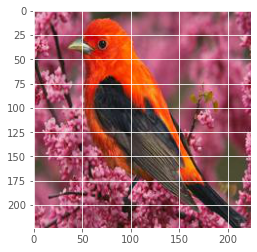

In [257]:
plt.imshow(imageVGG16)

Avant de voir ce que nous donne VGG16 comme résultat de classification, regardons a quelle classe appartient l'oiseau ici présent dans le dataset:

In [258]:
Data.loc[Data['image'] == 'd136aa676ef52b09eab65762940957fe.jpg']

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,...,product_specifications,Categorie1,Categorie2,Categorie3,IDcatégorie,Couleurcatégorie,newDescription,newDescriptionStem,labels,Categorie1Encoder
905,d136aa676ef52b09eab65762940957fe,2016-04-02 19:26:28 +0000,http://www.flipkart.com/scarlet-tanager-bird-n...,scarlet tanager bird normal POSTER Paper Print,POSEH3PXQEB6ZCXD,899.0,529.0,d136aa676ef52b09eab65762940957fe.jpg,False,Key Features of scarlet tanager bird normal PO...,...,"{""product_specification""=>[{""key""=>""Paper Dept...",Home Decor & Festive Needs,Wall Decor & Clocks,Posters,3,#d62728,key feature scarlet tanager bird normal poster...,key featur scarlet tanag bird normal poster pa...,9,3


Cet oiseau appartient à la catégorie Home Decor & Festive Needs, je ne pense pas que l'on retrouvera cette classe avec VGG16, mais ne sait on jamais, regardons ça.

In [259]:
img = load_img(r'C:\Users\Alexis\Images224x224\d136aa676ef52b09eab65762940957fe.jpg')  # Charger l'image
img = img_to_array(img)  # Convertir en tableau numpy
img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))  # Créer la collection d'images (un seul échantillon)
img = preprocess_input(img)  # Prétraiter l'image comme le veut VGG-16

Nous pouvons maintenant donner l'image en entrée du réseau et prédire sa classe :

In [260]:
y = model.predict(img) 

In [261]:
print('Top 3 :', decode_predictions(y, top=3)[0])

Top 3 : [('n01820546', 'lorikeet', 0.7676914), ('n04604644', 'worm_fence', 0.05068266), ('n01558993', 'robin', 0.024736932)]


VGG16 a bien reconnu que c'était un oiseau, mais il n'a pas donné la bonne espèce, pour lui l'oiseau est un Loriquet alors que c'est un Piranga écarlate.

Ce qui peut être logique, on ne sait pas sur quelle espèce le réseau a été entrainé, s'il n'a pas été entrainé sur la classe "Pirangua" c'est normal qu'il ne fournisse pas ce résultat, cependant s'il l'a été c'est un peu plus problématique.
Nous avons que les classes suivantes à notre disposition: 

    Baby Care  (ID: 0)
    Beauty and Personal Care  (ID: 1)  
    Computers  (ID: 2) 
    Home Decor & Festive Needs  (ID: 3) 
    Home Furnishing  (ID: 4) 
    Kitchen & Dining  (ID: 5)
    Watches  (ID: 6)
    
Le transfert learning va donc avoir son intérêt ici.

Passons maintenant au transfert learning.

In [262]:
# Charger VGG-16 pré-entraîné sur ImageNet et sans les couches fully-connected
model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Récupérer la sortie de ce réseau
x = model.output
x = GlobalMaxPooling2D()(x)
x = Dense(4096,activation='relu')(x)
x = Dense(4096,activation='relu')(x)

# Ajouter la nouvelle couche fully-connected pour la classification de nos 7 classes
predictions = Dense(7, activation='softmax')(x)

# Définir le nouveau modèle
new_model = Model(inputs=model.input, outputs=predictions)

Comme notre base d'image n'est pas très grande et que les images sont assez différentes de celles sur lesquelles le réseau a été entrainé, nous allons utiliser le fine-tunning partiel.

In [263]:
# Ne pas entraîner les 5 premières couches (les plus basses) 
for layer in model.layers[:5]:
    layer.trainable = False

In [264]:
# Load the normalized images
train_datagen = ImageDataGenerator(rescale = 1./255)
validation_datagen = ImageDataGenerator(rescale = 1./255)
 

# Change the batchsize according to your system RAM
train_batchsize = 100
val_batchsize = 10 

# Data generator for training data
train_generator = train_datagen.flow_from_directory(
        r'C:/Users/Alexis/Train/',
        target_size=(224, 224),
        batch_size=train_batchsize,
        class_mode='categorical') 

# Data generator for validation data
validation_generator = validation_datagen.flow_from_directory(
        r'C:/Users/Alexis/Validation/',
        target_size=(224, 224),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=True)

Found 735 images belonging to 7 classes.
Found 315 images belonging to 7 classes.


In [265]:
image_batch, label_batch = next(iter(train_generator))
feature_batch = model(image_batch)
print(feature_batch.shape)

(100, 7, 7, 512)


In [266]:
new_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [267]:
# Compiler le modèle 
new_model.compile(loss="categorical_crossentropy", optimizer=optimizers.SGD(learning_rate=0.0001, momentum=0.9), metrics=["accuracy"])

In [268]:
model_info = new_model.fit(
      train_generator,
      steps_per_epoch = train_generator.samples/train_generator.batch_size,
      epochs = 25,
      validation_data = validation_generator,
      validation_steps = validation_generator.samples/validation_generator.batch_size, verbose=1
    )

Epoch 1/25
7/7 [==============================] - 627s 87s/step - loss: 1.9504 - accuracy: 0.1469 - val_loss: 1.9342 - val_accuracy: 0.1429
Epoch 2/25
7/7 [==============================] - 628s 87s/step - loss: 1.9035 - accuracy: 0.2041 - val_loss: 1.8751 - val_accuracy: 0.2571
Epoch 3/25
7/7 [==============================] - 731s 111s/step - loss: 1.8328 - accuracy: 0.3320 - val_loss: 1.8078 - val_accuracy: 0.3810
Epoch 4/25
7/7 [==============================] - 824s 115s/step - loss: 1.7675 - accuracy: 0.4585 - val_loss: 1.7338 - val_accuracy: 0.4952
Epoch 5/25
7/7 [==============================] - 824s 115s/step - loss: 1.6863 - accuracy: 0.5510 - val_loss: 1.6499 - val_accuracy: 0.5841
Epoch 6/25
7/7 [==============================] - 828s 115s/step - loss: 1.5966 - accuracy: 0.6299 - val_loss: 1.5546 - val_accuracy: 0.6635
Epoch 7/25
7/7 [==============================] - 868s 121s/step - loss: 1.4911 - accuracy: 0.6993 - val_loss: 1.4415 - val_accuracy: 0.6921
Epoch 8/25
7/7 

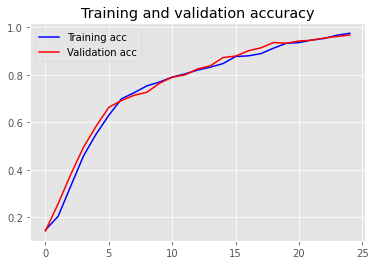

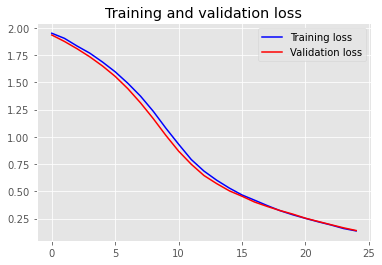

In [269]:
# Utility function for plotting of the model results

def visualize_results(history):
    # Plot the accuracy and loss curves
    acc = model_info.history["accuracy"]
    val_acc = model_info.history['val_accuracy']
    loss = model_info.history['loss']
    val_loss = model_info.history['val_loss']
    epochs = range(len(acc))
    plt.plot(epochs, acc, 'b', label='Training acc')
    plt.plot(epochs, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.figure()
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()
 

# Run the function to illustrate accuracy and loss
visualize_results(model_info)

In [270]:
new_model.evaluate_generator(generator = validation_generator)

C:\Users\Alexis\anaconda3\lib\site-packages\keras\engine\training.py:2006: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


[0.14069493114948273, 0.9682539701461792]

In [271]:
new_model.evaluate_generator(generator = train_generator)

[0.12112125754356384, 0.9823129177093506]

Nous pouvons voir un taux de bonne classification supérieur à 96% ce qui laisse présager de bonnes choses, regardons avec quelques images.

In [272]:
Test_datagen = ImageDataGenerator(rescale = 1./255)

# Data generator for validation data
Test_generator = Test_datagen.flow_from_directory(
        r'C:/Users/Alexis/Test/',
        target_size = (224, 224),
        batch_size = 1,
        class_mode = None,
        shuffle = False)

Found 315 images belonging to 7 classes.


In [273]:
Test_generator.reset()
predictions = new_model.predict(Test_generator, steps = Test_generator.samples/Test_generator.batch_size, verbose = 1)

315/315 [==============================] - 105s 333ms/step


In [274]:
predicted_classes = np.argmax(predictions, axis=1)
labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_classes]

In [275]:
filenamesTest = Test_generator.filenames
dfPred = pd.DataFrame({'Image': filenamesTest,
                        'Prediction': predictions})
dfPred

,Image,Prediction
0,Baby Care\057836ecde71565f8ebdd576e41fdc96.jpg,Home Decor & Festive Needs
1,Baby Care\0906fd9cc604fbba05a502e01d763cd9.jpg,Home Furnishing
2,Baby Care\11f06dffebf7edf9e15351834a190c2c.jpg,Baby Care
3,Baby Care\23b0bdd337f7d1b4b70ad13726a122ab.jpg,Baby Care
4,Baby Care\27b7851ae3dfc2ae8c1958cebe93bf0b.jpg,Baby Care
...,...,...
310,Watches\c91f9dc1fdd8b4d60c6b2a2b607e3e8f.jpg,Watches
311,Watches\d0e09eaa7fcc9e7de3349959800d2141.jpg,Watches
312,Watches\e24ef34ede03630207f0d367f633d8ea.jpg,Watches
313,Watches\e80e5151787eb21b0cca0d7dc3b0c338.jpg,Computers


In [276]:
listeCatégorieImage = []
for i in dfPred.index:
    catégorie = dfPred.loc[i,'Image'].split('\\')[0]
    listeCatégorieImage.append(catégorie)
    
dfPred['Image'] = listeCatégorieImage
dfPred

,Image,Prediction
0,Baby Care,Home Decor & Festive Needs
1,Baby Care,Home Furnishing
2,Baby Care,Baby Care
3,Baby Care,Baby Care
4,Baby Care,Baby Care
...,...,...
310,Watches,Watches
311,Watches,Watches
312,Watches,Watches
313,Watches,Computers


In [277]:
dfPred['PredictionToF'] = 1

In [278]:
for i in range(dfPred.shape[0]):
    if dfPred['Image'].loc[i] == dfPred['Prediction'].loc[i]:
        dfPred['PredictionToF'].loc[i] = 1
    else:
        dfPred['PredictionToF'].loc[i] = 0

C:\Users\Alexis\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [279]:
for catégorie in listeCatégorie:
    count = 0
    for i in range(45):
        count += dfPred[dfPred['Image'] == catégorie]['PredictionToF'].values[i]
    print("Catégorie:", catégorie, ", nombre:", count, "soit ", round(count*100/45, 1) , '% de bonne classification.')
    #results['count'] = count

Catégorie: Home Furnishing , nombre: 37 soit  82.2 % de bonne classification.
Catégorie: Baby Care , nombre: 21 soit  46.7 % de bonne classification.
Catégorie: Watches , nombre: 42 soit  93.3 % de bonne classification.
Catégorie: Home Decor & Festive Needs , nombre: 24 soit  53.3 % de bonne classification.
Catégorie: Kitchen & Dining , nombre: 14 soit  31.1 % de bonne classification.
Catégorie: Beauty and Personal Care , nombre: 20 soit  44.4 % de bonne classification.
Catégorie: Computers , nombre: 22 soit  48.9 % de bonne classification.


Nous pouvons voir que pour certaines classes nous avons plutôt de bons résultats, cependant pour la plupart c'est moyen voir très moyen.

Contrairement à ce qe l'on attendait c'est loin d'être parfait, nous pouvons voir que des images de la catégories Baby Care sont considérés comme appartenant à la classe Home Decor & Festive Needs.

Voyons quelques images de bonnes et mauvaises classification:

##### Mauvaise classification:

In [280]:
Image1 = Image.open(r'C:\Users\Alexis\Test\Baby Care\0906fd9cc604fbba05a502e01d763cd9.jpg')
Image2 = Image.open(r'C:\Users\Alexis\Test\Watches\e80e5151787eb21b0cca0d7dc3b0c338.jpg')
Image3 = Image.open(r'C:\Users\Alexis\Test\Home Furnishing\5be86e35f21b1514d0e7742893d6cfba.jpg')
Image4 = Image.open(r'C:\Users\Alexis\Test\Watches\e80e5151787eb21b0cca0d7dc3b0c338.jpg')
Image5 = Image.open(r'C:\Users\Alexis\Test\Kitchen & Dining\55195de3873fffaa9e37b041533d7305.jpg')

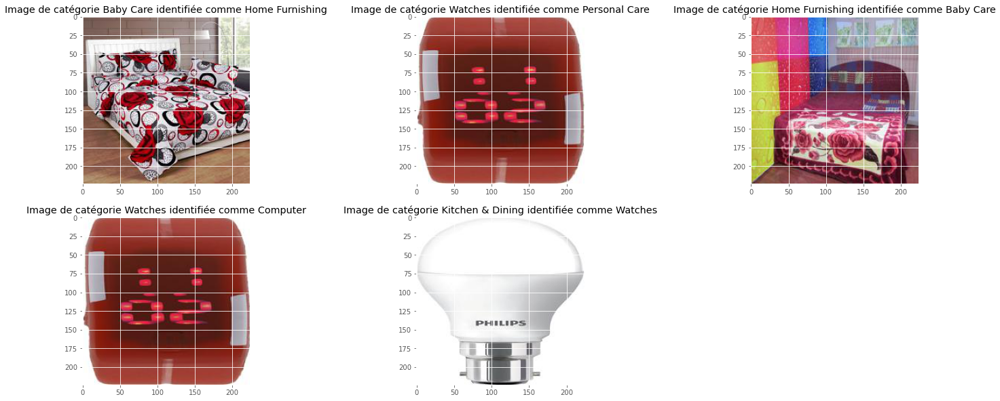

In [281]:
plt.figure(figsize=(25,10))

plt.subplot(2, 3, 1)
plt.imshow(Image1)
plt.title('Image de catégorie Baby Care identifiée comme Home Furnishing')

plt.subplot(2, 3, 2)
plt.imshow(Image2)
plt.title('Image de catégorie Watches identifiée comme Personal Care')

plt.subplot(2, 3, 3)
plt.imshow(Image3)
plt.title('Image de catégorie Home Furnishing identifiée comme Baby Care')

plt.subplot(2, 3, 4)
plt.imshow(Image4)
plt.title('Image de catégorie Watches identifiée comme Computer')

plt.subplot(2, 3, 5)
plt.imshow(Image5)
plt.title('Image de catégorie Kitchen & Dining identifiée comme Watches')

plt.show()

Pour les 2 images 1 et 3 nous pouvons comprendre la confusion, l'erreur peut venir de l'Homme qui a identifié 2 choses semblables dans 2 catégories différentes, le CNN ne peut pas "le savoir" à l'avance bien  évidemment.

L'image 4 aurait pu être dans la classe computer également.

Sur les 5 images 3 images sont de "petites erreurs", mais ça reste des erreurs, elles sont assez problématique d'ailleurs puisque qu'il n'y a pas moyen pour le réseau de neurones de le savoir surtout pour les images 1 et 3.

Cependant pour les images 2 et 5 c'est plus incompréhensible.

##### Bonne classification:

In [282]:
Image1 = Image.open(r'C:\Users\Alexis\Test\Kitchen & Dining\52877a6306aef18af67ab54c8233c931.jpg')
Image2 = Image.open(r'C:\Users\Alexis\Test\Baby Care\11f06dffebf7edf9e15351834a190c2c.jpg')
Image3 = Image.open(r'C:\Users\Alexis\Test\Beauty and Personal Care\4f8f64f93f789af51bb07296639acbd2.jpg')
Image4 = Image.open(r'C:\Users\Alexis\Test\Computers\146b0d570d5ab4e27629d48533b7680d.jpg')
Image5 = Image.open(r'C:\Users\Alexis\Test\Watches\e24ef34ede03630207f0d367f633d8ea.jpg')

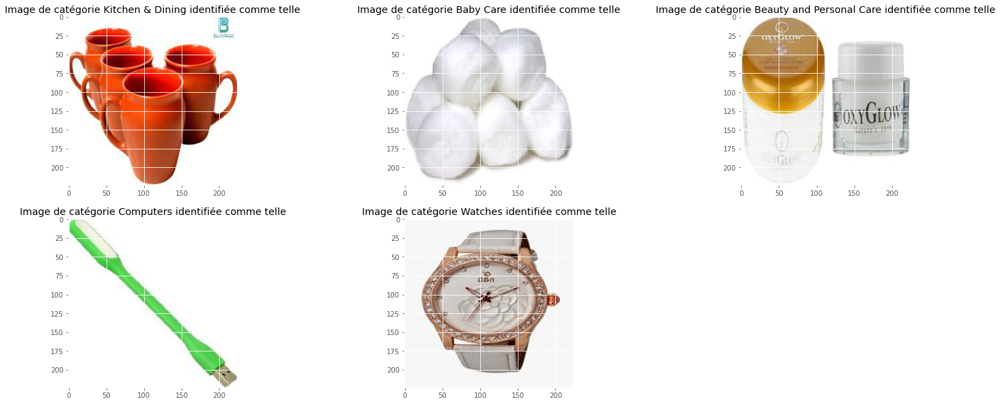

In [283]:
plt.figure(figsize=(25,10))

plt.subplot(2, 3, 1)
plt.imshow(Image1)
plt.title('Image de catégorie Kitchen & Dining identifiée comme telle')

plt.subplot(2, 3, 2)
plt.imshow(Image2)
plt.title('Image de catégorie Baby Care identifiée comme telle')

plt.subplot(2, 3, 3)
plt.imshow(Image3)
plt.title('Image de catégorie Beauty and Personal Care identifiée comme telle')

plt.subplot(2, 3, 4)
plt.imshow(Image4)
plt.title('Image de catégorie Computers identifiée comme telle')

plt.subplot(2, 3, 5)
plt.imshow(Image5)
plt.title('Image de catégorie Watches identifiée comme telle')

plt.show()

Nous obtenons bien les résultats attendus.

A travers ce projet nous avons pu avoir un aperçu de la limite de la segmentation, en effet c'est une approche non supervisée d'où sa limite rapidement atteinte, dès lors que nous intégrons le label du produits et faisons donc une classification supervisée, nous avons des résultats nettement meilleurs dans l'ensemble.